# **Imports**

In [1]:
# Libraries for data wrangling
import numpy as np
import pandas as pd

# Libraries for data visualisation
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
import folium
from folium.features import DivIcon
from IPython.display import display

# For modelling, preparation, testing etc.
from imblearn.under_sampling import RandomUnderSampler
import sklearn
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.preprocessing import MinMaxScaler
from sklearn.neighbors import KNeighborsRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error, mean_absolute_percentage_error
from sklearn.decomposition import PCA 
from sklearn.feature_selection import f_classif, chi2

# Libraries for metrics
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
from sklearn.metrics import classification_report

# Libararies for ML
from sklearn.linear_model import LogisticRegression
import xgboost
from xgboost import XGBClassifier

In [2]:
import sys
print('Python version: {}'.format(sys.version))
print('Numpy version: {}'.format(np.__version__))
print('Pandas version: {}'.format(pd.__version__))
print('Matplotlib version: {}'.format(matplotlib.__version__))
print('Seaborn version: {}'.format(sns.__version__))
print('Folium version: {}'.format(folium.__version__))
print('Scikit-learn version: {}'.format(sklearn.__version__))
print('XGBoost version: {}'.format(xgboost.__version__))

Python version: 3.13.2 | packaged by Anaconda, Inc. | (main, Feb  6 2025, 18:49:14) [MSC v.1929 64 bit (AMD64)]
Numpy version: 2.1.0
Pandas version: 2.2.3
Matplotlib version: 3.10.1
Seaborn version: 0.13.2
Folium version: 0.19.5
Scikit-learn version: 1.6.1
XGBoost version: 3.0.0


# **Reading the dataset and quick exploration**

На данном этапе потребуется выполнить следующее:
- Импортировать набор данных в необходимом формате для последующего анализа;
- Оценить объем набора данных и состав полей;
- Определить задачу машиного обучения;
- Оценить количество пропусков в данных;
- На базе вышеизложенного определить дальнейшие действия.

## **Чтение данных**

In [2]:
# Reading the data in Pandas DataFrame format

data = pd.read_csv("\\data\\2015-street-tree-census-tree-data.csv")

In [3]:
# Data readed succesfully

data.head()

,tree_id,block_id,created_at,tree_dbh,stump_diam,curb_loc,status,health,spc_latin,spc_common,...,boro_ct,state,latitude,longitude,x_sp,y_sp,council district,census tract,bin,bbl
0,180683,348711,2015-08-27T00:00:00.000,3,0,OnCurb,Alive,Fair,Acer rubrum,red maple,...,4073900,New York,40.723092,-73.844215,1027431.148,202756.7687,29.0,739.0,4052307.0,4.022210e+09
1,200540,315986,2015-09-03T00:00:00.000,21,0,OnCurb,Alive,Fair,Quercus palustris,pin oak,...,4097300,New York,40.794111,-73.818679,1034455.701,228644.8374,19.0,973.0,4101931.0,4.044750e+09
2,204026,218365,2015-09-05T00:00:00.000,3,0,OnCurb,Alive,Good,Gleditsia triacanthos var. inermis,honeylocust,...,3044900,New York,40.717581,-73.936608,1001822.831,200716.8913,34.0,449.0,3338310.0,3.028870e+09
3,204337,217969,2015-09-05T00:00:00.000,10,0,OnCurb,Alive,Good,Gleditsia triacanthos var. inermis,honeylocust,...,3044900,New York,40.713537,-73.934456,1002420.358,199244.2531,34.0,449.0,3338342.0,3.029250e+09
4,189565,223043,2015-08-30T00:00:00.000,21,0,OnCurb,Alive,Good,Tilia americana,American linden,...,3016500,New York,40.666778,-73.975979,990913.775,182202.4260,39.0,165.0,3025654.0,3.010850e+09


In [4]:
# Example

data.loc[228]

tree_id                                         208763
block_id                                        107164
created_at                     2015-09-08T00:00:00.000
tree_dbh                                            14
stump_diam                                           0
curb_loc                                        OnCurb
status                                           Alive
health                                            Good
spc_latin           Gleditsia triacanthos var. inermis
spc_common                                 honeylocust
steward                                           1or2
guards                                         Harmful
sidewalk                                      NoDamage
user_type                                    Volunteer
problems                                     RootOther
root_stone                                          No
root_grate                                          No
root_other                                         Yes
trunk_wire

Данные успешно прочитаны и загружены в память в формате DataFrame библиотеки Pandas

## **Оценка объема данных и кол-ва пропусков**

При помощи метода "info" объекта DataFrame удобно оценивать объем набора данных.

Всего было выявлено 45 полей, среди которых 11 имеют пропуски в данных. Также всего 683.788 строк, что достаточно много для того, чтобы пользоваться методами ML и DL:

In [5]:
# Checking types, total amount of entries, non-null counts
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 683788 entries, 0 to 683787
Data columns (total 45 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   tree_id           683788 non-null  int64  
 1   block_id          683788 non-null  int64  
 2   created_at        683788 non-null  object 
 3   tree_dbh          683788 non-null  int64  
 4   stump_diam        683788 non-null  int64  
 5   curb_loc          683788 non-null  object 
 6   status            683788 non-null  object 
 7   health            652172 non-null  object 
 8   spc_latin         652169 non-null  object 
 9   spc_common        652169 non-null  object 
 10  steward           164350 non-null  object 
 11  guards            79866 non-null   object 
 12  sidewalk          652172 non-null  object 
 13  user_type         683788 non-null  object 
 14  problems          225844 non-null  object 
 15  root_stone        683788 non-null  object 
 16  root_grate        68

In [6]:
# Checking column names
columns = data.columns
columns

Index(['tree_id', 'block_id', 'created_at', 'tree_dbh', 'stump_diam',
       'curb_loc', 'status', 'health', 'spc_latin', 'spc_common', 'steward',
       'guards', 'sidewalk', 'user_type', 'problems', 'root_stone',
       'root_grate', 'root_other', 'trunk_wire', 'trnk_light', 'trnk_other',
       'brch_light', 'brch_shoe', 'brch_other', 'address', 'postcode',
       'zip_city', 'community board', 'borocode', 'borough', 'cncldist',
       'st_assem', 'st_senate', 'nta', 'nta_name', 'boro_ct', 'state',
       'latitude', 'longitude', 'x_sp', 'y_sp', 'council district',
       'census tract', 'bin', 'bbl'],
      dtype='object')

Также вместе с набором данных прилагается описание полей и то, как их формировали. На русском языке я вынес описание в отдельный файл Excel, добавив дополнительно тип переменной ("Числовая", "категориальная" или "текстовая"). Есть одна переменная в формате "Дата и время":

In [7]:
# with current realisation we can show full values of each row of each column
with pd.option_context('display.max_colwidth', None):
   display(pd.read_excel("\\data\\Описание основных полей.xlsx")[['Название поля', 'Описание поля', 'Тип поля']])

,Название поля,Описание поля,Тип поля
0,tree_id,"Уникальный идентификатор, используемый для идентификации в первую очередь человека, который вводил данные по данному дереву. Сгенерировано автоматически программой. Для даннойзадачи является уникальным идентификатором дерева, но не может быть использован для джойна с другими данными за другие периоды.",Числовое
1,block_id,"Identifier linking each tree to the block in the blockfacetable/shapefile that it is mapped on. - Идентификатор, связывающий каждое дерево с блоком в blockfacetable/shapefile, в котором оно заполнено.",Числовое
2,created_at,"Дата и время создания записи в программе. То есть время, когда человек ввел данные в систему и не отображает полностью время, когда дерево было оценено.",Время и дата
3,tree_dbh,"Диаметр дерева, измеренный приблизительно в 137 см над землёй. Данные собраны для живых и мертвых деревьев. Для пней используется поле stump_diam. В дюймах.",Числовое
4,stump_diam,"Диаметр пня, округленный к ближайшему значению (в дюймах)",Числовое
5,curb_loc,"Расположение клумбы по отношению к бордюру; деревья либо расположены вдоль бордюра (OnCurb), либо за бордюром (OffsetFromCurb)",Категориальное(бинарное)
6,status,"Статус дерева, указывающий на то, является ли дерево живым, мёртвым или пнем(Alive, Dead, Stump).",Категориальное
7,health,"Оценка здоровья дерева пользователем. Принимает значения Good, Fair, Poor (Хорошо, Удовлетворительно, Плохо). Для пней и мертвых деревьев значение пустое.",Категориальное
8,spc_latin,"Название вида на латыни, например ""Acer rubrum"".",Текстовое
9,spc_common,"Общее название вида, например ""red maple"".",Текстовое


Всего выявлены следующие типы полей:

In [8]:
pd.read_excel("C:\\Users\\skako\\Тестовое задание Максибитсолюшен\\data\\Описание основных полей.xlsx")['Тип поля'].value_counts()

Тип поля
Числовое                    19
Категориальное(бинарное)    11
Категориальное               7
Текстовое                    7
Время и дата                 1
Name: count, dtype: int64

Это означает, что потребуется многогранная обработка полей, поскольку присутсвуют много категориальных и текстовых полей, которые не могут быть использованы в алгоритмах ML и DL в таком виде.

Типы полей соответствуют в таблице соответствуют опсианию, изложенному выше:

In [9]:
data.dtypes.value_counts()

object     26
int64      11
float64     8
Name: count, dtype: int64

Также на основании выданной информации можно заключить следующее:
- health - целевая переменная, которая принимает 3 основных значения: Good, Fair, Poor. Это позволяет сделать заключение, что задача машинного обучения будет сводится к "Многоклассовой классификации". Также данное поле имеет пустые значения, которые в данном контексте можно отбросить как нерелевантные;
- created_at - дата внесения поля в систему. Генерируется автоматически и не соответствует дате и времени сбора информации о дереве, следовательно не должно влиять на целевую переменную;
- tree_id, block_id  - уникальные идентификаторы, которые не должны каким-либо образом влиять на целевую переменную;
- stump_diam нерелевантно для данной задачи;
- latitude и y_sp; longitude и x_sp; spc_latin и spc_common; nta и nta_name - могут быть взаимоисключающими. То есть иметь идентичные значения, просто вразных метрических системах/языках, иметь высокую мультиколлинеарность и т.п.;
- state должно иметь только одно значение, поэтому для задачи оно нерелевантно;
- поля bin и bbl не содержат информации о том, что это за поля и для чего они включены в набор данных. Однако в данном контексте от них не следует обязательно отказываться.

Судя по количеству уникальных значений целевой переменной, мы имеем дело с несбалансированными классами, что потребует дополнительную предобработку. Меньше всего значений "Poor", что соответсвует дереву с плохим состоянием. Для задачи наиболее важным может быть правильная идентификация деревьев с плохим качеством, чтобы оперативно устранить проблемы и не допустить дальнейшего ухудшения других деревьев.

In [10]:
data.health.value_counts()

health
Good    528850
Fair     96504
Poor     26818
Name: count, dtype: int64

Целевая переменная имеет 31616 пустых значений, которые можно отбросить, посльку пустые значения олицетворяют богибшее дерево или пень, что для данной задачи нерелевантно. Возможно такие пропоски можно использовать как переменная, например, ближайшее/среднее расстояние живого дерева к мертвому дереву/пню. Проверку на нулевые значения можно делать при помощи методов isnull или isnan:

In [11]:
data.isnull().sum(axis = 0)

tree_id                  0
block_id                 0
created_at               0
tree_dbh                 0
stump_diam               0
curb_loc                 0
status                   0
health               31616
spc_latin            31619
spc_common           31619
steward             519438
guards              603922
sidewalk             31616
user_type                0
problems            457944
root_stone               0
root_grate               0
root_other               0
trunk_wire               0
trnk_light               0
trnk_other               0
brch_light               0
brch_shoe                0
brch_other               0
address                  0
postcode                 0
zip_city                 0
community board          0
borocode                 0
borough                  0
cncldist                 0
st_assem                 0
st_senate                0
nta                      0
nta_name                 0
boro_ct                  0
state                    0
l

Большое число пропусков для полей "steward" и "guards" обусловлено предобработкой пропусков в объекте DataFrame библиотеки pandas. Данный объект старается сам выявить пропуски и прочитать их в специальном для этого формата. Однако вместе с набором данных полагается сводка частотных значений, по которым видно, что самаое частотное значение - None - используется в значении "нет/отсуствует/нет в наличии". Следовательно, данные пропуски просто заполняем значением None:

In [12]:
data.fillna({'steward':'None', 'guards':'None', 'problems':'None'}, inplace=True)

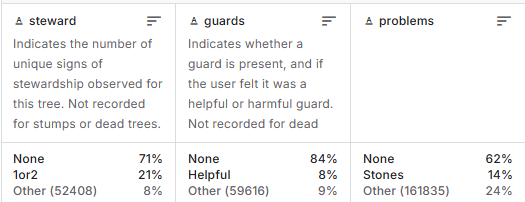

Проверяем число пропусков после предобработки:

In [13]:
data.dropna(subset = 'health').isnull().sum(axis = 0)

tree_id                0
block_id               0
created_at             0
tree_dbh               0
stump_diam             0
curb_loc               0
status                 0
health                 0
spc_latin              5
spc_common             5
steward                0
guards                 0
sidewalk               1
user_type              0
problems               0
root_stone             0
root_grate             0
root_other             0
trunk_wire             0
trnk_light             0
trnk_other             0
brch_light             0
brch_shoe              0
brch_other             0
address                0
postcode               0
zip_city               0
community board        0
borocode               0
borough                0
cncldist               0
st_assem               0
st_senate              0
nta                    0
nta_name               0
boro_ct                0
state                  0
latitude               0
longitude              0
x_sp                   0


Однако после удаления пропусков из целевой переменной удалось убрать не все пустые значения:
- Для полей spc_latin, spc_common, sidewalk осталось мизерное число пустых значений, поэтому для них их также можно удалить без сильной потери информации;
- Для полей council district и census tract, а также bin и bbl осталось достаточно много пустых значений, что требует дополнительного анализа причин;

In [14]:
data.drop(columns = ['stump_diam'], inplace = True)

## **Балансировка классов**

Поскольку целевая переменная представлена в виде несбалансированной категориальной переменной с тремя основными значениями - "Good, Fair, Poor" - то для последующего использования набора данных в алгоритмах ML/AI потребуется балансировка классов. Балансировка классов нужна по следующим причинам:
- Модель лучше обучается прогнозировать мажоритарный класс, нежели все остальные классы, которые в меньшинстве;
- Потеря важной информации у миноритарных классах;
- "Проблема нуля" - модель может иметь неплохую точность, если просто соотносит все образцы к мажоритарному классу. например, если мажоритарный класс составляет 80% от всей совокупности, то можно иметь 80% точность просто соотнося образцы к мажоритарному классу. Точность по остальным классам тогда будет равно нулю.

Обычно для решения проблемы несбалансированных классов используют следующие виды методов:
- Простой отбор образцов таким образом, чтобы все классы были представлены примерно в одинаковом количестве. Обычно либо берут миноритарный класс и к нему случайно отбираются образцы других классов в том же количестве (*undersampling*), либо к мажоритарному классу отбираются образцы из миноритарных классов, причем образцы берутся с повторами (*oversampling*);
- Генерировать для миноритарных классов синтетические образцы, схожие по характеристикам (*SMOTE*);
- Использовать алгоритмы, которые способны учитывать несбалансированные классы (*BalancedBaggingClassifier*-метод библиотеки imlearn).

Для табличных данных такого объема подойдут техники undersampling/oversampling, поскольку объем данных только миноритарного класса составляет около 26 тысяч. Однако у данных методов есть свои плюсы и минусы.
Достоинства и недостатки метода *oversampling*:
- Не теряет информации, поскольку все данные включены в выборку;
- Требует больше вычислительных ресурсов, поскольку данных становится больше. В данном случае мажоритарный класс включает в себя 528850 образцов. При такой техники данных станет больше 1.5 млн.

Достоинства и недостатки метода *undersampling*:
- Теряет часть информации мажоритарных классов, поскольку не вся информация может быть включена;
- Улучшает быстродействие, что особенно полезно при большом объеме данных. В данном случае миноритарный класс включает в себя 26818 образцов. При такой техники данных станет около 80 тысяч.

Помимо вышеперечисленного оба метода позволяют лучше сравнивать классы между собой, включая влияние потенциальных предикторов на целевую переменную. Но относительный недостаток балансировки классов в том, что она подходит не для всех задач. Если стоит задача выявления. визуализации и отслеживания показателей в динамике все совокупности, тогда балансировка классов не нужна. Так как задача требует построение модели ML/AI для определения класса того или иного дерева, то балансировка необходима. Также EDA требуется проводить на сбалансированном наборе данных для того, чтобы лучше понять структуру данных, влияние на целевую переменную и поиска возможных инсайтов вданных, которые бы помогли лучше прогнозировать классы.

Для данной задачи я выбираю технику *undersampling* по следующим причинам:
- Улучшит быстродействие при обучении моделей ML/AI, а также скорость проведения EDA;
- Не теряет и сохраняет структуру миноритарного класса, что лучше для данной задачи. Миноритарный класс олицетворяет собой плохое качество дерева, когда как большинство деревьев хорошего или среднего/посредственного качества. Поэтому важно правильно классифицировать именно данный класс, чтобы можно было оперативно решить проблему с плохими деревьями.

In [15]:
data_unbalanced = data.copy()

In [16]:
class_3,class_2,class_1 = data.health.value_counts()
c3 = data[data['health'] == 'Good']
c2 = data[data['health'] == 'Fair']
c1 = data[data['health'] == 'Poor']
df_3 = c3.sample(class_1)
df_2 = c2.sample(class_1)

data = pd.concat([df_3,df_2,c1],axis=0)
data.dropna(subset = 'health', inplace = True)
data['health'].value_counts()

health
Good    26818
Fair    26818
Poor    26818
Name: count, dtype: int64

Сбалансированая выборка будет храниться в отдельном файле, который всегда можно использовать для получения аналогичных результатов:

In [17]:
# data.to_csv(("C:\\Users\\skako\\Тестовое задание Максибитсолюшен\\data\\data_balanced_for_EDA.csv"), index = False)

In [18]:
data = pd.read_csv("C:\\Users\\skako\\Тестовое задание Максибитсолюшен\\data\\data_balanced_for_EDA.csv")
data.head()

,tree_id,block_id,created_at,tree_dbh,curb_loc,status,health,spc_latin,spc_common,steward,...,boro_ct,state,latitude,longitude,x_sp,y_sp,council district,census tract,bin,bbl
0,245928,336583,2015-09-22T00:00:00.000,9,OnCurb,Alive,Good,Gleditsia triacanthos var. inermis,honeylocust,NaN,...,4155102,New York,40.751551,-73.718996,1062106.552,213211.7245,23.0,155102.0,4456402.0,4.084420e+09
1,59343,111443,2015-07-10T00:00:00.000,3,OffsetFromCurb,Alive,Good,Quercus rubra,northern red oak,NaN,...,1029100,New York,40.865244,-73.924959,1005005.846,254518.3755,10.0,291.0,1064803.0,1.022240e+09
2,608413,308860,2016-06-29T00:00:00.000,14,OnCurb,Alive,Good,Fraxinus americana,white ash,NaN,...,4001000,New York,40.690229,-73.859899,1023103.019,190776.6064,32.0,10.0,4183508.0,4.089160e+09
3,627247,347724,2016-07-14T00:00:00.000,3,OnCurb,Alive,Good,Koelreuteria paniculata,golden raintree,1or2,...,4065703,New York,40.713978,-73.878028,1018063.476,199421.6081,30.0,65703.0,4071583.0,4.030600e+09
4,99202,203080,2015-07-28T00:00:00.000,5,OnCurb,Alive,Good,Zelkova serrata,Japanese zelkova,1or2,...,3111600,New York,40.665985,-73.873364,1019381.754,181938.0341,42.0,1116.0,3390990.0,3.044800e+09


Для несбалансированного набора также есть проблема с пропусками:

In [19]:
data.fillna({'steward':'None', 'guards':'None', 'problems':'None'}, inplace=True)
data.isnull().sum()

tree_id                0
block_id               0
created_at             0
tree_dbh               0
curb_loc               0
status                 0
health                 0
spc_latin              1
spc_common             1
steward                0
guards                 0
sidewalk               0
user_type              0
problems               0
root_stone             0
root_grate             0
root_other             0
trunk_wire             0
trnk_light             0
trnk_other             0
brch_light             0
brch_shoe              0
brch_other             0
address                0
postcode               0
zip_city               0
community board        0
borocode               0
borough                0
cncldist               0
st_assem               0
st_senate              0
nta                    0
nta_name               0
boro_ct                0
state                  0
latitude               0
longitude              0
x_sp                   0
y_sp                   0


In [20]:
data.dropna(subset = ['spc_common'], inplace = True)

## **Основные выводы**

Основные выводы данной главы:
- Задача машинного обучения - "Многоклассовая классификация";
- Большинство пропусков в данных можно удалить, однако потребуется дополнительно оценить причину пропусков для 4 полей;
- Есть перечень потенциальных взаимоисключающих полей, для которых требуется дополнительная проверка;
- Есть перечень полей, которые можно отбросить как нерелевантные для данной задачи.

# **Exploratory Data Analysis**

Exploratory Data Analysis (Разведочный/Исследовательский Анализ Данных) - процесс анализа основных свойств, зависимостей, закономерностей, которые есть в данных. Его основная цель дать понимание того, с чем мы имеем дело. Данное понятие было введено Джоном Тьюки в 1977 году. Его общие цели включают в себя:
- изучение закономерностей в данных;
- выявление структуры данных;
- выявить важные переменные для данной задачи;
- выявить аномальные/экстремальные значения;
- проверить основные гипотезы, которые были выдвинуты до или во время анализа данных;
- определение baseline'а и построение базовой модели без тонкой настройки.

Поскольку уже есть базовое представлени о данных, то для данной главы можно сформулировать более конкретные действия:
- Постоить графики распределений и проверить основные положения, сделанные в предыдущей главе;
- Попытаться выявить причину пропусков для 4 полей;
- Найти оптимальную предобработку для полей, особенно для категориальных и тектовых;
- Оценить степень взаимосвязи полей с целевой переменной и между собой;
- На графиках распределения выявить наличие/отсутствие аномальных значений;
- При появлении дополнительных гипотез сделать соответствующую проверку;
- Сформировать выборку для последующих этапов Feature Selection и ML/AI-моделирования;
- Определить базовую точность, которую можно получить без использования продвинутых методов ML/AI, а также построить базовую модель.

## **Определение основных функций**

В данном разделе я определил функции, которые используются множество раз в данном разделе. У каждой функции есть описание того, что она делает, что подается на вход и возвращается.

In [21]:
def hist_and_boxplot(data, name, xlabel, ylabel, title):
    """
        This function makes a plot with histogram and boxplot of a column

            Parameters:
                data(pd.DataFrame): dataframe with data
                name(str): name of a column to build a plot from
                xlabel(str): name of xlabel
                ylabel(str): name of ylabel
                title(str): title of a plot 

            Returns:
                Makes a chart that consists of histogram and boxplot with mode, median and mean values

    """
    column = data[name]

    fig, (ax_box, ax_hist) = plt.subplots(2, sharex=True, gridspec_kw= {"height_ratios": (0.2, 1)})
    fig.set_figheight(6)
    fig.set_figwidth(18)
    
    try:    
        mean=column.mean()
        median=column.median()
        mode=column.mode().values[0]
    except TypeError:
        pass

    sns.boxplot(data = data, x = name, ax = ax_box)
    ax_box.axvline(mean, color = 'r', linestyle = '--')
    ax_box.axvline(median, color = 'g', linestyle = '-')
    ax_box.axvline(mode, color = 'b', linestyle = '-')

    sns.histplot(data = data, x = name, ax = ax_hist, kde = True)
    ax_hist.axvline(mean, color = 'r', linestyle = '--', label = 'Mean')
    ax_hist.axvline(median, color = 'g', linestyle = '-', label = 'Median')
    ax_hist.axvline(mode, color = 'b', linestyle = '-', label = 'Mode')

    ax_hist.legend()
    plt.title(title)
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    
    plt.xticks(rotation = 90)

    ax_box.set(xlabel='')
    
    plt.show()
    plt.close()

In [22]:
def hist(data, name, xlabel, ylabel, title, figsize = (16, 6)):
    """
        This function makes an ordinary histogram

            Parameters:
                data(pd.DataFrame): dataframe with data
                name(str): name of a column to build a plot from
                xlabel(str): name of xlabel
                ylabel(str): name of ylabel
                title(str): title of a plot 
                figsize(tuple): size of a plot, default = (16, 8)

            Returns:
                Makes a chart, which includes one histogram
    """
    plt.figure(figsize = figsize)
    ax = sns.countplot(x = name, data = data)
    plt.title(title)
    plt.xticks(rotation = 90)
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    
    plt.show()
    plt.close()

In [23]:
def hist_of_target(data, hue, xlabel, ylabel, title, figsize = (16, 6)):
    """
        This function makes a stratified histogram with target variable

            Parameters:
                data(pd.DataFrame): dataframe with data
                hue(str): name of a column as a hue parameter for sns.histplot-function
                xlabel(str): name of xlabel
                ylabel(str): name of ylabel
                title(str): title of a plot 
                figsize(tuple): size of a plot, default = (16, 8)

            Returns:
                Makes a chart, which includes one histogram
    """
    plt.figure(figsize = figsize)
    sns.histplot(data = data, x = xlabel, hue = hue)
    plt.title(title)
    plt.xticks(rotation = 90)
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    
    plt.show()
    plt.close()

In [24]:
def plot_two_variables(data, xlabel, ylabel, title, figsize = (16, 8)):
    """
        This function makes a boxplot and a scatterplot of two variables

            Parameters:
                data(pd.DataFrame): dataframe with data
                xlabel(str): name of xlabel
                ylabel(str): name of ylabel
                title(str): title of a plot
                figsize(tuple): size of a plot, default=(12,6)

    """
    fig = plt.figure(figsize = figsize)
    ax = sns.boxplot(data = data, x = xlabel, y = ylabel, order = ['Good', 'Fair', 'Poor'])
    # ax.set_xticklabels(ax.get_xticklabels(), rotation=30)
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.title(title)
    plt.show()
    plt.close()

In [25]:
def groupby_spec(data, func_name, list_of_variables, target, list_to_sort, asc):
    """
        This function makes operation "Group By" on given dataset

            Parameters:
                data(pd.DataFrame): dataframe with data
                func_name(str): name of aggegate function to use on the given data(must be pandas Dataframe function)
                list_of_variables(list): list of variables from data to group by on 
                target(str): variable of interest
                list_to_sort(list): list of variables to sort by
                asc(bool): ascending=parameter of sort_values method (only True/False)
                
    """
    to_group = list_of_variables.copy()
    to_group.append(target)
    grouped = getattr(data[to_group].groupby(list_of_variables), func_name)().sort_values(list_to_sort, ascending = asc)
    return grouped

In [26]:
def groupby_two_variables(data, variable, target):
    """
        This function modifies groupby_spec-functin and returns unstacked data of two variables

        Parameters:
            data(pd.DataFrame): dataframe with data
            variable(list): list of variables from data to group by on 
            target(str): variable of interest
                
    """
    print('Средние значения поля "{}", агрегированные по полю "{}": '.format(variable, target))
    grouped = groupby_spec(data, 'count', [variable, target], 'tree_id', [variable, target], True).unstack().fillna(0)
    grouped.columns = grouped.columns.droplevel()
    
    grouped['Total'] = grouped['Fair'] + grouped['Good'] + grouped['Poor']
    grouped['Fair_share'] = grouped['Fair'] / grouped['Total'] * 100
    grouped['Good_share'] = grouped['Good'] / grouped['Total'] * 100
    grouped['Poor_share'] = grouped['Poor'] / grouped['Total'] * 100

    return grouped

In [27]:
def vectorize_and_pca(data, variable, ngram_range, token_pattern, n_components):
    """
        This function gets a categorial/text variable, vectorizes it, then performce PCA dimencial reduction.

        Parameters:
                data(pd.DataFrame): dataframe with data
                variable(str): name of a column to vectorize from
                ngram_range(tuple): tuple of values to make n_grams from. Examples: (1, 1), (2, 2), (3, 3)
                token_pattern(str): token pattern for CountVectorizer, used where specific splitter needed
                n_components(int): number of PCA-components

            Returns:
                Returns fitted pca-algorithm, table of explaned variance, transformed data, Bag of Words vector and fitetd Bag of Words vector
        
    """

    vec = CountVectorizer(ngram_range = ngram_range, token_pattern = token_pattern) # строим BoW для слов
    bow = vec.fit_transform(data[variable])
    
    pca = PCA(n_components = n_components)
    pca.fit(bow)
    variance = pd.DataFrame({'component': range(1, len(pca.explained_variance_ratio_)+1), 'variance': pca.explained_variance_ratio_})

    col_names = [variable + '_pca_component_' + str(i) for i in range(1, n_components + 1)]
    data_transformed = pca.fit_transform(bow)
    data_transformed = pd.DataFrame(data_transformed, columns = col_names)

    return pca, variance, data_transformed, vec, bow

In [28]:
def show_nulls_on_map(start_location, zoom_start, data, variable, original_column):
    """
        This function plots nulls on a real world map. 

            Parameters:
                start_location(list): list of latitude and longitude to show map around. Example: [40.777682, -73.750707]
                zoom_start(int): start zoom position
                data(pd.DataFrame): dataframe with data. Must include columns "latitude" and "longitude"
                variable(str): name of a column, that represents nulls (has only 0/1, where 1 means null and 0 - not null)
                original_column(str): name of a column where null where being searched

            Returns:
                Map with mapped empty values in red, not nulls in green.

    """
    
    blank_map = folium.Map(location = start_location, zoom_start = zoom_start)

    for i in range(len(data)):
        if data.iloc[i][variable] == 1:
            folium.Circle(location=[data.iloc[i]['latitude'], data.iloc[i]['longitude']], radius=1, color = 'red').add_to(blank_map)
            folium.map.Marker([data.iloc[i]['latitude'], data.iloc[i]['longitude']],
                              icon=DivIcon(
                              icon_size=(30,30),
                              icon_anchor=(5,14),
                              html=f'<div style="font-size: 6pt">%s</div>' % str(data.iloc[i][original_column]),
                          )
                         ).add_to(blank_map)
        else:
            folium.Circle(location=[data.iloc[i]['latitude'], data.iloc[i]['longitude']], radius=1, color = 'green').add_to(blank_map)
            folium.map.Marker([data.iloc[i]['latitude'], data.iloc[i]['longitude']],
                              icon=DivIcon(
                              icon_size=(30,30),
                              icon_anchor=(5,14),
                              html=f'<div style="font-size: 6pt">%s</div>' % str(data.iloc[i][original_column]),
                          )
                         ).add_to(blank_map)
            
    # blank_zip_cities_map.save('C:\\Users\\skako\\Тестовое задание Максибитсолюшен\\data\\maps\\blank_zip_cities_map.html')
    return blank_map 

In [29]:
def null_imput(data, X, y):
    """
        This function imputs nulls by using k-nearest neighbors

            Parameters:
                data(pd.DataFrame): dataframe with data
                X(list): list of names of variables to use as predictors
                y(str): name target variable to imput

            Returns:
                Prints MAE and MAPE of current imputation

    """
    list_of_columns = X.copy()
    list_of_columns.append(y)
    
    data_slice = data[list_of_columns].dropna(subset = [y])
    X = data_slice[X]
    y = data_slice[y]
    
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.20, random_state = 42)
    
    neigh = KNeighborsRegressor(n_neighbors = 1)
    neigh.fit(X_train, y_train)
    
    y_pred = neigh.predict(X_test)
    print('Показатель mae: {}'.format(mean_absolute_error(y_test, y_pred)))
    print('Показатель mape(в %): {}'.format(mean_absolute_percentage_error(y_test, y_pred) * 100))

In [30]:
def haversine_euclidian(lat1, lon1, lat2, lon2):
    
    delta_lat = np.abs(np.radians(lat1) - np.radians(lat2))
    delta_lon = np.abs(np.radians(lon1) - np.radians(lon2))
    R = 6731 # Earth radius, in km

    a = np.sin(delta_lat / 2) ** 2 + np.cos(np.radians(lat1)) * np.cos(np.radians(lat2)) * np.sin(delta_lon / 2) ** 2
    c = 2 * np.arctan2(np.sqrt(a), np.sqrt(1 - a))
    d = R * c

    return d # in km

In [31]:
def haversine_manhattan(lat1, lon1, lat2, lon2):
    
    delta_lat = np.abs(np.radians(lat1) - np.radians(lat2))
    delta_lon = np.abs(np.radians(lon1) - np.radians(lon2))
    R = 6731 # Earth radius, in km

    a = np.sin(delta_lat / 2) ** 2
    b = 2 * np.arctan2(np.sqrt(a), np.sqrt(1 - a))
    latitude_distance = R * b

    c = np.sin(delta_lon / 2) ** 2
    d = 2 * np.arctan2(np.sqrt(c), np.sqrt(1 - c))
    longitude_distance = R * d

    d = np.abs(latitude_distance) + np.abs(longitude_distance) # in km

    return d # in km

## **Анализ числовых полей**

Всего 17 полей с числовым типом данных. Отдельный перечень приведен ниже:

In [32]:
print('Поля с типом int64: {}'.format(data.select_dtypes(int).columns))
print('Поля с типом float64: {}'.format(data.select_dtypes(float).columns))

Поля с типом int64: Index(['tree_id', 'block_id', 'tree_dbh', 'postcode', 'community board',
       'borocode', 'cncldist', 'st_assem', 'st_senate', 'boro_ct'],
      dtype='object')
Поля с типом float64: Index(['latitude', 'longitude', 'x_sp', 'y_sp', 'council district',
       'census tract', 'bin', 'bbl'],
      dtype='object')


### **Поле tree_id**

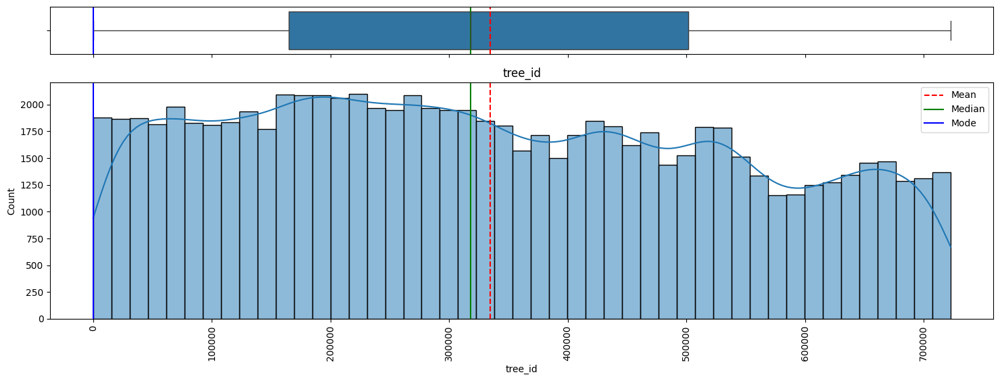

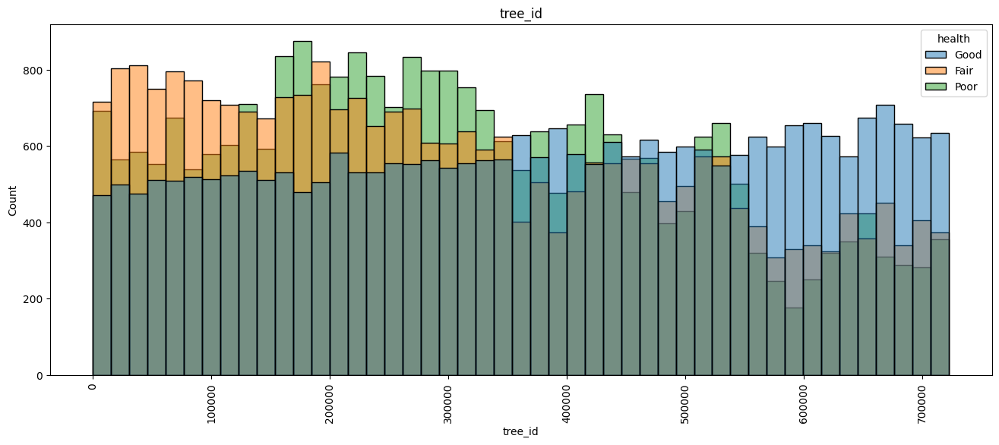

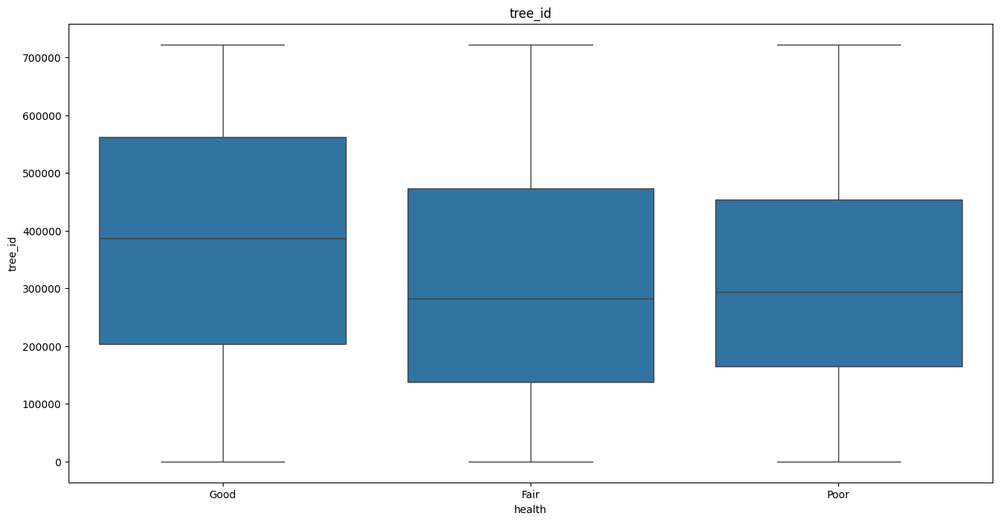

In [33]:
target = 'health'
variable = 'tree_id'

hist_and_boxplot(data, variable, variable, 'Count', variable)
hist_of_target(data, target, variable, 'Count', variable)
plot_two_variables(data, target, variable, variable)

In [34]:
print('Средние значения поля "{}", агрегированные по полю "{}": '.format(variable, target))
groupby_spec(data, 'mean', [target], variable, [target], True)

Средние значения поля "tree_id", агрегированные по полю "health": 


,tree_id
health,
Fair,310299.040197
Good,378937.382020
Poor,314546.218071


По распределению видно, что нет сильной зависимости между полем "tree_id" и "health". Есть некая закономерность, когда при увеличении значения поля растет доля класса "Good". В целом, данное поле олицетворяет уникальный идентификатор и любые закономерности с целевой переменной скорее связаны с систематической ошибкой, поэтому данное поле следует отбросить.

### **Поле block_id**

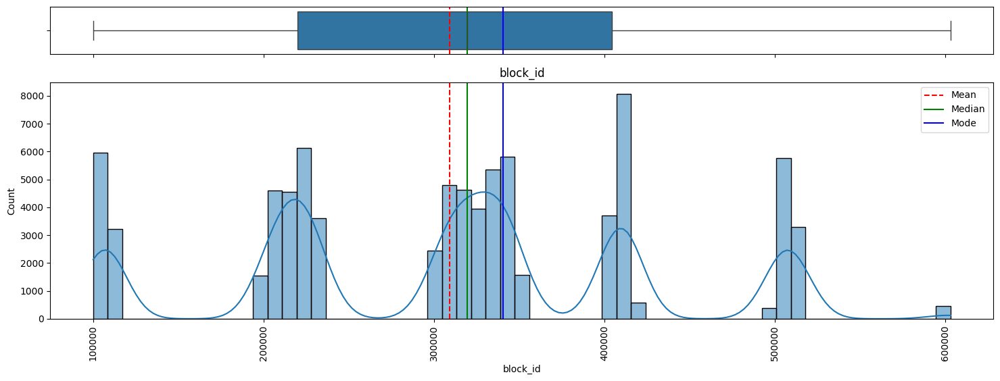

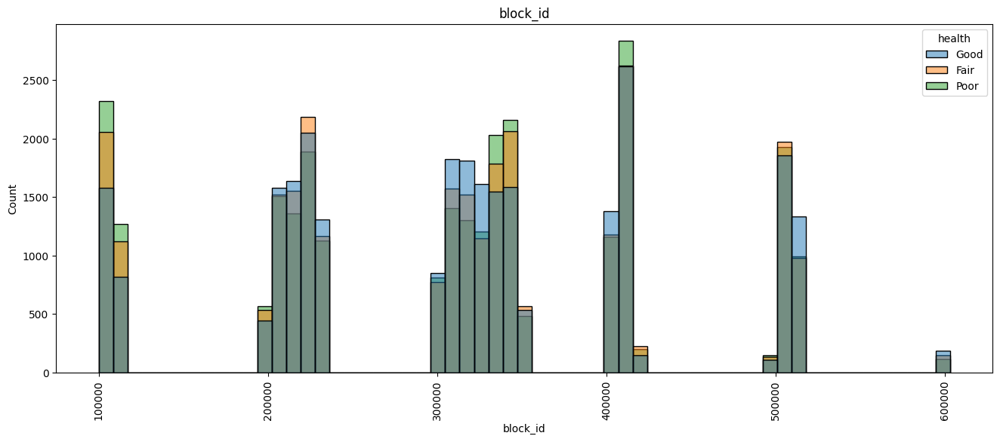

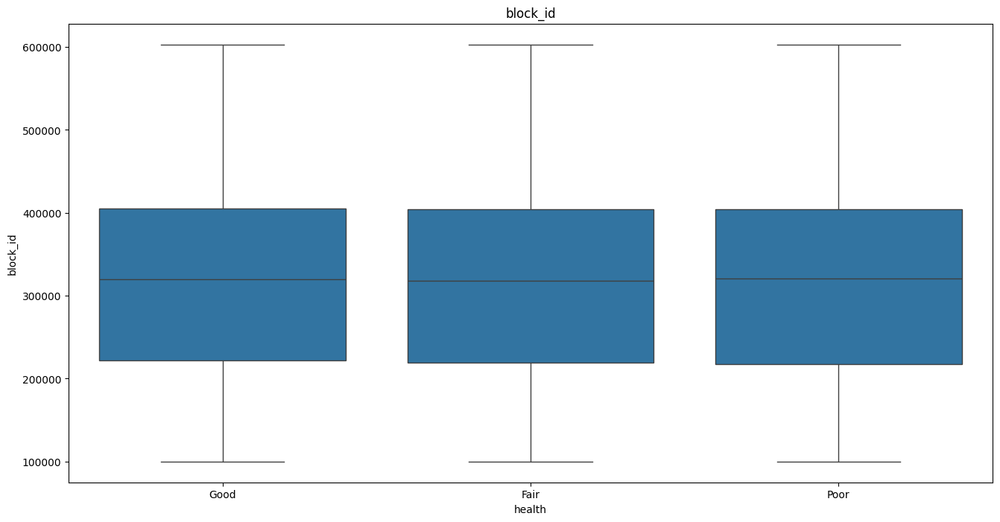

In [35]:
target = 'health'
variable = 'block_id'

hist_and_boxplot(data, variable, variable, 'Count', variable)
hist_of_target(data, target, variable, 'Count', variable)
plot_two_variables(data, target, variable, variable)

In [36]:
print('Средние значения поля "{}", агрегированные по полю "{}": '.format(variable, target))
groupby_spec(data, 'mean', [target], variable, [target], True)

Средние значения поля "block_id", агрегированные по полю "health": 


,block_id
health,
Fair,307074.747036
Good,314597.434894
Poor,305904.904613


Само по себе поле также является идентификатором, что делает его использовани некорректным. Дополнительно ко всему нет прямой/обратной зависимости между значениями поля с целевой переменной.

По графику видно, что значения можно сгруппировать по +- 5 основным бинам.

In [37]:
def conditions(data):    
    if (data['block_id'] <= 150000):
        return '1'
    elif (data['block_id'] > 150000) & (data['block_id'] <= 250000):
        return '2'
    elif (data['block_id'] > 250000) & (data['block_id'] <= 350000):
        return '3'
    elif (data['block_id'] > 350000) & (data['block_id'] <= 450000):
        return '4'
    else:
        return '5'

data['block_id_binned'] = data.apply(conditions, axis = 1)

По таблице ниже видно, что есть некоторая зависимость между бинами поля "block_id" и  целевой пременной "health". Для бина "1" есть некотрое изменение в доли класса "Good" (26.1% против 33-35 % в других классах):

In [38]:
groupby_two_variables(data, 'block_id_binned', target)

Средние значения поля "block_id_binned", агрегированные по полю "health": 


health,Fair,Good,Poor,Total,Fair_share,Good_share,Poor_share
block_id_binned,,,,,,,
1,3174,2398,3594,9166,34.627973,26.161903,39.210124
2,6954,7022,6451,20427,34.043178,34.376071,31.580751
3,9415,9758,9376,28549,32.978388,34.179831,32.841781
4,4041,4153,4212,12406,32.572949,33.475738,33.951314
5,3234,3487,3184,9905,32.650177,35.204442,32.145381


Однако такие отличия могли быть вызваны случайными причинами, связанные с тем, как и кем собиралась информация и не должна в долгосрочной перспективе влиять на целевую переменную. Поэтому данное поле все же стоит опустить.

### **Поле tree_dbh**

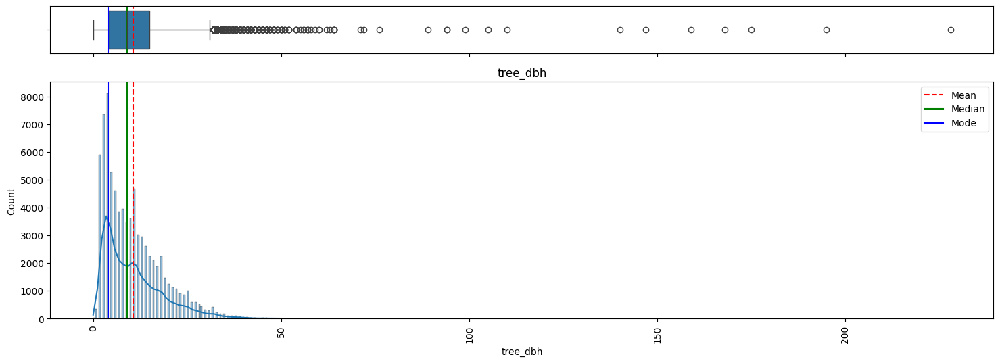

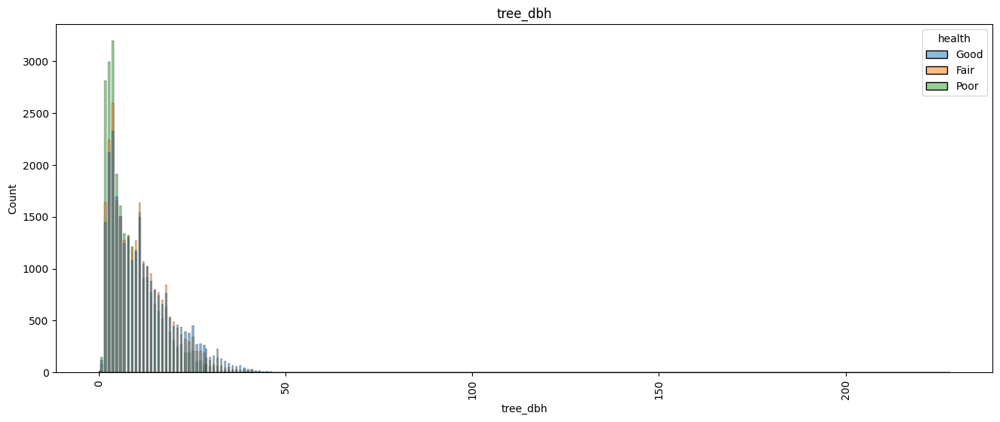

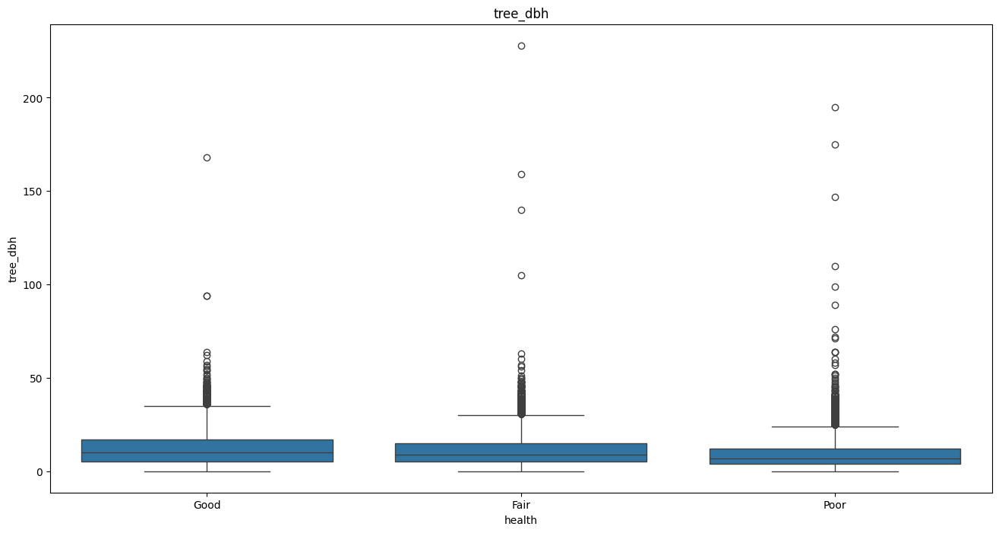

In [39]:
target = 'health'
variable = 'tree_dbh'

hist_and_boxplot(data, variable, variable, 'Count', variable)
hist_of_target(data, target, variable, 'Count', variable)
plot_two_variables(data, target, variable, variable)

In [40]:
print('Средние значения поля "{}", агрегированные по полю "{}": '.format(variable, target))
groupby_spec(data, 'mean', [target], variable, [target], True)

Средние значения поля "tree_dbh", агрегированные по полю "health": 


,tree_dbh
health,
Fair,10.985532
Good,11.918413
Poor,9.033039


Для данной переменной характерно наличие большого числа экстремальных значений, которые в разы больше средних по классам. Срдение значения по классам не слишком отличаются, но немного удивительно, что зависимость обратная (чем больше диаметр дерева, тем хуже качество дерева).

Среднее значение + 3 среднеквадратичных отклонений дают значение примерно 34.65. Его можно попробовать использовать как порог, после которого все остальные значения считать выбросами. Размах значений от 0 по 228, что довольно много относительно среднего:

In [41]:
print('Среднее значение: {}'.format(data['tree_dbh'].mean()))
print('Среднеквадратичное отклонение: {}'.format(data['tree_dbh'].std()))
print('Mean + 2 std: {}'.format(data['tree_dbh'].mean() + 2 * data['tree_dbh'].std()))
print('Mean + 3 std: {}'.format(data['tree_dbh'].mean() + 3 * data['tree_dbh'].std()))
print('Максимальное значение: {}'.format(data['tree_dbh'].max()))
print('Минимальное значение: {}'.format(data.dropna()['tree_dbh'].min()))

Среднее значение: 10.645681329471866
Среднеквадратичное отклонение: 8.002761878427732
Mean + 2 std: 26.65120508632733
Mean + 3 std: 34.65396696475506
Максимальное значение: 228
Минимальное значение: 0


При том, что доля экстремальновысоких значений довольно мала. Из примерно 80 тысяч живых деревьев лишь у 1996 диаметр больше 30 дюймов:

In [42]:
print('Количество деревьев с диаметром больше 30 дюймов (76.2см): {}'.format(np.where(data['tree_dbh'] > 30, 1, 0).sum()))
print('Количество деревьев с диаметром больше 35 дюймов (88.9см): {}'.format(np.where(data['tree_dbh'] > 35, 1, 0).sum()))
print('Количество деревьев с диаметром больше 40 дюймов (101.6см): {}'.format(np.where(data['tree_dbh'] > 40, 1, 0).sum()))
print('Количество деревьев с диаметром больше 50 дюймов (127см): {}'.format(np.where(data['tree_dbh'] > 50, 1, 0).sum()))

Количество деревьев с диаметром больше 30 дюймов (76.2см): 1996
Количество деревьев с диаметром больше 35 дюймов (88.9см): 692
Количество деревьев с диаметром больше 40 дюймов (101.6см): 228
Количество деревьев с диаметром больше 50 дюймов (127см): 42


Поэтому для борьбы с выбросами для данного поля я бы расчитывал среднее + 3 среднеквадратичных отклонений для выявления порога, после которого все выбросы просто заменить на пороговое. Для данной совокупности порог можно взять 35.

Среднее значение: 10.585236100580463
Среднеквадратичное отклонение: 7.655936830951005
Mean + 2 std: 25.897109762482472
Mean + 3 std: 33.55304659343348
Максимальное значение: 35
Минимальное значение: 0


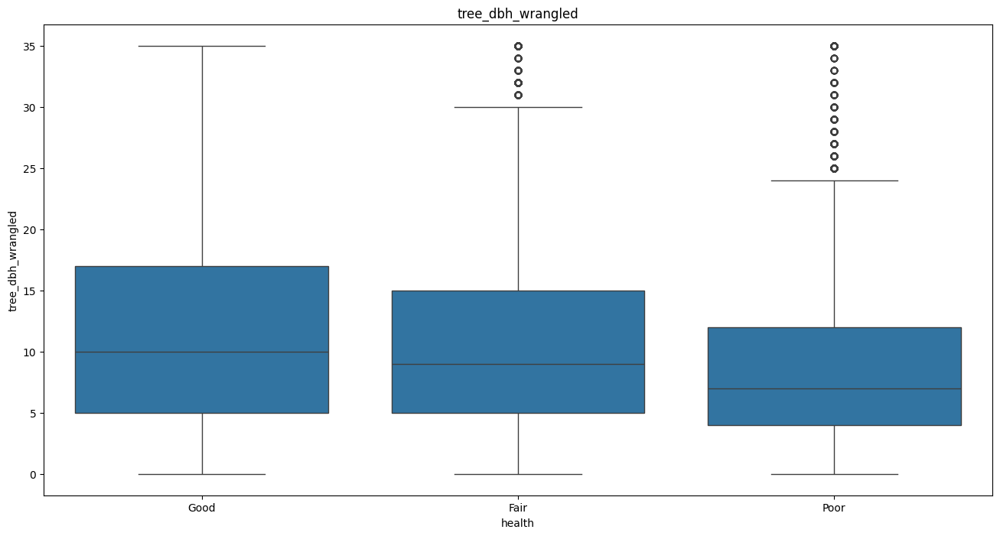

In [43]:
data['tree_dbh_wrangled'] = np.where(data['tree_dbh'] > 35, 35, data['tree_dbh'])

print('Среднее значение: {}'.format(data['tree_dbh_wrangled'].mean()))
print('Среднеквадратичное отклонение: {}'.format(data['tree_dbh_wrangled'].std()))
print('Mean + 2 std: {}'.format(data['tree_dbh_wrangled'].mean() + 2 * data['tree_dbh_wrangled'].std()))
print('Mean + 3 std: {}'.format(data['tree_dbh_wrangled'].mean() + 3 * data['tree_dbh_wrangled'].std()))
print('Максимальное значение: {}'.format(data['tree_dbh_wrangled'].max()))
print('Минимальное значение: {}'.format(data.dropna()['tree_dbh_wrangled'].min()))

plot_two_variables(data, target, 'tree_dbh_wrangled', 'tree_dbh_wrangled')

Также данные выбросы можно использовать в качестве разбиения. Например, можно построить бинарную переменную, которая примет значение "1", если поле "tree_dbh" примет значение выше порога, и "0", если значение будет меньше порога.

In [44]:
print('Разбиение по бинам tree_dbh_big, где 1 - если значение диаметра дерева было выше 50 дюймов, а 0 - если нет: ')
data['tree_dbh_big'] = np.where(data['tree_dbh'] > 50, 1, 0)
data.groupby(['tree_dbh_big']).health.value_counts(normalize=True).unstack().sort_values('tree_dbh_big', ascending = True)

Разбиение по бинам tree_dbh_big, где 1 - если значение диаметра дерева было выше 50 дюймов, а 0 - если нет: 


health,Fair,Good,Poor
tree_dbh_big,,,
0,0.333387,0.333350,0.333263
1,0.238095,0.309524,0.452381


In [45]:
print('Разбиение по бинам tree_dbh_big, где 1 - если значение диаметра дерева было выше 40 дюймов, а 0 - если нет: ')
data['tree_dbh_big'] = np.where(data['tree_dbh'] > 40, 1, 0)
data.groupby(['tree_dbh_big']).health.value_counts(normalize=True).unstack().sort_values('tree_dbh_big', ascending = True)

Разбиение по бинам tree_dbh_big, где 1 - если значение диаметра дерева было выше 40 дюймов, а 0 - если нет: 


health,Fair,Good,Poor
tree_dbh_big,,,
0,0.333425,0.332826,0.333749
1,0.302632,0.513158,0.184211


In [46]:
print('Разбиение по бинам tree_dbh_big, где 1 - если значение диаметра дерева было выше 30 дюймов, а 0 - если нет: ')
data['tree_dbh_big'] = np.where(data['tree_dbh'] > 30, 1, 0)
data.groupby(['tree_dbh_big']).health.value_counts(normalize=True).unstack().sort_values('tree_dbh_big', ascending = True)

Разбиение по бинам tree_dbh_big, где 1 - если значение диаметра дерева было выше 30 дюймов, а 0 - если нет: 


health,Fair,Good,Poor
tree_dbh_big,,,
0,0.334425,0.327823,0.337752
1,0.290581,0.550100,0.159319


Если смотреть по долям, то использование в качестве порога значение "30" лучше делит совокупность по качеству дерева. Также данный порог разделяет больше деревьев, нежели более выскоие пороги.

Для тестирования в моделях ML/AI можно взять три поля:
- 'tree_dbh' без предобработки;
- 'tree_dbh_wrangled' с предобработкой пропусков по порогу 35;
- 'tree_dbh_big' с формированием поля по принципу "где 1 - если значение диаметра дерева было выше 30 дюймов, а 0 - если нет".

### **Поле postcode**

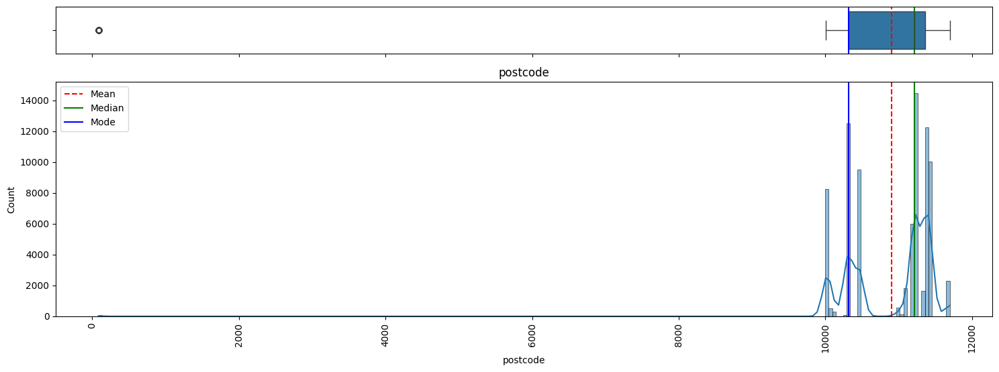

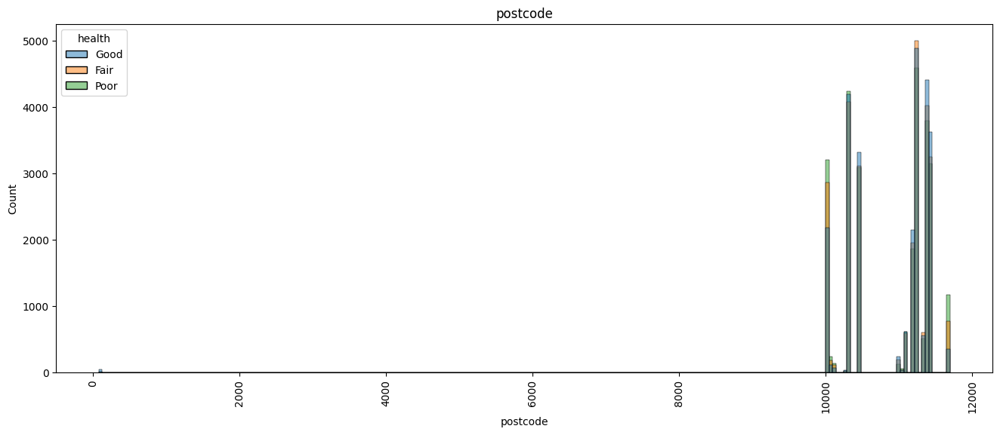

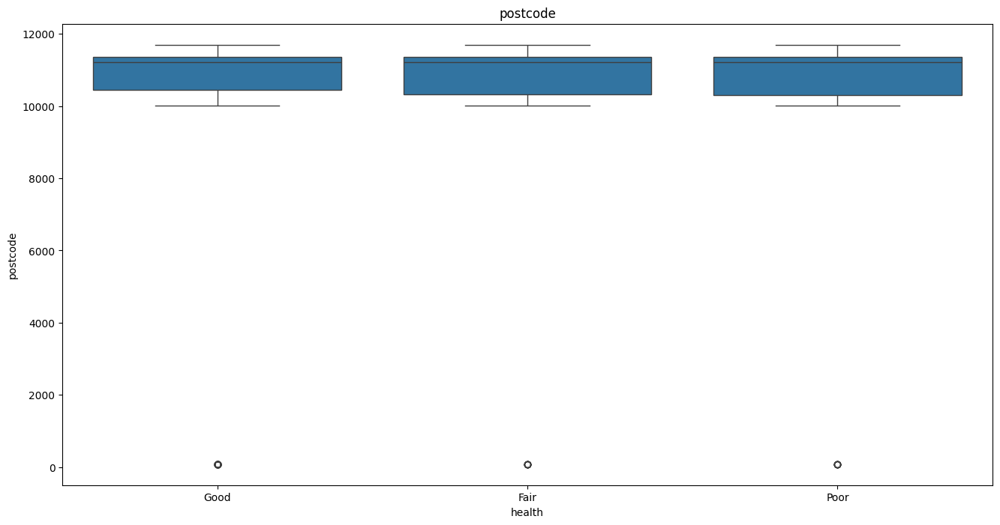

In [47]:
target = 'health'
variable = 'postcode'

hist_and_boxplot(data, variable, variable, 'Count', variable)
hist_of_target(data, target, variable, 'Count', variable)
plot_two_variables(data, target, variable, variable)

In [48]:
print('Средние значения поля "{}", агрегированные по полю "{}": '.format(variable, target))
groupby_spec(data, 'mean', [target], variable, [target], True)

Средние значения поля "postcode", агрегированные по полю "health": 


,postcode
health,
Fair,10908.080506
Good,10915.349802
Poor,10890.225790


Использование почтового индекса как числовую переменную - некорректно. Данное поле можно отбросить.

### **Поле community board**

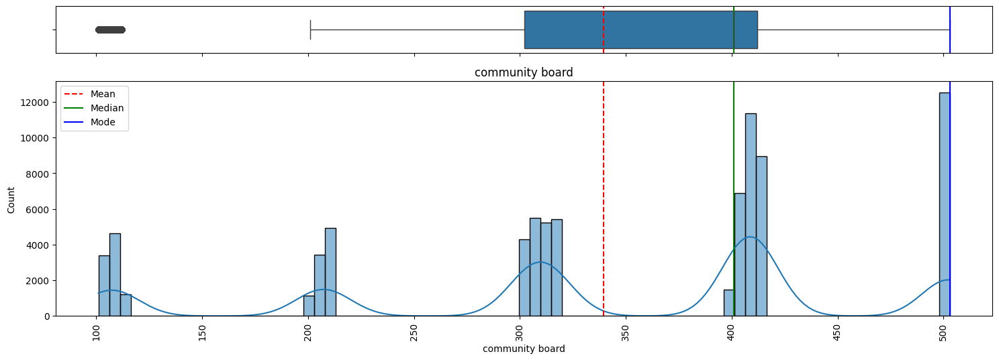

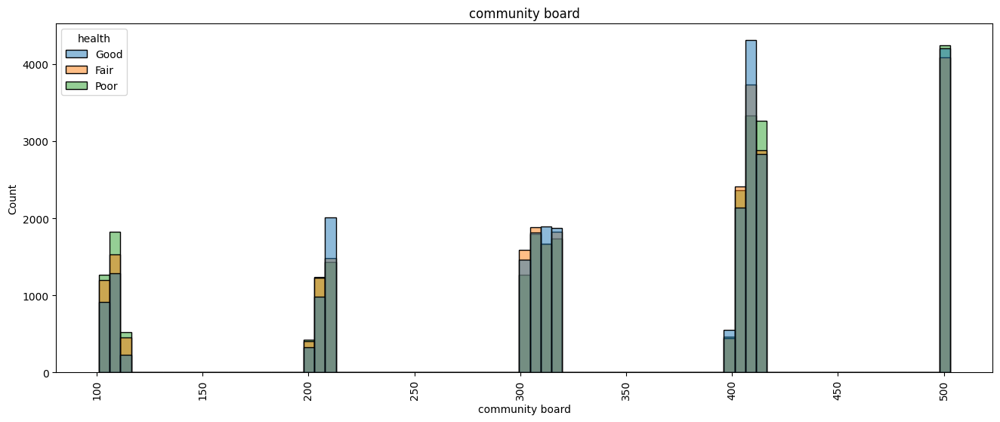

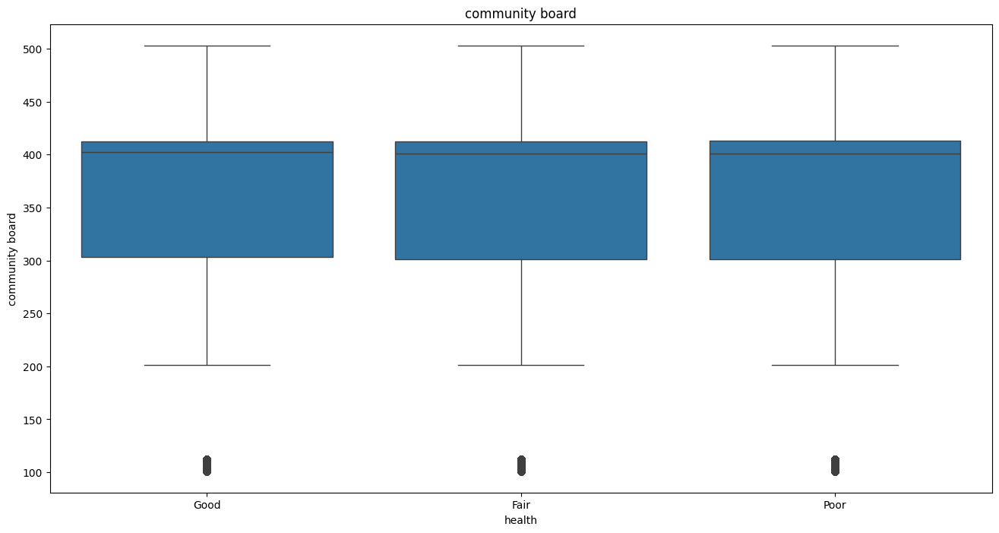

In [49]:
target = 'health'
variable = 'community board'

hist_and_boxplot(data, variable, variable, 'Count', variable)
hist_of_target(data, target, variable, 'Count', variable)
plot_two_variables(data, target, variable, variable)

In [50]:
print('Средние значения поля "{}", агрегированные по полю "{}": '.format(variable, target))
groupby_spec(data, 'mean', [target], variable, [target], True)

Средние значения поля "community board", агрегированные по полю "health": 


,community board
health,
Fair,337.941793
Good,345.132859
Poor,335.900213


Данное поле схоже с полем "block_id". Также оно неким "пространственным идентификатором", и не является неким "геокодированным значением" адреса дерева. Поэтому использование данного поля в качестве предиктора модели некорректно.

Также данное поле легко разбивается на 5 бинов:

In [51]:
def conditions(data):    
    if (data['community board'] <= 150):
        return '1'
    elif (data['community board'] > 150) & (data['community board'] <= 250):
        return '2'
    elif (data['community board'] > 250) & (data['community board'] <= 350):
        return '3'
    elif (data['community board'] > 350) & (data['community board'] <= 450):
        return '4'
    else:
        return '5'

data['community_board_binned'] = data.apply(conditions, axis = 1)

Изменения в составе классов также заметны для бина "1", где немного уменьшается доля класса "Good" (26.3%) по сравнению с другими бинам (33-34%):

In [52]:
print('Средние значения поля "{}", агрегированные по полю "{}": '.format('community_board_binned', target))
grouped = groupby_spec(data, 'count', ['community_board_binned', target], 'community board', ['community_board_binned', target], True).unstack()
grouped.columns = grouped.columns.droplevel()

grouped['Total'] = grouped['Fair'] + grouped['Good'] + grouped['Poor']
grouped['Fair_share'] = grouped['Fair'] / grouped['Total'] * 100
grouped['Good_share'] = grouped['Good'] / grouped['Total'] * 100
grouped['Poor_share'] = grouped['Poor'] / grouped['Total'] * 100

grouped

Средние значения поля "community_board_binned", агрегированные по полю "health": 


health,Fair,Good,Poor,Total,Fair_share,Good_share,Poor_share
community_board_binned,,,,,,,
1,3187,2430,3609,9226,34.543681,26.338608,39.117711
2,3115,3317,3095,9527,32.696547,34.816836,32.486617
3,6963,7041,6459,20463,34.027269,34.408445,31.564287
4,9466,9831,9416,28713,32.967645,34.238847,32.793508
5,4087,4199,4238,12524,32.633344,33.527627,33.839029


Однако от применения данного поля в качестве предиктора я бы отказался по вышеизложенным причинам.

### **Поле borocode**

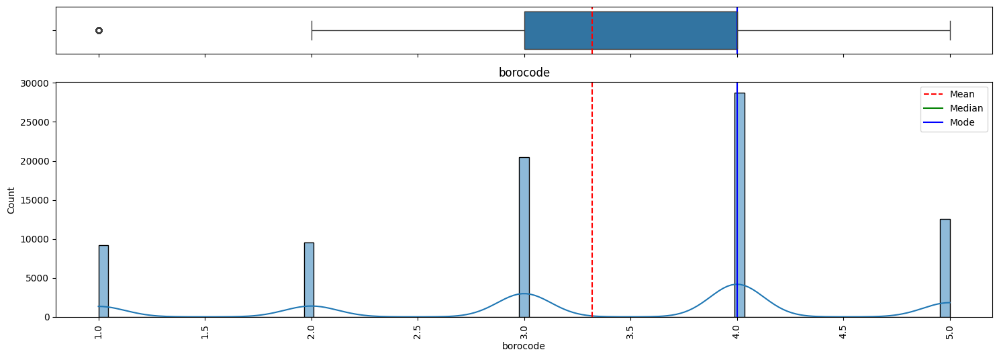

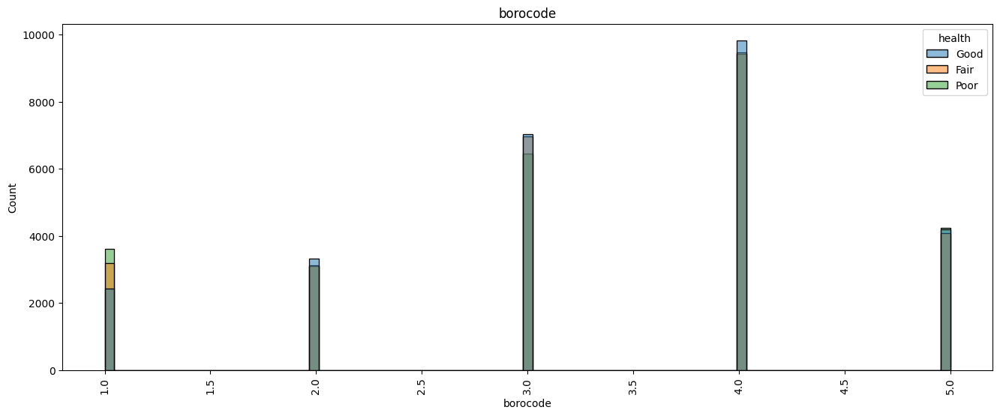

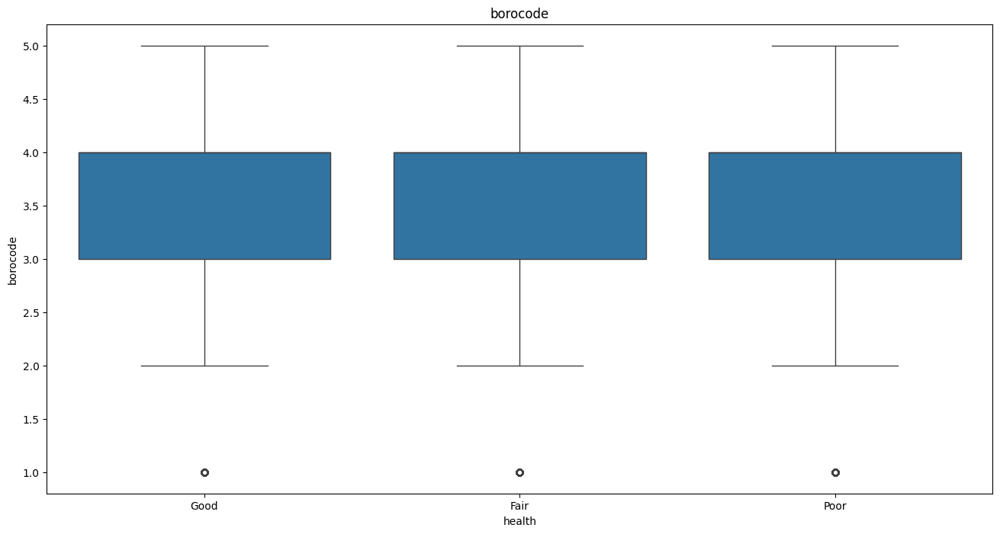

In [53]:
target = 'health'
variable = 'borocode'

hist_and_boxplot(data, variable, variable, 'Count', variable)
hist_of_target(data, target, variable, 'Count', variable)
plot_two_variables(data, target, variable, variable)

In [54]:
print('Средние значения поля "{}", агрегированные по полю "{}": '.format(variable, target))
groupby_spec(data, 'mean', [target], variable, [target], True)

Средние значения поля "borocode", агрегированные по полю "health": 


,borocode
health,
Fair,3.303938
Good,3.374823
Poor,3.282619


Данное поле является уникальным идентификатором для поля "borough" - Название района, в котором расположено дерево. Соответствие со значениями приведено ниже:

In [55]:
groupby_spec(data, 'count', ['borocode', 'borough'], target, ['borocode', 'borough'], True)

,,health
borocode,borough,
1,Manhattan,9226
2,Bronx,9527
3,Brooklyn,20463
4,Queens,28713
5,Staten Island,12524


Данное поле можно использовать как категориальную переменную, которая отражала бы район нахождения дерева, закодированное под числовой признак. Однако использовать его как числовую переменную нельзя. Поэтому данное поле будет отброше из-за наличия идентичного ему поля "borough".

### **Поле cncldist**

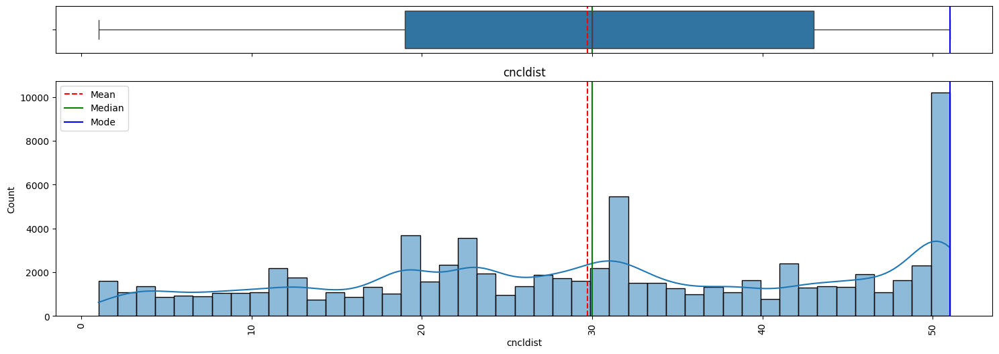

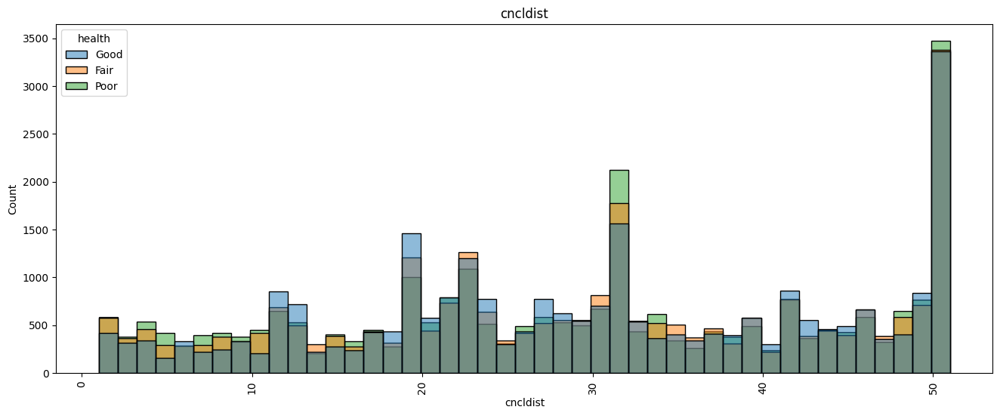

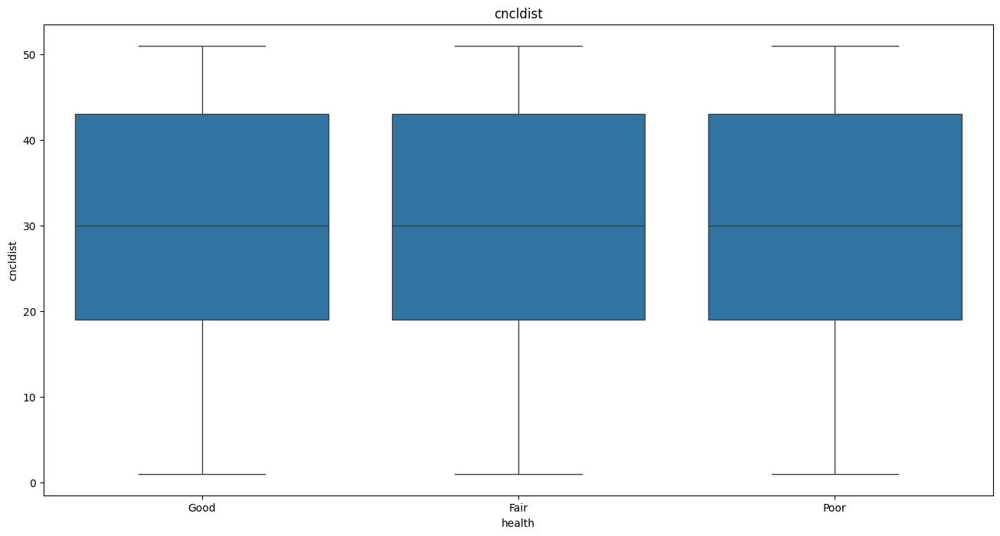

In [365]:
target = 'health'
variable = 'cncldist'

hist_and_boxplot(data, variable, variable, 'Count', variable)
hist_of_target(data, target, variable, 'Count', variable)
plot_two_variables(data, target, variable, variable)

In [366]:
print('Средние значения поля "{}", агрегированные по полю "{}": '.format(variable, target))
groupby_spec(data, 'mean', [target], variable, [target], True)

Средние значения поля "cncldist", агрегированные по полю "health": 


,cncldist
health,
Fair,29.628421
Good,30.075919
Poor,29.405960


Данное поле, хоть и представленное в числовом формате, должно быть категориальным.

Если смотреть на доли классов по каждому уникальному значению, то есть некоторые расхождения. Например, для значения "5" доля хороших деревьев 18%, а для значения "41" - 49.1%:

In [368]:
groupby_two_variables(data, variable, target).sort_values('Total', ascending = False)

Средние значения поля "cncldist", агрегированные по полю "health": 


health,Fair,Good,Poor,Total,Fair_share,Good_share,Poor_share
cncldist,,,,,,,
51,2222,1999,2404,6625,33.539623,30.173585,36.286792
19,1209,1459,1001,3669,32.951758,39.765604,27.282638
50,1156,1365,1068,3589,32.209529,38.032878,29.757593
23,1267,1204,1089,3560,35.589888,33.820225,30.589888
31,986,854,1141,2981,33.076149,28.648105,38.275746
32,792,706,983,2481,31.922612,28.456268,39.621121
49,709,835,766,2310,30.692641,36.147186,33.160173
30,816,706,668,2190,37.260274,32.237443,30.502283
24,639,772,511,1922,33.246618,40.166493,26.586889


Данное поле можно использовать как категориальную переменную, однако перед этим ее необходимо преобразовать в нужный формат.

### **Поле st_assem**

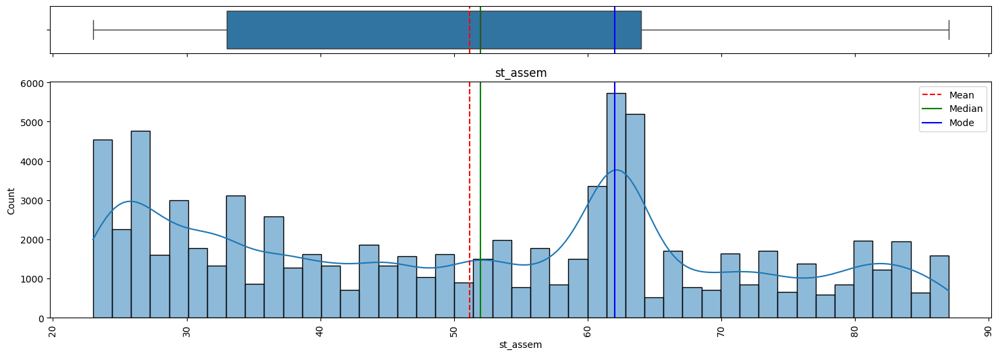

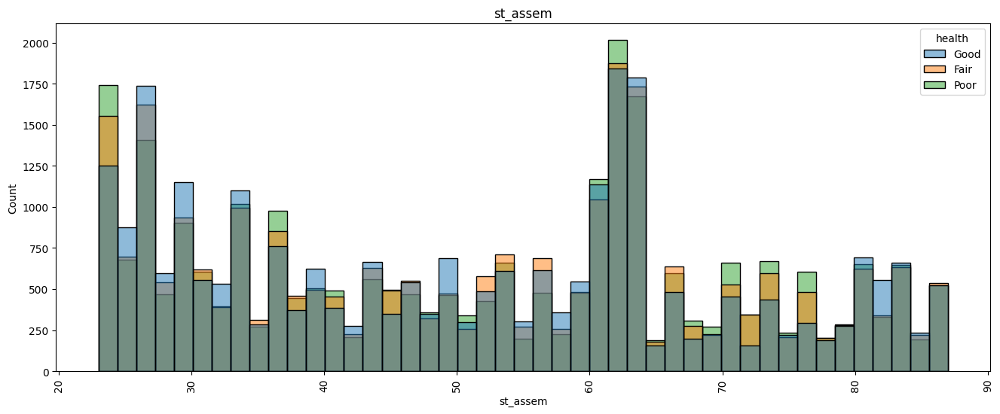

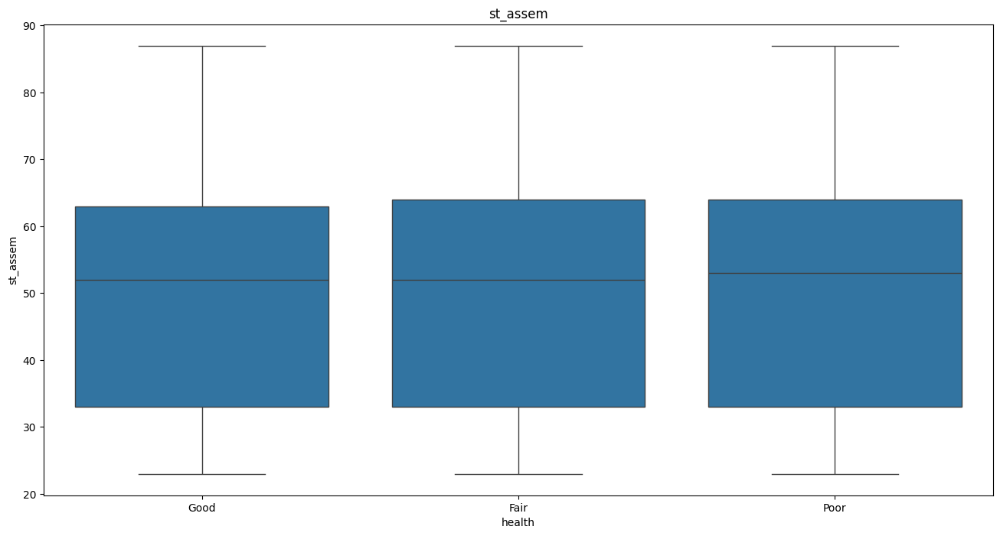

In [59]:
target = 'health'
variable = 'st_assem'

hist_and_boxplot(data, variable, variable, 'Count', variable)
hist_of_target(data, target, variable, 'Count', variable)
plot_two_variables(data, target, variable, variable)

In [60]:
print('Средние значения поля "{}", агрегированные по полю "{}": '.format(variable, target))
groupby_spec(data, 'mean', [target], variable, [target], True)

Средние значения поля "st_assem", агрегированные по полю "health": 


,st_assem
health,
Fair,51.208069
Good,50.732717
Poor,51.586867


Данное поле, хоть и представленное в числовом формате, должно быть категориальным.

Если смотреть на доли классов по каждому уникальному значению, то есть некоторые расхождения. Например, для значения "76" доля хороших деревьев 16.62%, а для значения "82" - 46.47%:

In [61]:
groupby_two_variables(data, variable, target).sort_values('Good_share')

Средние значения поля "st_assem", агрегированные по полю "health": 


health,Fair,Good,Poor,Total,Fair_share,Good_share,Poor_share
st_assem,,,,,,,
76,215,114,357,686,31.341108,16.618076,52.040816
72,345,155,345,845,40.828402,18.343195,40.828402
23,853,554,1152,2559,33.333333,21.649082,45.017585
86,306,177,309,792,38.636364,22.348485,39.015152
37,501,358,647,1506,33.266932,23.771580,42.961487
...,...,...,...,...,...,...,...
58,257,356,223,836,30.741627,42.583732,26.674641
40,303,452,288,1043,29.050815,43.336529,27.612656
87,232,347,215,794,29.219144,43.702771,27.078086


Данное поле можно использовать как категориальную переменную, однако перед этим ее необходимо преобразовать в нужный формат.

### **Поле st_senate**

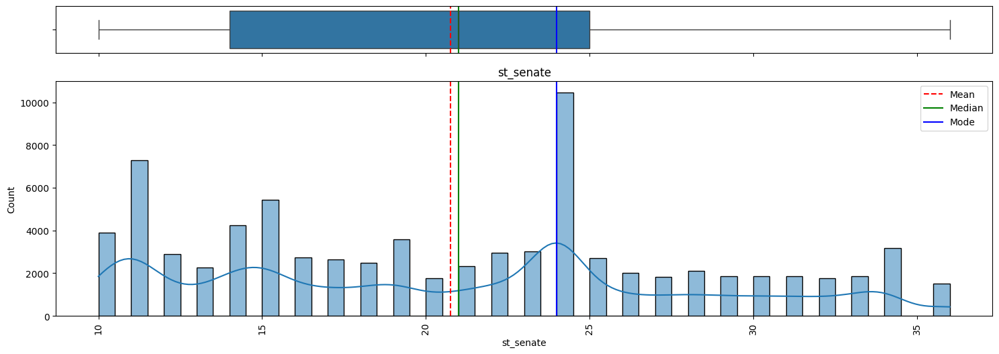

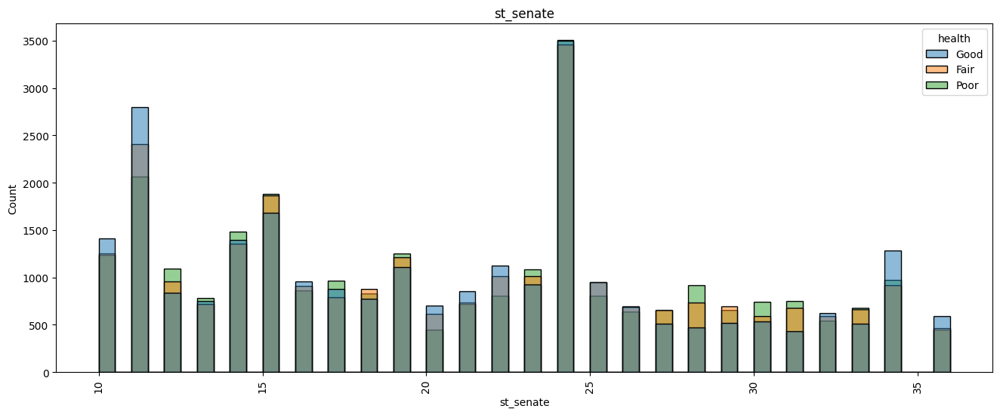

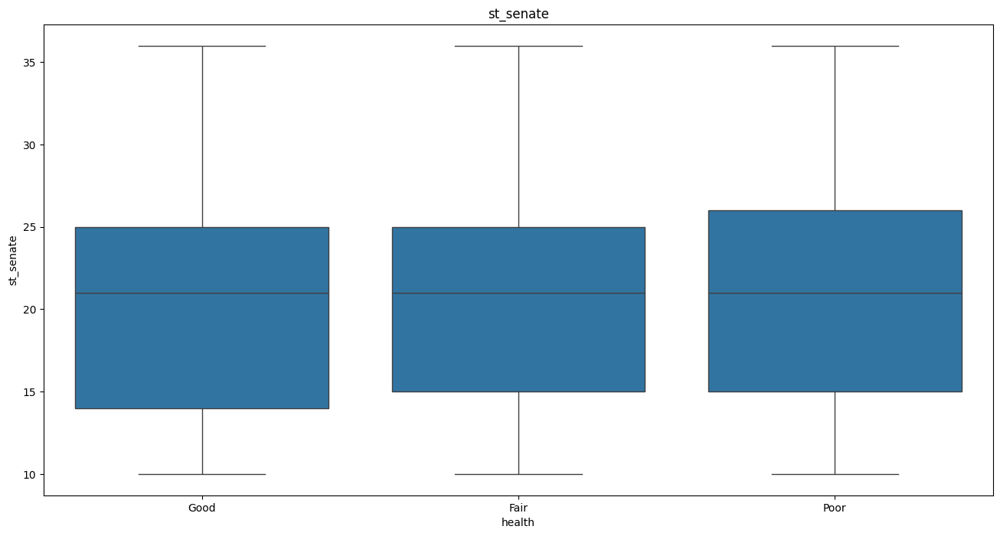

In [62]:
target = 'health'
variable = 'st_senate'

hist_and_boxplot(data, variable, variable, 'Count', variable)
hist_of_target(data, target, variable, 'Count', variable)
plot_two_variables(data, target, variable, variable)

In [63]:
print('Средние значения поля "{}", агрегированные по полю "{}": '.format(variable, target))
groupby_spec(data, 'mean', [target], variable, [target], True)

Средние значения поля "st_senate", агрегированные по полю "health": 


,st_senate
health,
Fair,20.795771
Good,20.570736
Poor,20.899392


Данное поле, хоть и представленное в числовом формате, должно быть категориальным.

Если смотреть на доли классов по каждому уникальному значению, то есть некоторые расхождения. Например, для значения "28" доля хороших деревьев 22.2%, а для значения "34" - 40.5%:

In [64]:
groupby_two_variables(data, variable, target).sort_values('Good_share')

Средние значения поля "st_senate", агрегированные по полю "health": 


health,Fair,Good,Poor,Total,Fair_share,Good_share,Poor_share
st_senate,,,,,,,
28,733,470,914,2117,34.624469,22.201228,43.174303
31,679,435,751,1865,36.407507,23.324397,40.268097
33,661,509,675,1845,35.826558,27.588076,36.585366
29,696,516,651,1863,37.359098,27.697262,34.943639
27,655,511,656,1822,35.949506,28.046103,36.004391
30,593,532,741,1866,31.779207,28.510182,39.710611
12,957,837,1096,2890,33.114187,28.961938,37.923875
23,1012,929,1087,3028,33.421400,30.680317,35.898283
15,1865,1683,1881,5429,34.352551,31.000184,34.647265


Данное поле можно использовать как категориальную переменную, однако перед этим ее необходимо преобразовать в нужный формат.

### **Поле boro_ct**

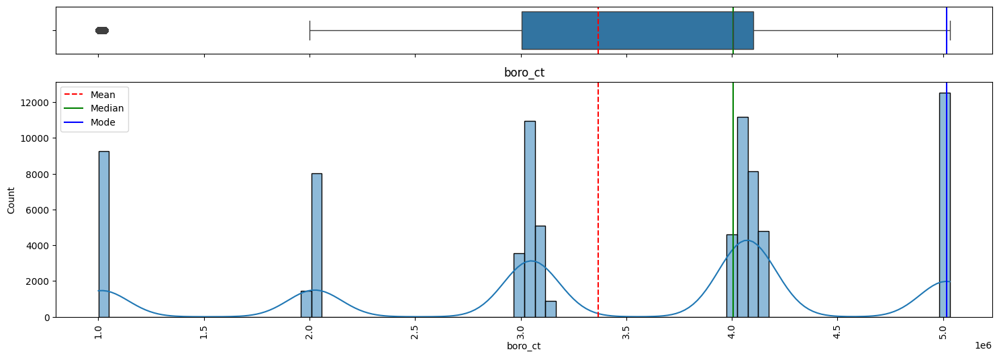

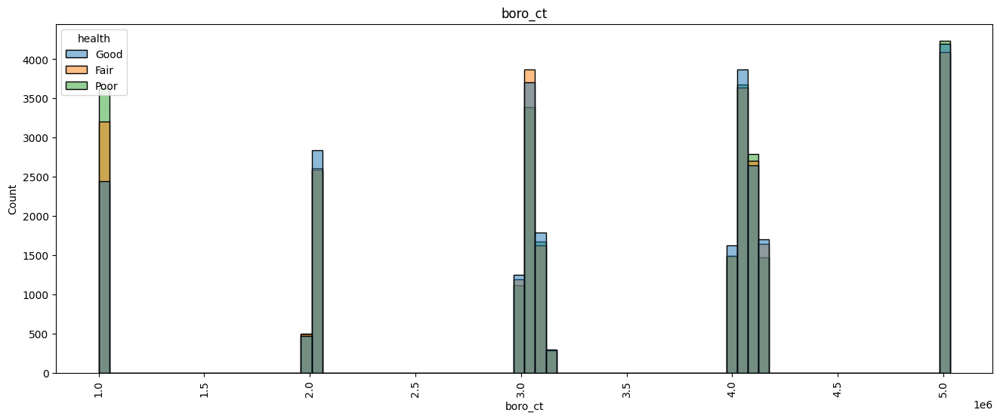

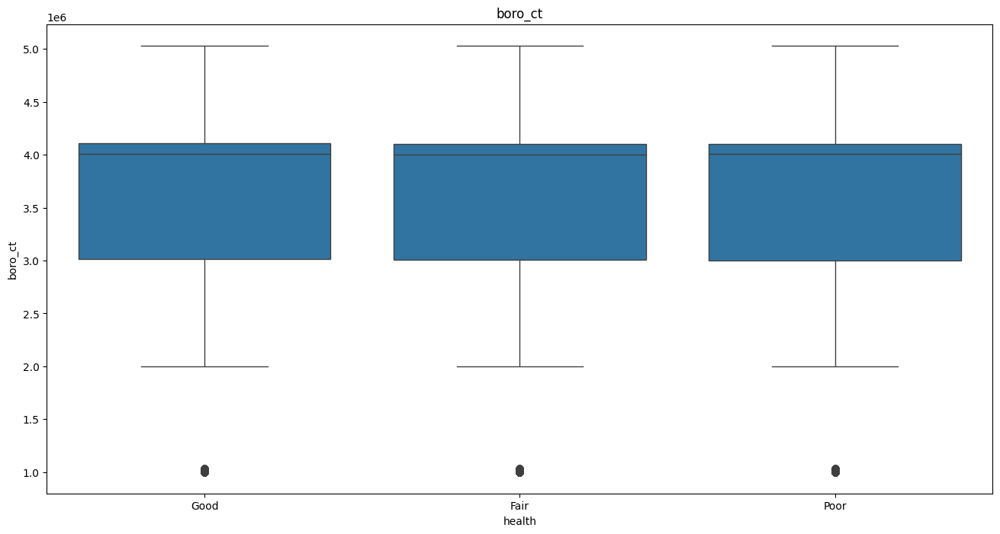

In [65]:
target = 'health'
variable = 'boro_ct'

hist_and_boxplot(data, variable, variable, 'Count', variable)
hist_of_target(data, target, variable, 'Count', variable)
plot_two_variables(data, target, variable, variable)

In [66]:
print('Средние значения поля "{}", агрегированные по полю "{}": '.format(variable, target))
groupby_spec(data, 'mean', [target], variable, [target], True).round(0)

Средние значения поля "boro_ct", агрегированные по полю "health": 


,boro_ct
health,
Fair,3350008.0
Good,3421386.0
Poor,3327907.0


Данное поле представляет из себя идентификатор участка перепеси населения, следовательно, его можно использовать как категориальную переменную. Также видно, что легко можно сгруппировать идентификаторы в 5 бинов:

In [67]:
def conditions(data):    
    if (data['boro_ct'] <= 1500000):
        return '1'
    elif (data['boro_ct'] > 1500000) & (data['boro_ct'] <= 2500000):
        return '2'
    elif (data['boro_ct'] > 2500000) & (data['boro_ct'] <= 3500000):
        return '3'
    elif (data['boro_ct'] > 3500000) & (data['boro_ct'] <= 4500000):
        return '4'
    else:
        return '5'

data['boro_ct_binned'] = data.apply(conditions, axis = 1)

По таблице ниже видно, что есть некоторая зависимость между бинами поля "boro_ct" и  целевой пременной "health". Для бина "1" есть некотрое изменение в доли класса "Good" (26.3% против 32-34 % в других классах):

In [68]:
groupby_two_variables(data, 'boro_ct_binned', target)

Средние значения поля "boro_ct_binned", агрегированные по полю "health": 


health,Fair,Good,Poor,Total,Fair_share,Good_share,Poor_share
boro_ct_binned,,,,,,,
1,3199,2442,3627,9268,34.516616,26.348727,39.134657
2,3103,3305,3077,9485,32.714813,34.844491,32.440696
3,6963,7041,6459,20463,34.027269,34.408445,31.564287
4,9466,9831,9416,28713,32.967645,34.238847,32.793508
5,4087,4199,4238,12524,32.633344,33.527627,33.839029


Данное поле можно использовать как категориальную переменную, однако перед этим ее необходимо преобразовать в нужный формат. 

### **Поля latitude, longitude, x_sp, y_sp**

Для данных полей было предположение о взаимной зависимости, которую можно проверить, построив корреляционную матрицу. Корреляционая матрица демонстрирует коэффициенты корреляции между переменными, где 1 - функциональная зависимость переменных. В даном случае переемнные latitude и y_sp, а также longitude и x_sp имеют абсолютную линейную связь между собой. Т.е. увеличение/уменьшение одной из них неминуемо приведет к аналогичному для другой переменной:

<Axes: >

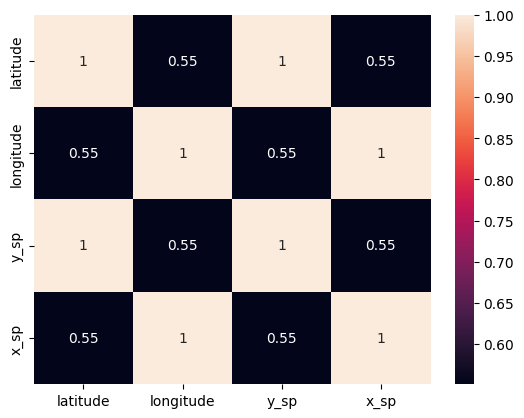

In [69]:
sns.heatmap(data[['latitude', 'longitude', 'y_sp', 'x_sp']].corr(), annot=True)

Поэтому в данном случае можно выбрать поля одной системы координат. Я остановился на использовании latitude и longitude (широта и долгота, соответственно), поскольку это общепринятая система координат. Помимо прочего на базе данных полей можно строить другие геолокационные поля, например, ближайшее расстояние до какого-либо объекта.

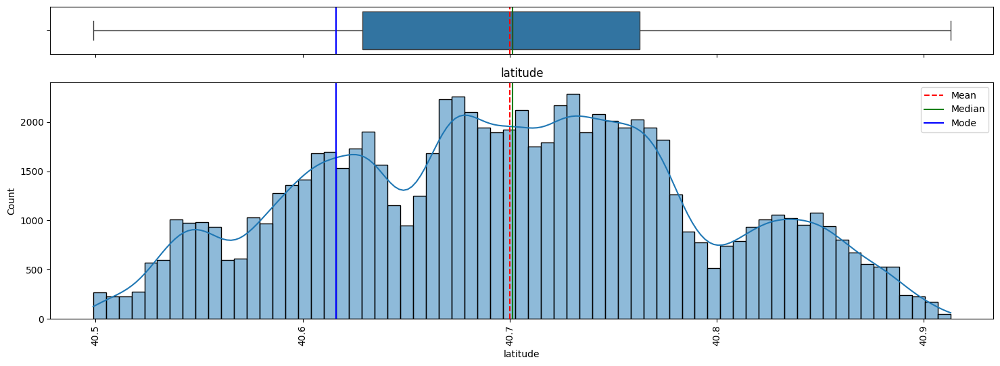

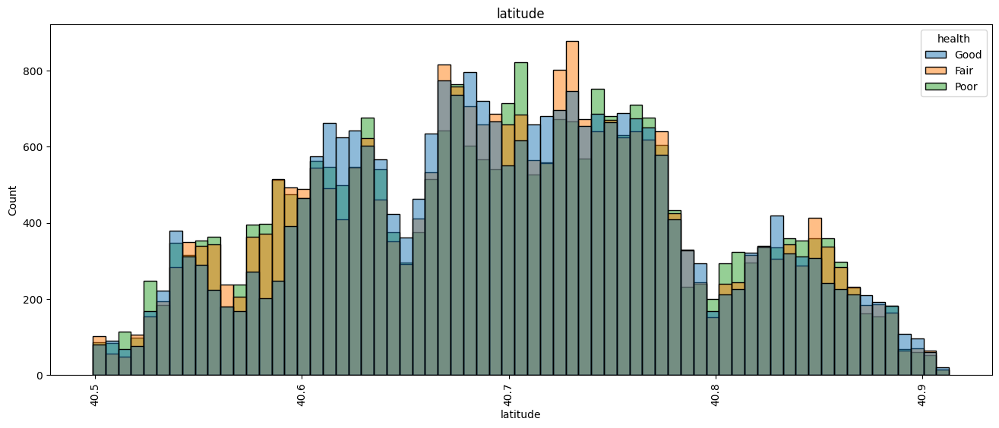

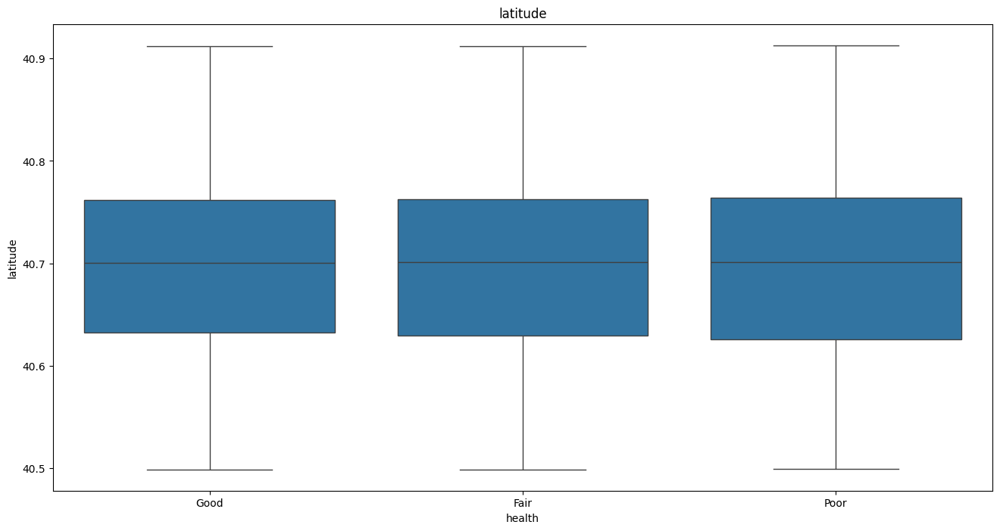

In [70]:
target = 'health'
variable = 'latitude'

hist_and_boxplot(data, variable, variable, 'Count', variable)
hist_of_target(data, target, variable, 'Count', variable)
plot_two_variables(data, target, variable, variable)

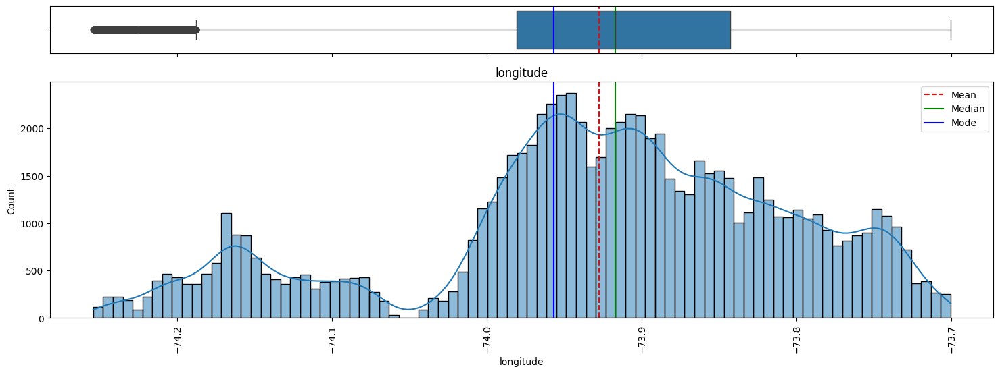

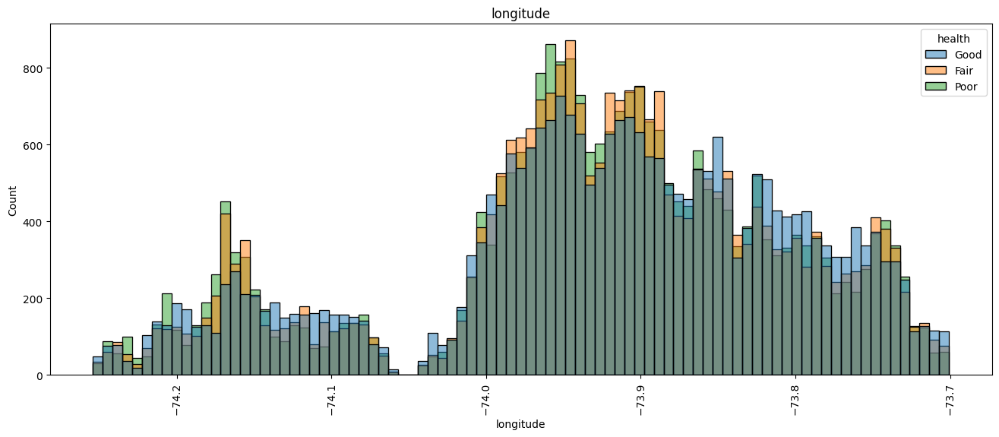

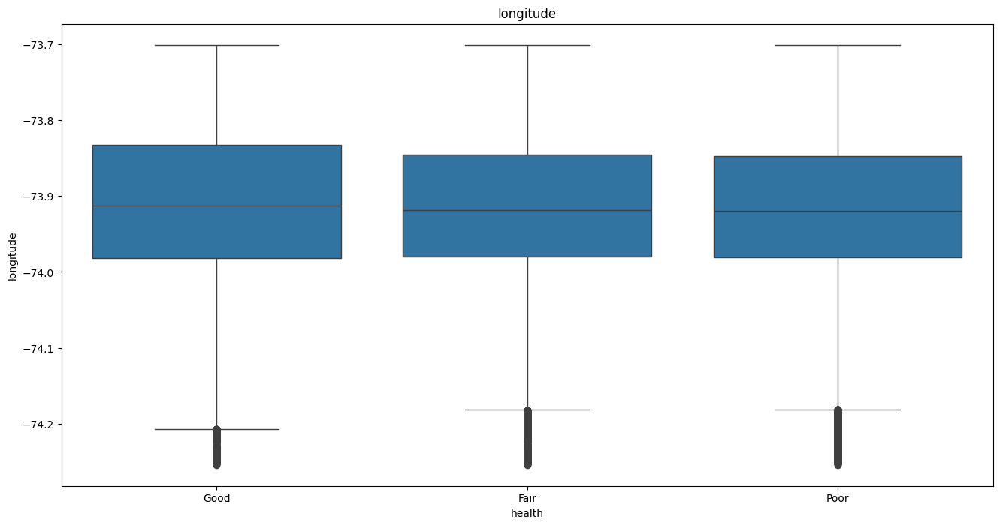

In [71]:
target = 'health'
variable = 'longitude'

hist_and_boxplot(data, variable, variable, 'Count', variable)
hist_of_target(data, target, variable, 'Count', variable)
plot_two_variables(data, target, variable, variable)

Визуализация данных полей при помощи метода scatterplot библиотеки seaborn приводит к своеобразному представлению карты Нью-Йорка. Следовательно, данные поля можно использовать для визуализации качества деревьев на карте, что может помочь в выявлении инсайтов в данных:

<Axes: xlabel='longitude', ylabel='latitude'>

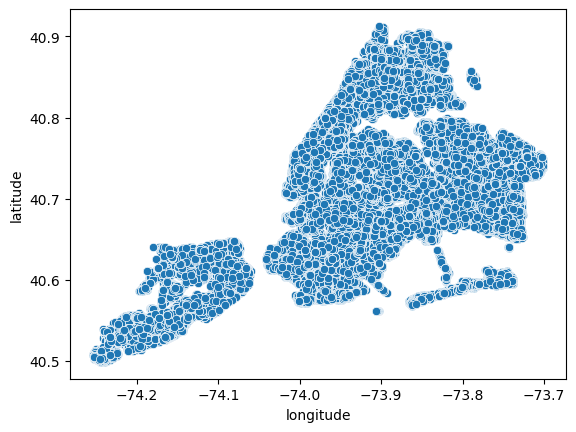

In [72]:
sns.scatterplot(data = data, y = 'latitude', x = 'longitude')

Такие поля нельзя использовать как числовые переменные при постройки моделей ML/AI. Однако на их базе можно сформировать другие поля, например, поле с расстоянием к ближайшему дереву того или иного качества.

#### **Расчет ближайшего расстояния до дерева с качеством "Poor"**

Для расчета дляжайшего расстояния до дерева с качеством "Poor" предварительно понадобится таблица с данными деревьями:

In [73]:
lat_lon_poor_health = data[data['health'] == 'Poor'].reset_index()[['latitude', 'longitude', 'health']]
lat_lon_poor_health.rename(columns={'latitude': 'latitude_x', 'longitude': 'longitude_x'}, inplace = True)
lat_lon_poor_health.head()

,latitude_x,longitude_x,health
0,40.781735,-73.912020,Poor
1,40.846376,-73.917632,Poor
2,40.692278,-73.961423,Poor
3,40.668231,-73.980730,Poor
4,40.596836,-73.772454,Poor


In [74]:
list_of_results_haversine_manhattan = []
list_of_results_haversine_euclidian = []

for i in range(len(data)):
    
    data_merged = pd.merge(data.iloc[i:i+1], lat_lon_poor_health, how = 'cross')
    
    list_of_distances = haversine_manhattan(data_merged['latitude'], data_merged['longitude'], data_merged['latitude_x'], data_merged['longitude_x'])
    list_of_distances.replace(0, np.nan, inplace = True)
    list_of_results_haversine_manhattan.append(list_of_distances.min())

    list_of_distances = haversine_euclidian(data_merged['latitude'], data_merged['longitude'], data_merged['latitude_x'], data_merged['longitude_x'])
    list_of_distances.replace(0, np.nan, inplace = True)
    list_of_results_haversine_euclidian.append(list_of_distances.min())
    
data['haversine_manhattan_distance_to_poor_tree'] = list_of_results_haversine_manhattan
data['haversine_euclidian_distance_to_poor_tree'] = list_of_results_haversine_euclidian

Проверяем влияние ближайшего "манхеттенского" расстояния к плохому дереву:

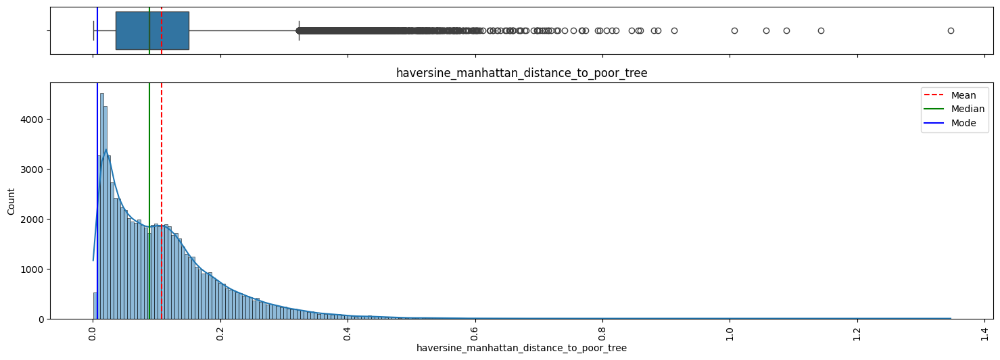

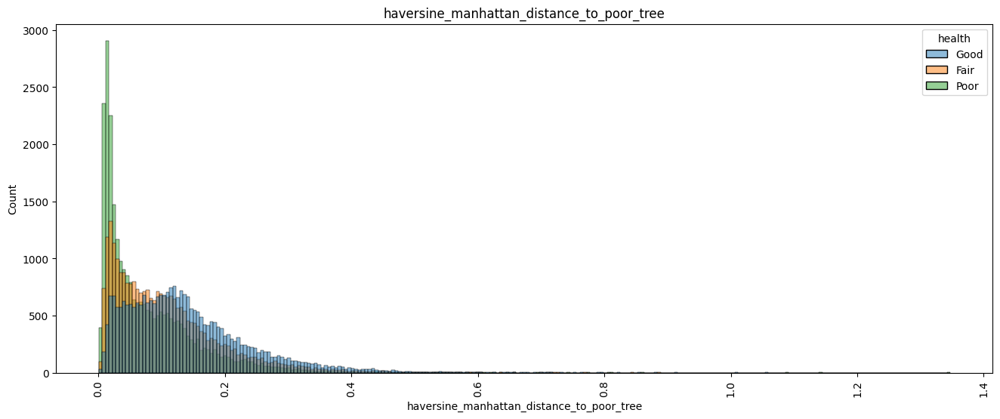

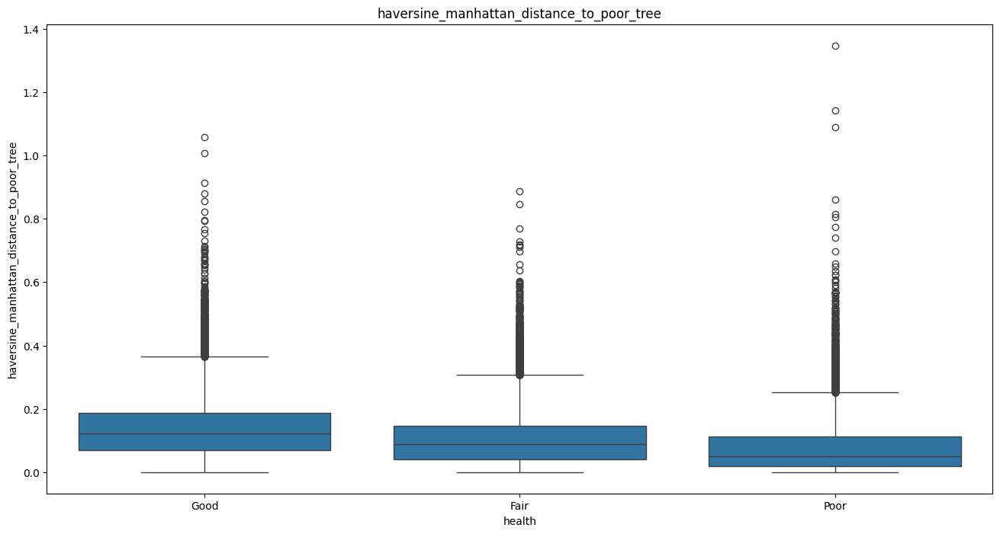

In [75]:
target = 'health'
variable = 'haversine_manhattan_distance_to_poor_tree'

hist_and_boxplot(data, variable, variable, 'Count', variable)
hist_of_target(data, target, variable, 'Count', variable)
plot_two_variables(data, target, variable, variable)

В среднем наблюдается тенденция, что к плохому дереву ближе плохое дерево:

In [76]:
print('Средние значения поля "{}", агрегированные по полю "{}": '.format(variable, target))
groupby_spec(data, 'mean', [target], variable, [target], True)

Средние значения поля "haversine_manhattan_distance_to_poor_tree", агрегированные по полю "health": 


,haversine_manhattan_distance_to_poor_tree
health,
Fair,0.106228
Good,0.140314
Poor,0.076511


Проверяем влияние ближайшего "евклидового" расстояния к плохому дереву:

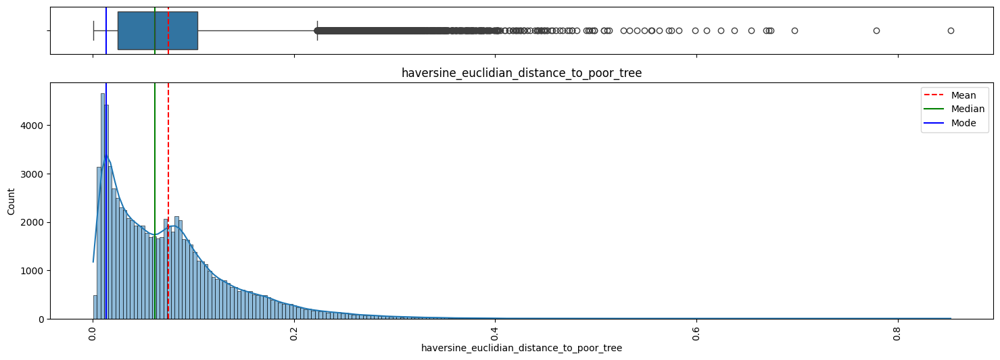

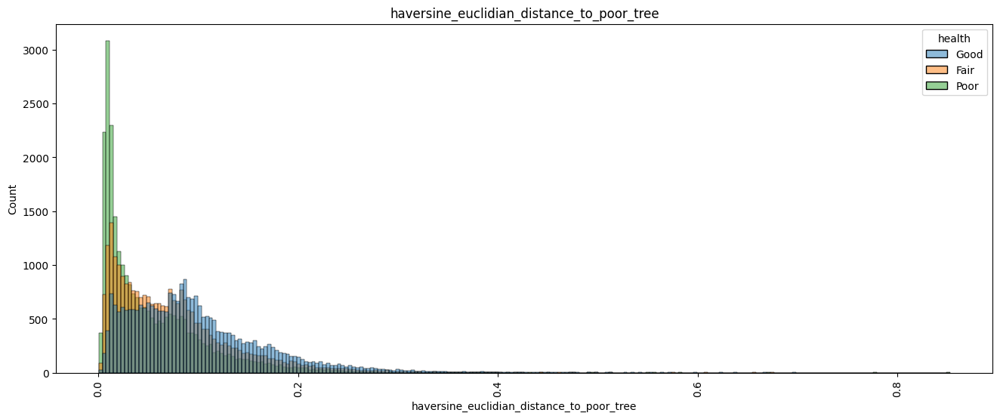

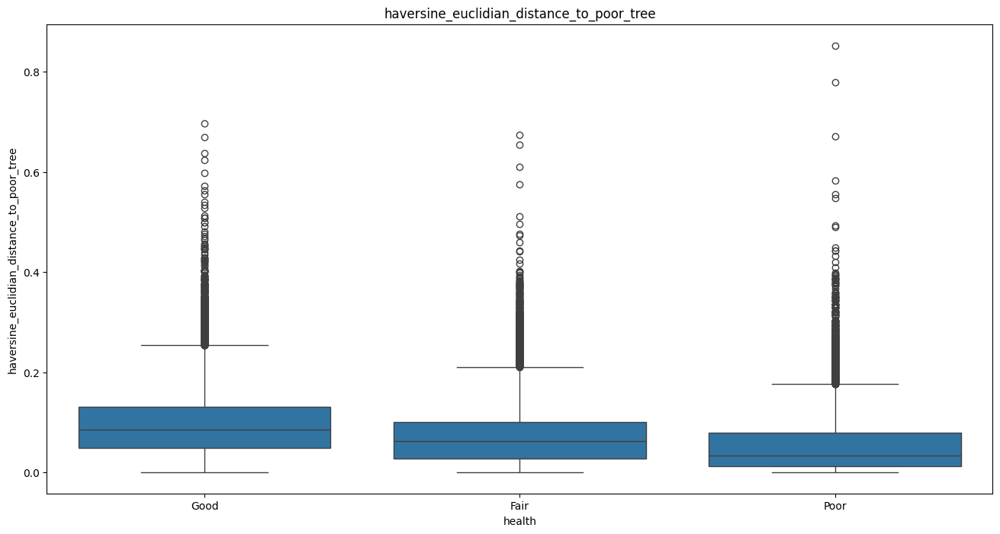

In [77]:
target = 'health'
variable = 'haversine_euclidian_distance_to_poor_tree'

hist_and_boxplot(data, variable, variable, 'Count', variable)
hist_of_target(data, target, variable, 'Count', variable)
plot_two_variables(data, target, variable, variable)

Здесь также в среднем наблюдается тенденция, что к плохому дереву ближе плохое дерево:

In [78]:
print('Средние значения поля "{}", агрегированные по полю "{}": '.format(variable, target))
groupby_spec(data, 'mean', [target], variable, [target], True)

Средние значения поля "haversine_euclidian_distance_to_poor_tree", агрегированные по полю "health": 


,haversine_euclidian_distance_to_poor_tree
health,
Fair,0.073956
Good,0.097685
Poor,0.053147


Два данных поля будут включены для последующего анализа.

### **Поля council district, census tract**

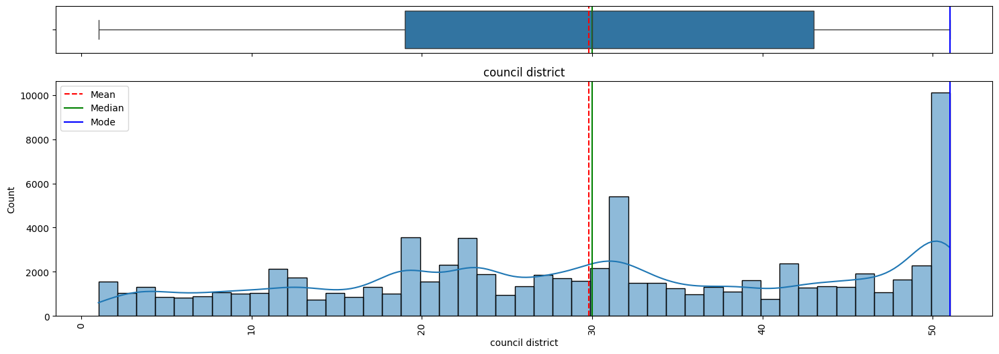

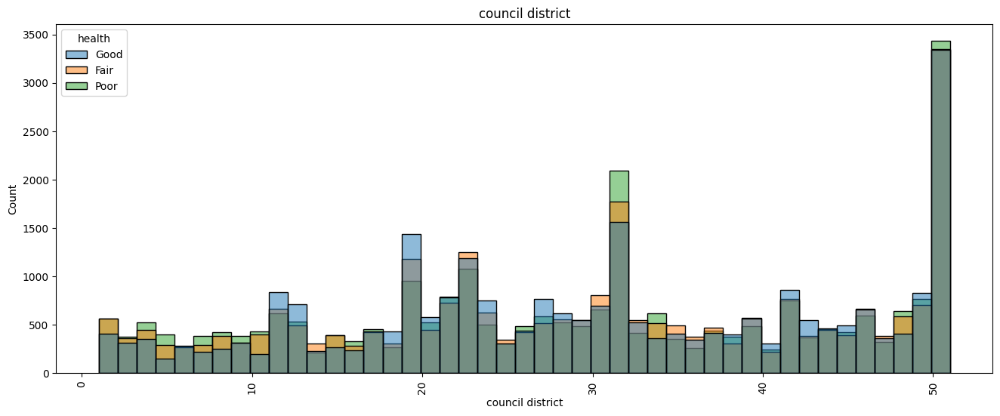

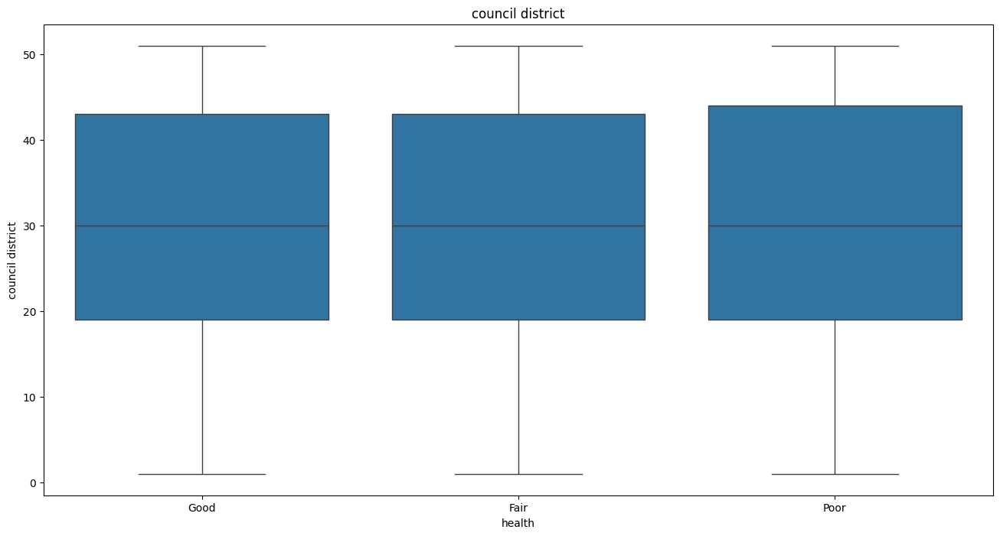

In [79]:
target = 'health'
variable = 'council district'

hist_and_boxplot(data, variable, variable, 'Count', variable)
hist_of_target(data, target, variable, 'Count', variable)
plot_two_variables(data, target, variable, variable)

In [80]:
print('Средние значения поля "{}", агрегированные по полю "{}": '.format(variable, target))
groupby_spec(data, 'mean', [target], variable, [target], True)

Средние значения поля "council district", агрегированные по полю "health": 


,council district
health,
Fair,29.711599
Good,30.167357
Poor,29.505950


Разбиение по полю council district дает некоторые результаты в разбиении по классам:

In [81]:
groupby_two_variables(data, variable, target).sort_values('Good_share').round(3)

Средние значения поля "council district", агрегированные по полю "health": 


health,Fair,Good,Poor,Total,Fair_share,Good_share,Poor_share
council district,,,,,,,
5.0,292,152,398,842,34.679,18.052,47.268
10.0,399,193,429,1021,39.079,18.903,42.018
2.0,293,187,305,785,37.325,23.822,38.854
8.0,382,254,425,1061,36.004,23.940,40.057
34.0,514,362,617,1493,34.427,24.246,41.326
7.0,287,219,384,890,32.247,24.607,43.146
48.0,586,404,644,1634,35.863,24.725,39.412
15.0,390,264,388,1042,37.428,25.336,37.236
4.0,446,355,523,1324,33.686,26.813,39.502


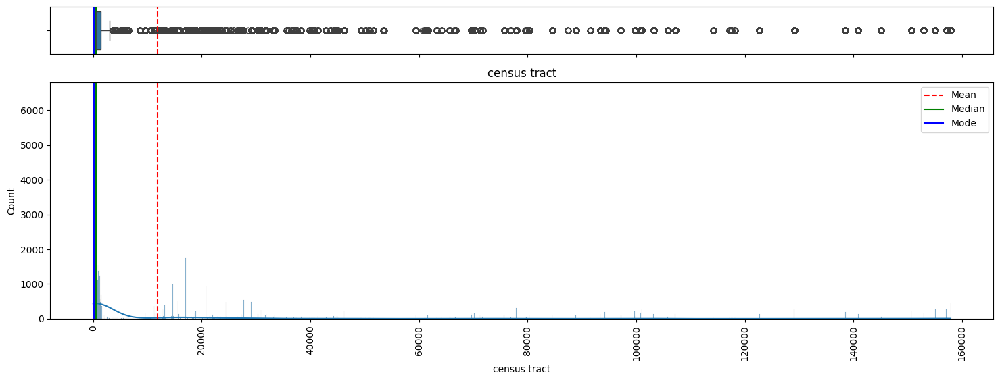

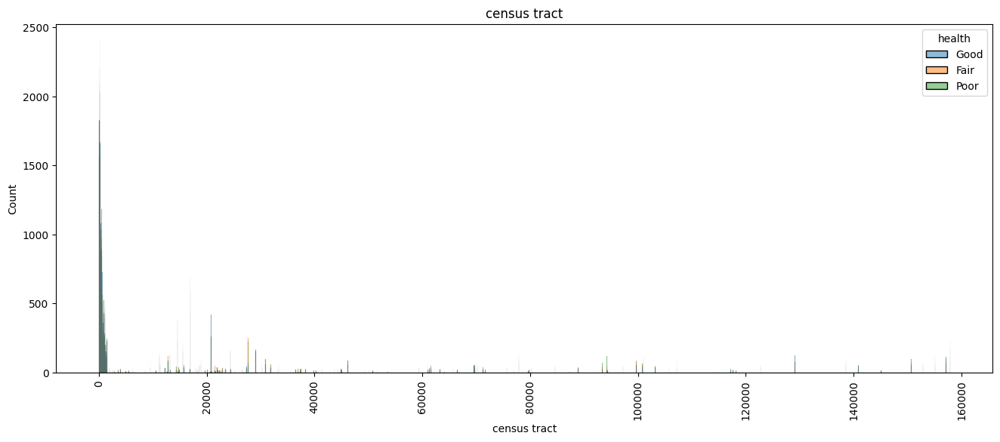

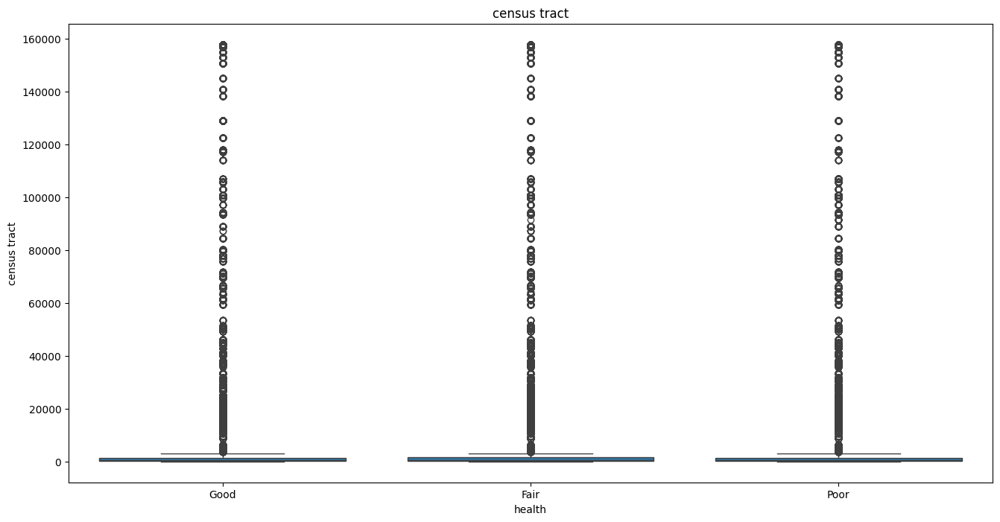

In [82]:
target = 'health'
variable = 'census tract'

hist_and_boxplot(data, variable, variable, 'Count', variable)
hist_of_target(data, target, variable, 'Count', variable)
plot_two_variables(data, target, variable, variable)

In [83]:
print('Средние значения поля "{}", агрегированные по полю "{}": '.format(variable, target))
groupby_spec(data, 'mean', [target], variable, [target], True)

Средние значения поля "census tract", агрегированные по полю "health": 


,census tract
health,
Fair,12005.462730
Good,12004.236537
Poor,11621.658846


Аналогично и для поля census tract, разбиение по полю council district дает некоторые результаты в разбиении по классам:

In [84]:
groupby_two_variables(data, variable, target).sort_values('Total', ascending = False).head(10)

Средние значения поля "census tract", агрегированные по полю "health": 


health,Fair,Good,Poor,Total,Fair_share,Good_share,Poor_share
census tract,,,,,,,
198.0,123.0,139.0,222.0,484.0,25.413223,28.719008,45.867769
176.0,163.0,152.0,156.0,471.0,34.607219,32.271762,33.121019
226.0,123.0,105.0,184.0,412.0,29.854369,25.485437,44.660194
17005.0,140.0,80.0,183.0,403.0,34.739454,19.851117,45.409429
138.0,131.0,113.0,111.0,355.0,36.901408,31.830986,31.267606
20801.0,98.0,173.0,77.0,348.0,28.160920,49.712644,22.126437
892.0,125.0,93.0,128.0,346.0,36.127168,26.878613,36.994220
20803.0,80.0,116.0,138.0,334.0,23.952096,34.730539,41.317365
17011.0,135.0,32.0,135.0,302.0,44.701987,10.596026,44.701987


Оба поля можно использовать как категориальную переменную.

### **Поля bin, bbl**

Поля bin и bbl также имеют абсолютную взаимосвязь, следовательно, одну из переменных можно отбросить:

<Axes: >

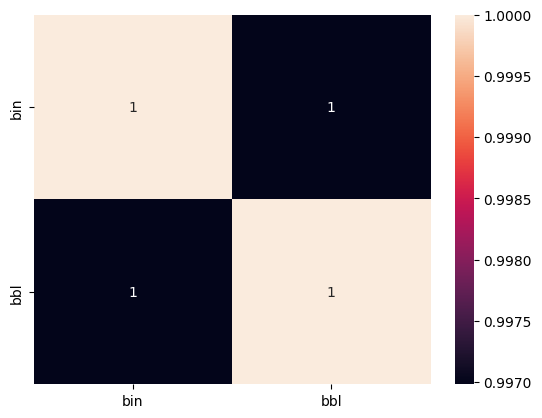

In [85]:
sns.heatmap(data[['bin', 'bbl']].corr(), annot=True)

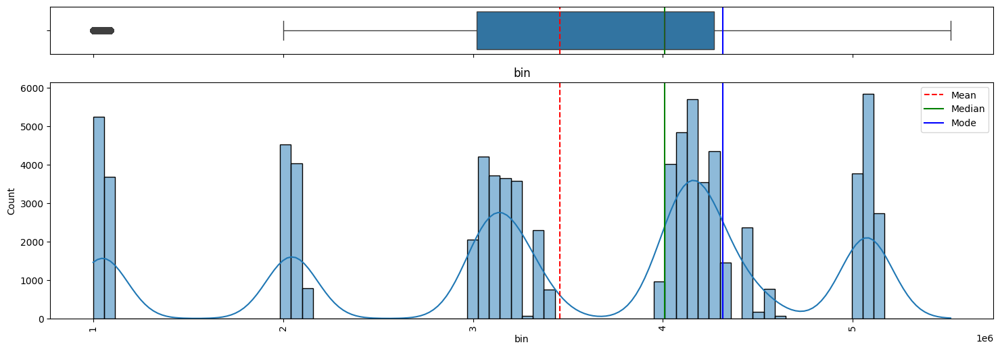

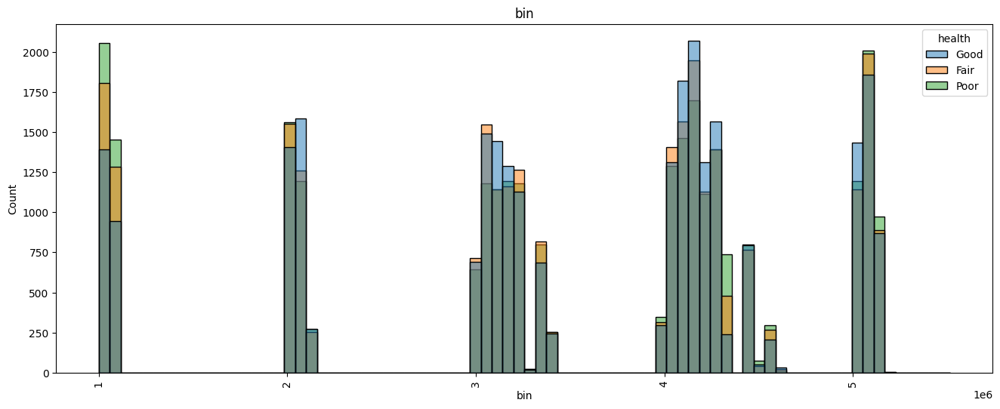

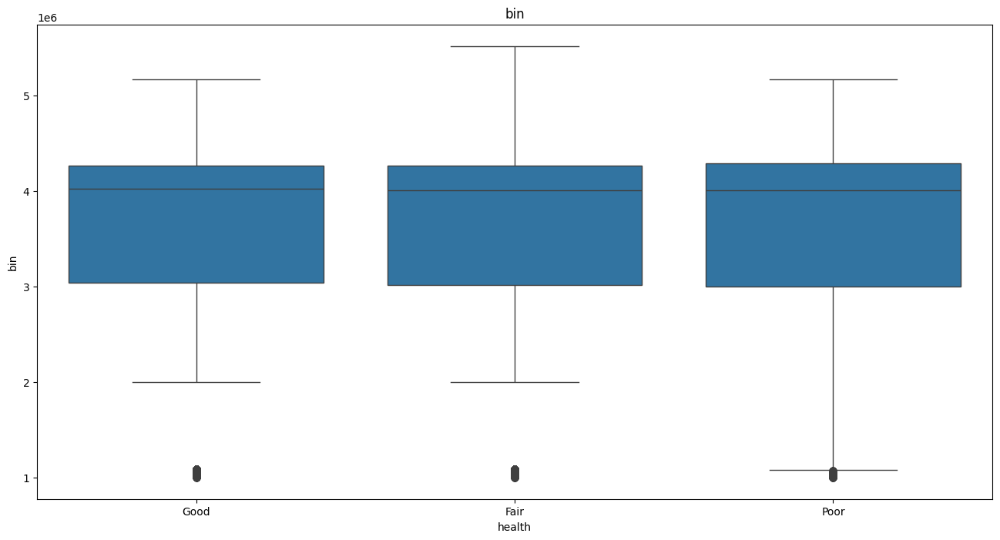

In [86]:
target = 'health'
variable = 'bin'

hist_and_boxplot(data, variable, variable, 'Count', variable)
hist_of_target(data, target, variable, 'Count', variable)
plot_two_variables(data, target, variable, variable)

In [87]:
print('Средние значения поля "{}", агрегированные по полю "{}": '.format(variable, target))
groupby_spec(data, 'mean', [target], variable, [target], True)

Средние значения поля "bin", агрегированные по полю "health": 


,bin
health,
Fair,3.439336e+06
Good,3.512760e+06
Poor,3.420464e+06


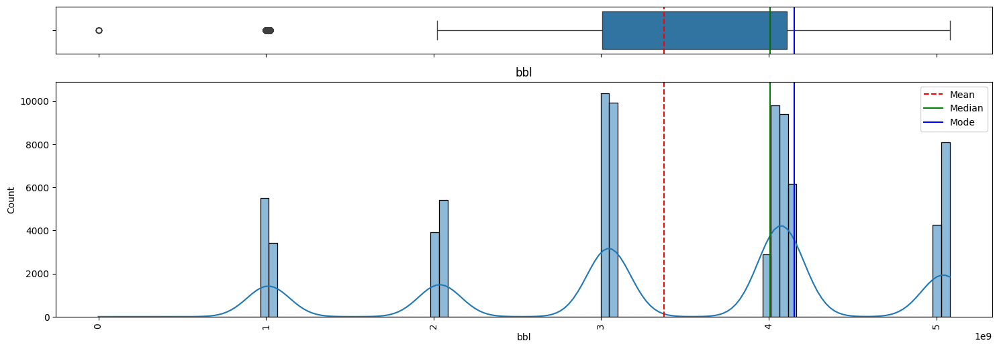

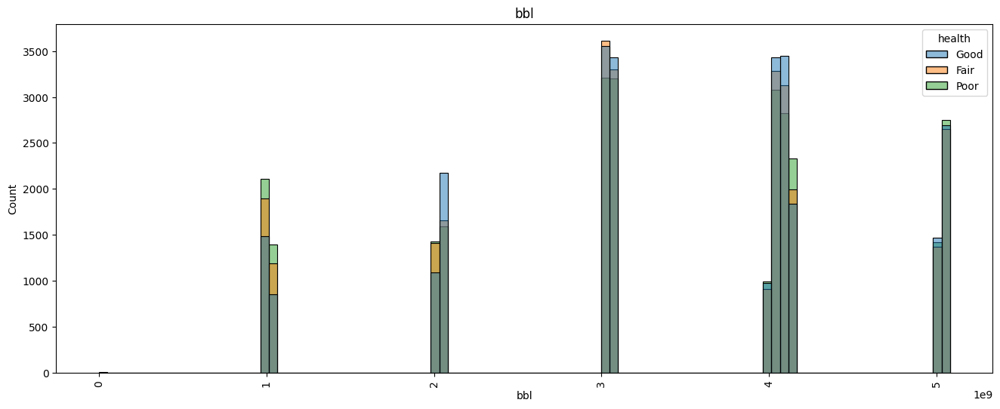

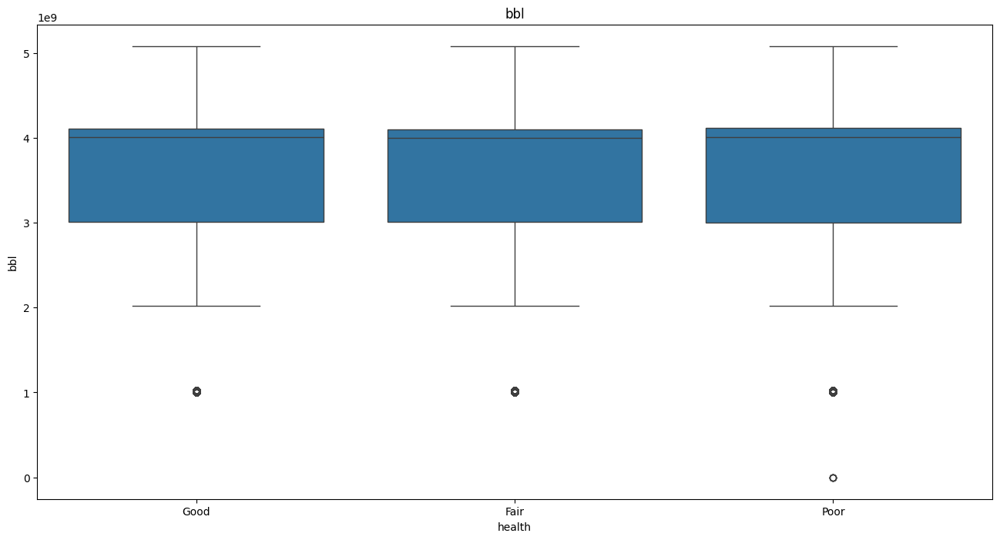

In [88]:
target = 'health'
variable = 'bbl'

hist_and_boxplot(data, variable, variable, 'Count', variable)
hist_of_target(data, target, variable, 'Count', variable)
plot_two_variables(data, target, variable, variable)

In [89]:
print('Средние значения поля "{}", агрегированные по полю "{}": '.format(variable, target))
groupby_spec(data, 'mean', [target], variable, [target], True)

Средние значения поля "bbl", агрегированные по полю "health": 


,bbl
health,
Fair,3.357393e+09
Good,3.431658e+09
Poor,3.336960e+09


В целом, сильных отличий между переменными нет. Поэтому для последующего анализа я использовал поле "bbl".

Также видно, что данное поле можно разбить на 5 основных бинов:

In [90]:
def conditions(data):    
    if (data['bbl'] <= 1500000000):
        return '1'
    elif (data['bbl'] > 1500000000) & (data['bbl'] <= 2500000000):
        return '2'
    elif (data['bbl'] > 2500000000) & (data['bbl'] <= 3500000000):
        return '3'
    elif (data['bbl'] > 3500000000) & (data['bbl'] <= 4500000000):
        return '4'
    else:
        return '5'

data['bbl_binned'] = data.apply(conditions, axis = 1)

Подсчет долей каждого класса целевой переменной по бинам дает некоторое разбиение:

In [91]:
groupby_two_variables(data, 'bbl_binned', target)

Средние значения поля "bbl_binned", агрегированные по полю "health": 


health,Fair,Good,Poor,Total,Fair_share,Good_share,Poor_share
bbl_binned,,,,,,,
1,3086,2337,3506,8929,34.561541,26.173144,39.265315
2,3063,3261,3024,9348,32.766367,34.884467,32.349166
3,6916,6984,6416,20316,34.042134,34.376846,31.581020
4,9318,9695,9226,28239,32.996919,34.331952,32.671129
5,4435,4541,4645,13621,32.560018,33.338228,34.101755


Поскольку данная переменная прилагается к набору данных, но никак не объясняется, что это за переменная и откуда она, то ее использование в моделях под вопросом.

### **Основные выводы**

По распределению можно сделать следующие выводы:
- tree_id, как и ожидалось, поле чисто для фиксирования уникального идентификатора. Поэтому его можно отбросить; 
- block_id, community board, borocode, bbl и boro_ct имеют подозрительно схожие распределения. Возжно данные поля взаимосвязаны;
- tree_dbh имеет выбросы в распределении, поэтому перед моделированием потребуется дополнительная обработка аномальных значений;
- community board, borocode, cncldist, st_assem, st_senate, boro_ct, council district, census tract, bin, bbl, несмотря на то, что это числовые типы данных, по сути принимают достаточно изолированные(дискретные) значения и по своей качественной сути больше подходят к категориальным переменным, нежели к числовым. Следовательно, для них непременима обработка как числовых значений;
- latitude и y_sp; longitude и x_sp, bin и bbl - взаимозависимые переменные, с коэффициентом корреляции равным единице.

При помощи метода heatmap библиотеки seaborn можно наглядно показать корреляцию между данными переменнами latitude и y_sp; longitude и x_sp:

## **Анализ категориальных и текстовых полей**

Всего есть 26 полей с типом object, включая целевую переменную "health":

In [92]:
print('Поля с типом object: {}'.format(data.select_dtypes(object).columns[:-4]))

Поля с типом object: Index(['created_at', 'curb_loc', 'status', 'health', 'spc_latin', 'spc_common',
       'steward', 'guards', 'sidewalk', 'user_type', 'problems', 'root_stone',
       'root_grate', 'root_other', 'trunk_wire', 'trnk_light', 'trnk_other',
       'brch_light', 'brch_shoe', 'brch_other', 'address', 'zip_city',
       'borough', 'nta', 'nta_name', 'state'],
      dtype='object')


Для более удобной предобработки данный тип следует дополнительно разграничивать на:
- Бинарный: переменная вида Yes/No, где всего два возможных значения;
- Категориальный: конечное число категорий;
- Текстовый: поле с обширным тектом, написанным в произвольной форме. В качестве основных кандидатов поля "problems" и "adress".

Такие разграничения полезны, поскольку для разных тектовых полей нужна разная предобработка, в том числе по сложности:
- Бинарные переменные обычно требуют только преобразование по принципу "one hot encoding": значения заменяются на 0/1, после чего могут спокойно использоваться в моделях ML/AI;
- Простые категориальные переменные(поля, в которых значения принимают несколько разных уникальных текстовых значений) также обычно преобразуют методом "one hot encoding", однако здесь формируются новые столбцы в количестве n - 1, где n - количество уникальных значений, которые принимает исходное поле. Один столбец отрбрасывают во избежание мультиколлинеарности (когда поля тесно связаны друг с другом). Здесь,в отличие от бинарных категориальных переменных, может потребоваться дополнительная проверка на то, какое поле отбросить после проведения операции "one hot encoding". Как правило, это должно быть самое неинформативное поле из всех остальных;
- Тектовые поля могут потребовать разные способы обработки, как простые(например, подсчет слов, флаг наличия слова в поле), как и более сложные (например, векторизация, Bag of Words, TD-ITF матчинг).

### **created_at, status, state**

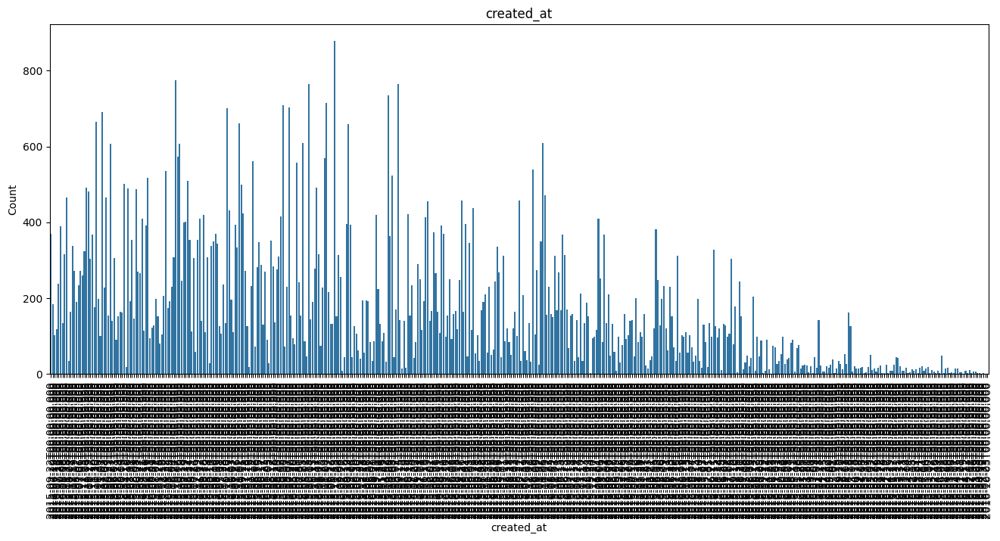

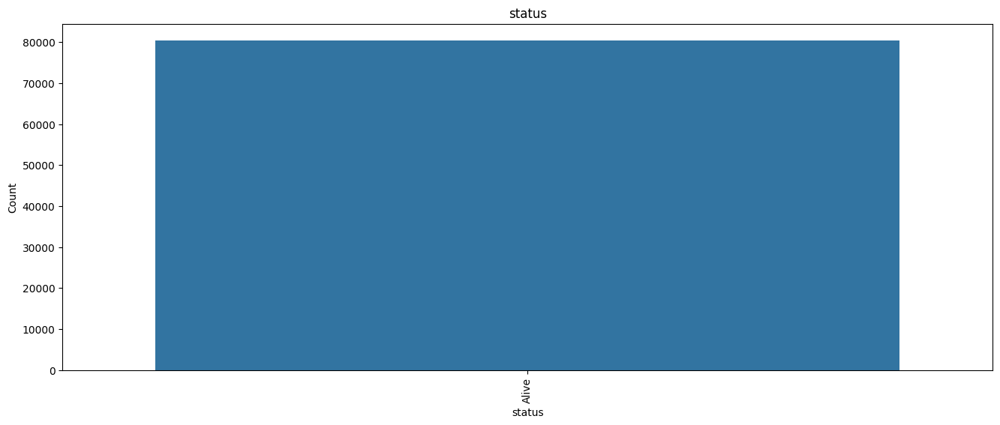

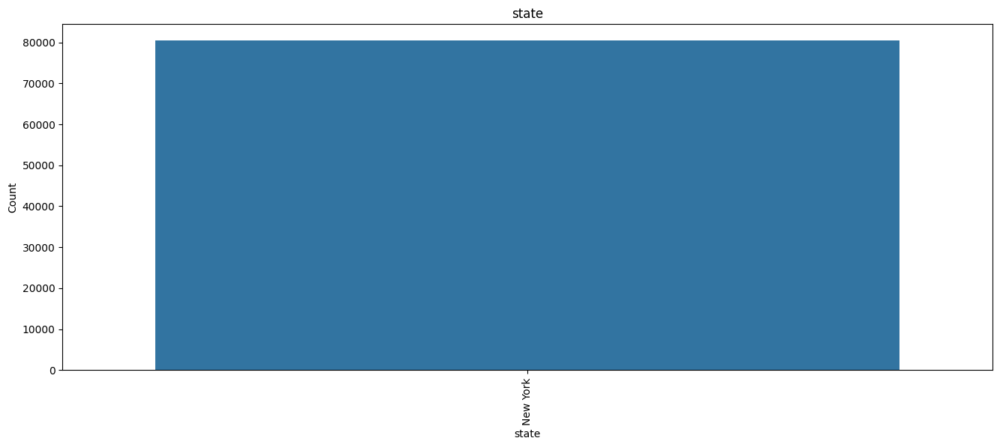

In [93]:
hist(data, 'created_at', 'created_at', 'Count', 'created_at')
hist(data, 'status', 'status', 'Count', 'status')
hist(data, 'state', 'state', 'Count', 'state')

Данные поля можно отбросить по причинам:
- created_at: нерелевантно для данной задачи. Даже если бы нашлась значимая зависимость между данным и полем и целевой переменной, то это, скорее, признак систематической ошибки. Значения целевой переменной не должны зависеть от того, когда и в какое время данные были внесены в систему;
- status: для данной задачи  необходимы только записи со значением "Alive". Остальные значения для данной задачи нерелевантны;
- state: принимает только одно значение, поэтому из-за невариабельности не несет никакого смысла.

### **spc_latin, spc_common**

Для проверки соотвествия двух категориальных переменных можно их сгруппировать. Тогда на каждое уникальное значение одного поля будет уникальное значение другого поля. Данное действие можно выполнить при помощи следующей конструкции:

In [94]:
data.groupby(['spc_common']).spc_latin.nunique().max()

np.int64(1)

Сначала группируем по полю "spc_common", после чего при помощи метода "nunique" библиотеки pandas считаем количсевто уникальных значений по полю "spc_latin". Если есть полное соответствие, то тогда максимальное значение по всем полям будет единица.

В данном случае так и произошло, поэтому одно поле можно отбросить. Для дальнейшего анализа будет использовано поле "spc_common".

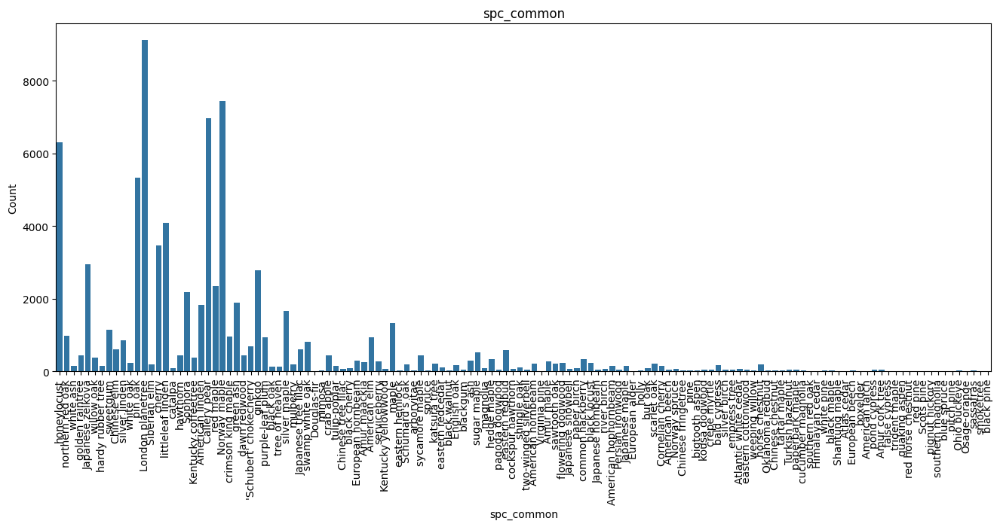

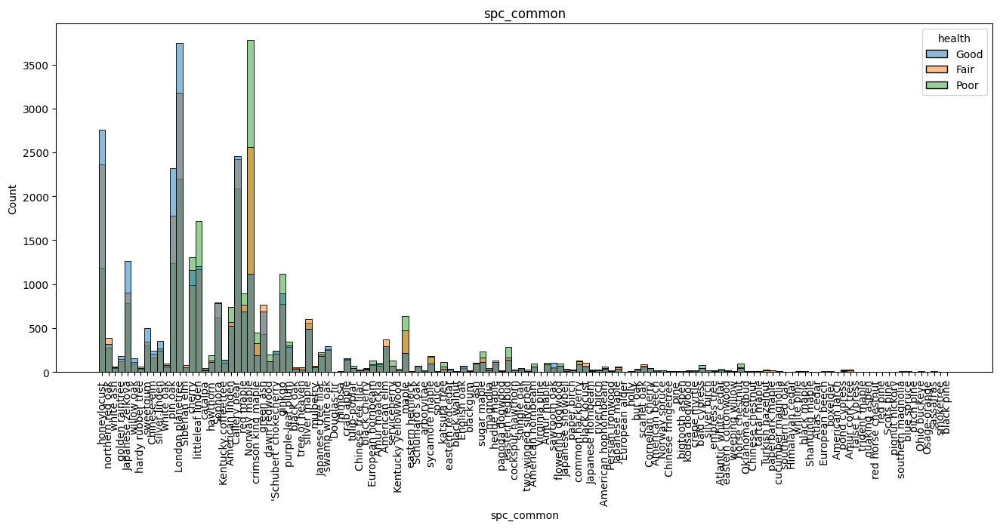

In [95]:
target = 'health'
variable = 'spc_common'

hist(data, variable, variable, 'Count', variable)
hist_of_target(data, target, variable, 'Count', variable)

In [96]:
data['spc_common'].value_counts().head(30)

spc_common
London planetree          9124
Norway maple              7453
Callery pear              6968
honeylocust               6315
pin oak                   5328
littleleaf linden         4095
cherry                    3460
Japanese zelkova          2947
ginkgo                    2784
red maple                 2351
Sophora                   2183
green ash                 1888
American linden           1827
silver maple              1655
maple                     1324
sweetgum                  1146
northern red oak           977
crimson king maple         965
American elm               933
purple-leaf plum           927
silver linden              858
swamp white oak            804
'Schubert' chokecherry     690
Chinese elm                603
Japanese tree lilac        597
eastern redbud             583
sugar maple                514
golden raintree            447
sycamore maple             445
dawn redwood               442
Name: count, dtype: int64

На 10 самых частотных деревьев приходится около 63.17% всех образцов:

In [97]:
data['spc_common'].value_counts().head(10).sum() / len(data['spc_common']) * 100

np.float64(63.17352988701478)

По таблице ниже отчетливо видно некоторые отличия:
- "Norway maple", "littleleaf linden", "ginkgo" имеют крайне низкую долю хороших деревьев, почти половина из них деревья плохого качества;
- "London planetree", "honeylocust", "pin oak", "Japanese zelkova" напротив, имеют большую долю хороших деревьев;
- "Callery pear" дерево имеет примерно одинаковое соотношение хороших и посредственных деревьев.

Выглядит вполне хорошим решением попробовать сформировать при помощи метода "one-hot encoding" отдельные поля для топ-10 самых частотных деревьев. После на этапе Feature Selection отобрать самые полезные.

In [98]:
groupby_two_variables(data, variable, target).sort_values('Total', ascending = False).head(20)

Средние значения поля "spc_common", агрегированные по полю "health": 


health,Fair,Good,Poor,Total,Fair_share,Good_share,Poor_share
spc_common,,,,,,,
London planetree,3177.0,3749.0,2198.0,9124.0,34.820254,41.089434,24.090311
Norway maple,2559.0,1115.0,3779.0,7453.0,34.335167,14.960419,50.704414
Callery pear,2425.0,2454.0,2089.0,6968.0,34.801952,35.218140,29.979908
honeylocust,2364.0,2761.0,1190.0,6315.0,37.434679,43.721298,18.844022
pin oak,1777.0,2316.0,1235.0,5328.0,33.352102,43.468468,23.179429
littleleaf linden,1169.0,1206.0,1720.0,4095.0,28.547009,29.450549,42.002442
cherry,992.0,1163.0,1305.0,3460.0,28.670520,33.612717,37.716763
Japanese zelkova,904.0,1261.0,782.0,2947.0,30.675263,42.789277,26.535460
ginkgo,770.0,896.0,1118.0,2784.0,27.658046,32.183908,40.158046


Ниже приведен список из 10 самых частотных деревьев:

In [99]:
spc_common_most_frequent = [x for x in data.spc_common.value_counts().sort_values(ascending = False).head(10).index]
spc_common_most_frequent

['London planetree',
 'Norway maple',
 'Callery pear',
 'honeylocust',
 'pin oak',
 'littleleaf linden',
 'cherry',
 'Japanese zelkova',
 'ginkgo',
 'red maple']

In [100]:
for value in spc_common_most_frequent:
    colum_name = 'has_' + str(value) + '_tree'
    data[colum_name] = np.where(data['spc_common'] == value, 1, 0)

#### **Bag of Words + PCA**

Для данного поля также можно попробовать связку "Bag of Words + PCA":
- При помощи метода Bag of Words преобразуем текстовое поле в разреженную матрицу со значениями 0/1;
- Применяем метод PCA для уменьшения размерности исходного вектора.

In [101]:
token_pattern = '(?u)[a-zA-Z][a-z ]+' # so that vectorizer don't split on spaces

pca, variance, data_transformed, vec, bow = vectorize_and_pca(data, 'spc_common', (1, 1), token_pattern, 10)

Пример векторизации слов:

In [102]:
list(vec.vocabulary_.items())[:100]

[('honeylocust', 62),
 ('northern red oak', 80),
 ('white ash', 134),
 ('golden raintree', 55),
 ('japanese zelkova', 68),
 ('willow oak', 137),
 ('hardy rubber tree', 57),
 ('sweetgum', 124),
 ('chinese elm', 29),
 ('silver linden', 115),
 ('white oak', 135),
 ('pin oak', 92),
 ('london planetree', 75),
 ('siberian elm', 113),
 ('cherry', 27),
 ('littleleaf linden', 74),
 ('catalpa', 26),
 ('hawthorn', 58),
 ('sophora', 118),
 ('kentucky coffeetree', 70),
 ('american linden', 5),
 ('callery pear', 25),
 ('red maple', 100),
 ('norway maple', 81),
 ('crimson king maple', 38),
 ('green ash', 56),
 ('dawn redwood', 40),
 ('schubert', 107),
 ('chokecherry', 32),
 ('ginkgo', 54),
 ('purple', 97),
 ('leaf plum', 73),
 ('black oak', 18),
 ('tree of heaven', 127),
 ('silver maple', 116),
 ('mulberry', 79),
 ('japanese tree lilac', 67),
 ('swamp white oak', 123),
 ('douglas', 41),
 ('fir', 52),
 ('mimosa', 78),
 ('crab apple', 36),
 ('tulip', 129),
 ('poplar', 96),
 ('chinese tree lilac', 31),


На 10 компонент получаем почти 61.18% объясненной вариации:

In [103]:
variance

,component,variance
0,1,0.110982
1,2,0.092643
2,3,0.084743
3,4,0.073766
4,5,0.060601
5,6,0.048964
6,7,0.041651
7,8,0.036639
8,9,0.032844
9,10,0.029005


In [104]:
scaler = MinMaxScaler().fit(data_transformed)
data_transformed_normed = pd.DataFrame(scaler.fit_transform(data_transformed.values), columns = data_transformed.columns, index = data_transformed.index)

In [105]:
data_transformed_test = pd.merge(data_transformed_normed, data['health'], left_index=True, right_index=True)

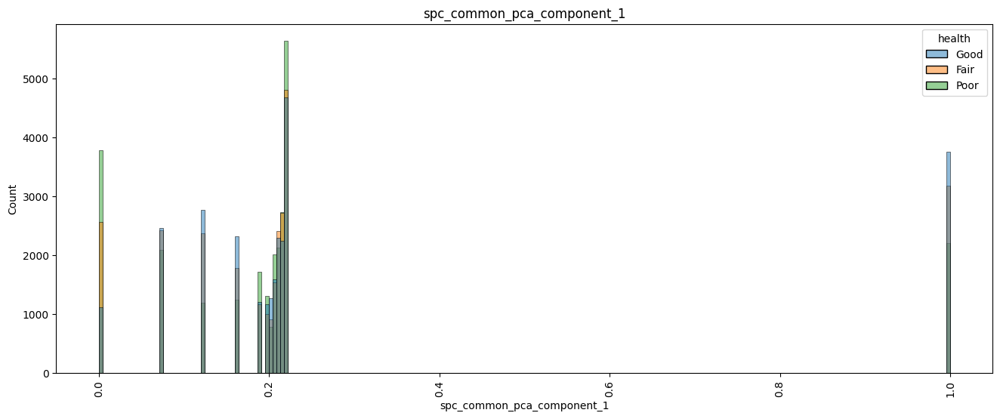

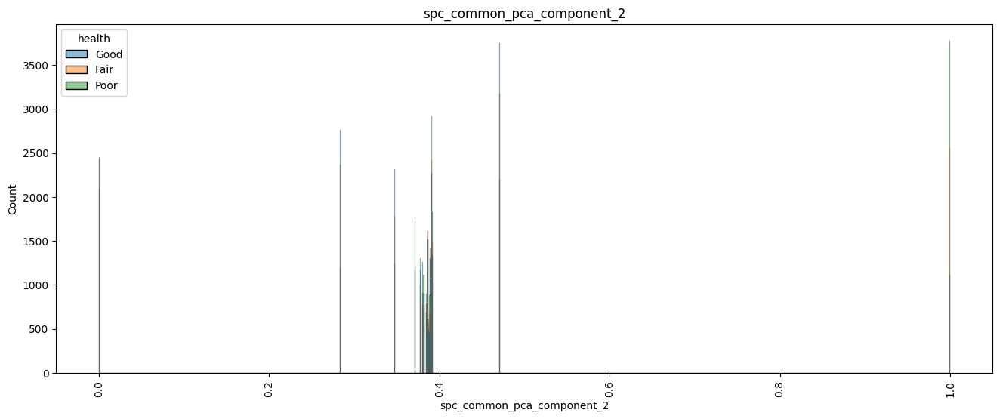

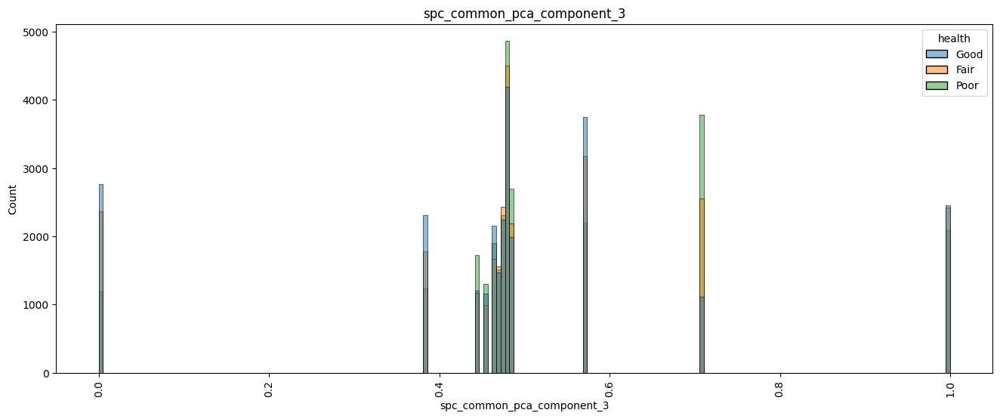

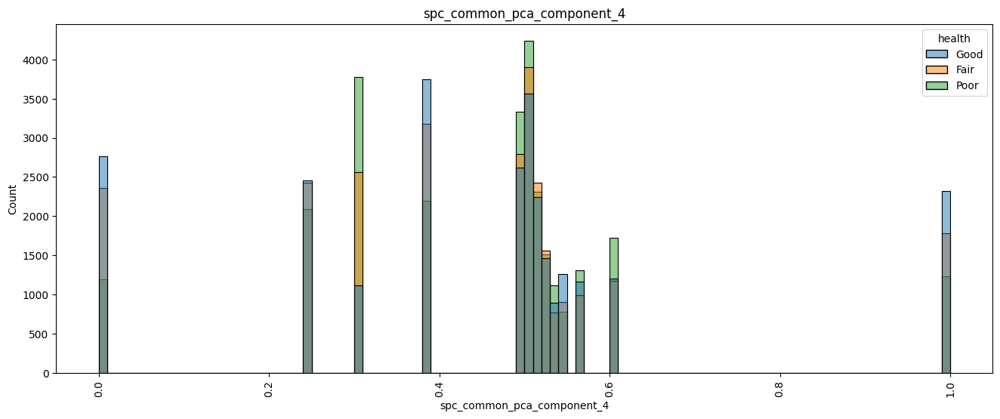

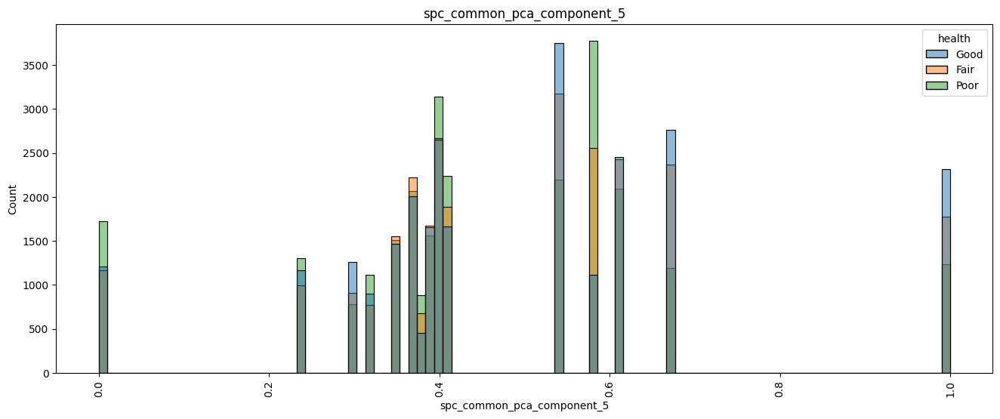

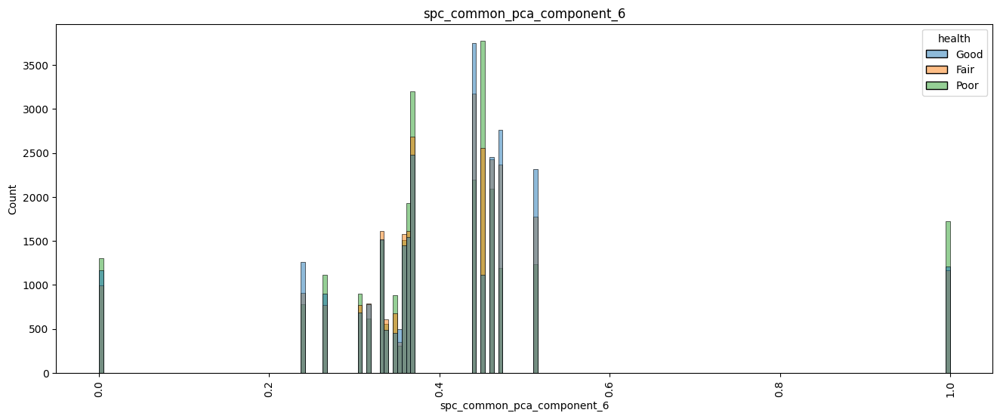

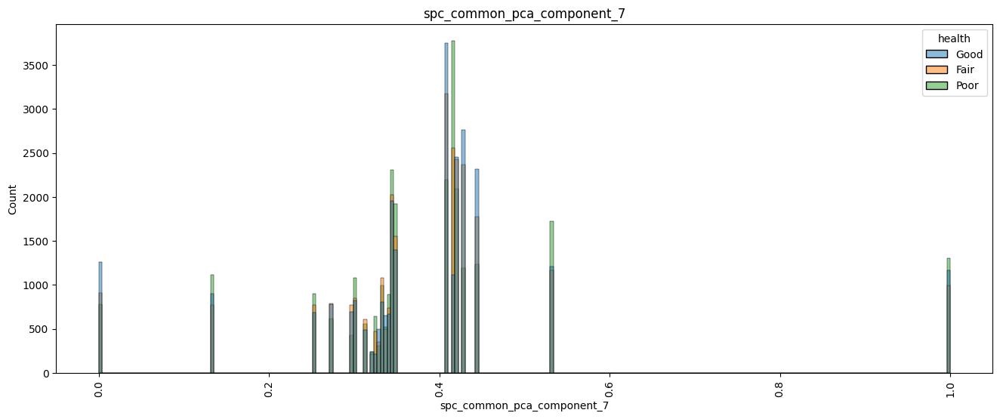

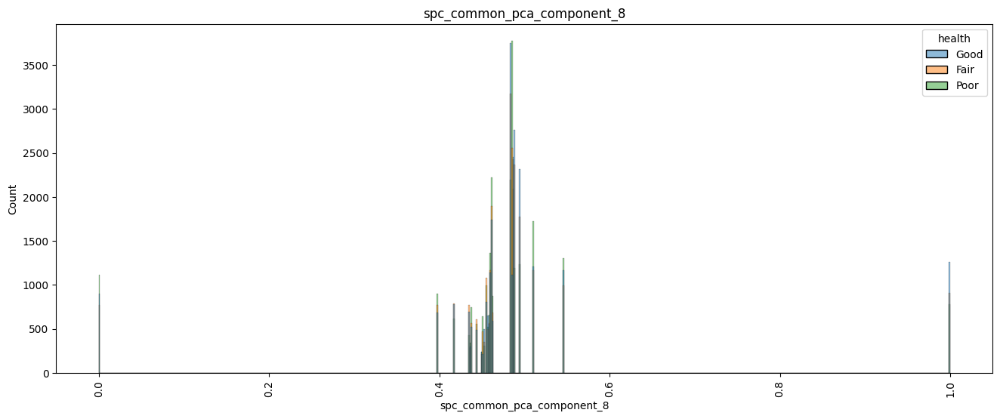

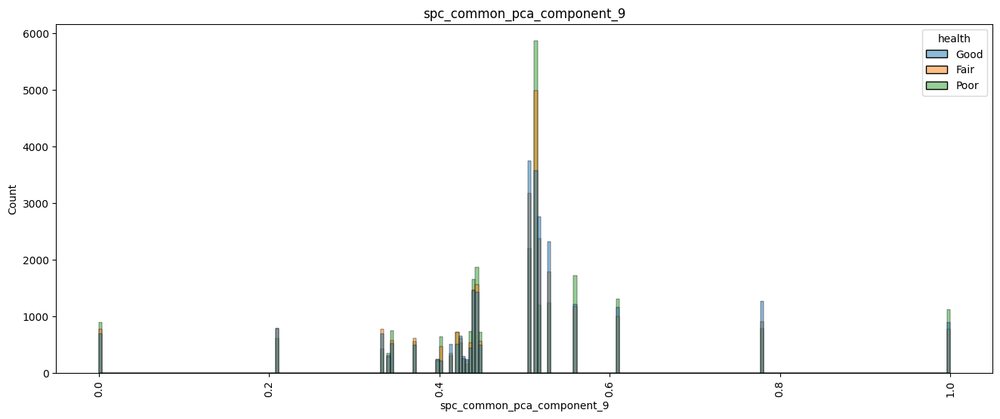

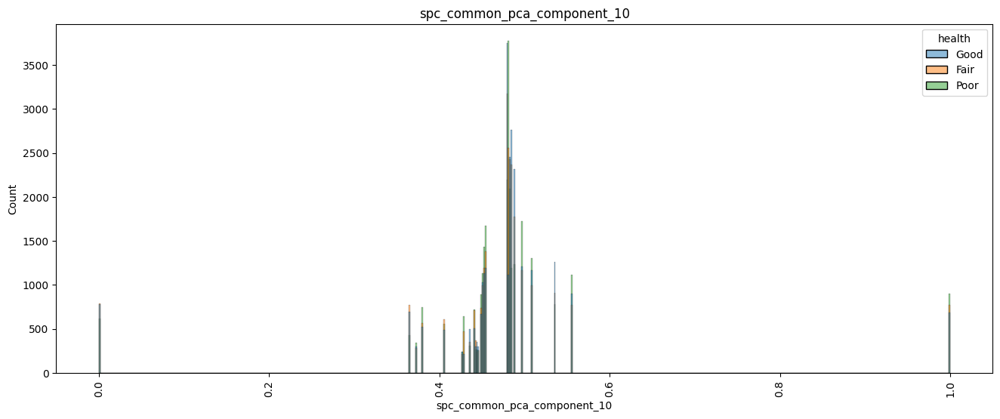

In [106]:
for i in range(len(data_transformed_test.columns) - 1):
    hist_of_target(data_transformed_test, 'health', data_transformed_test.columns[i], 'Count', data_transformed_test.columns[i])

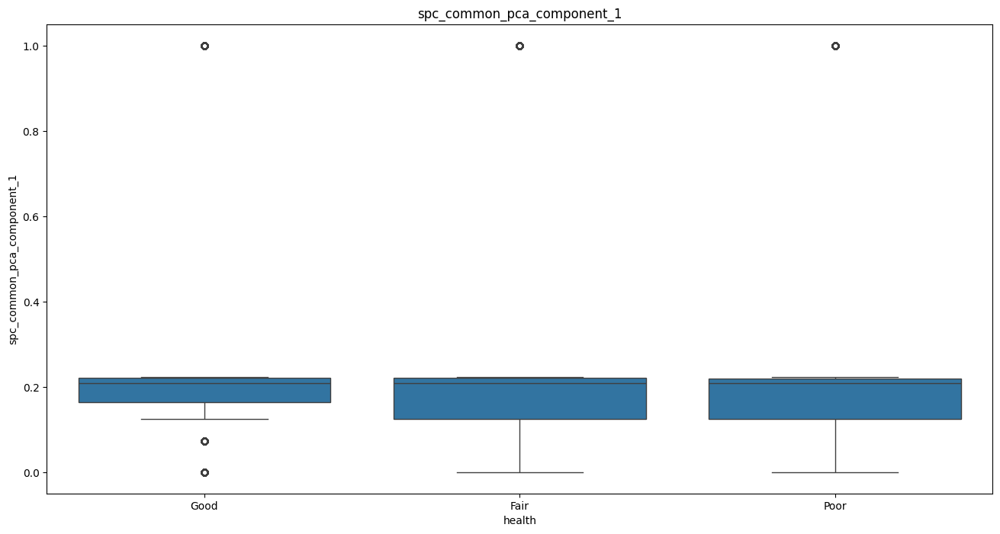

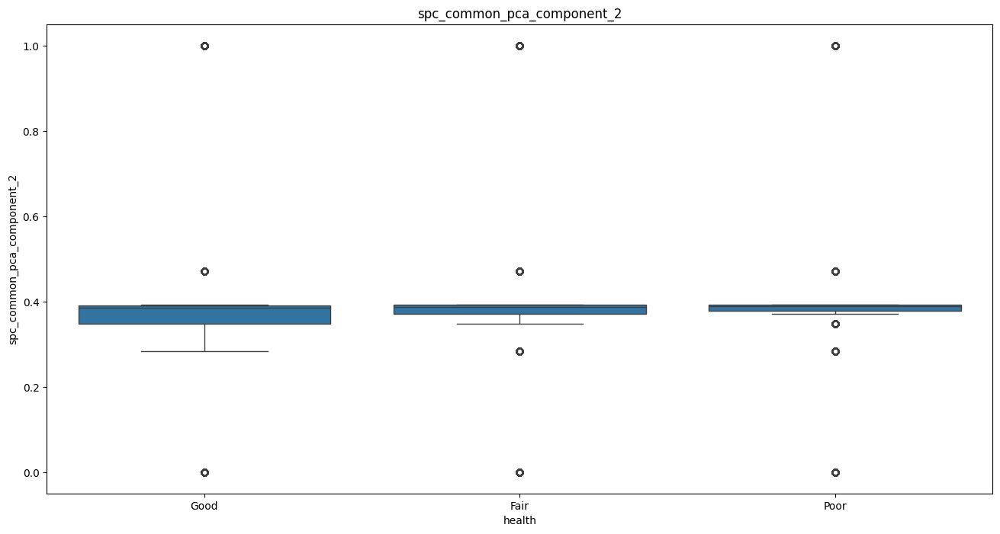

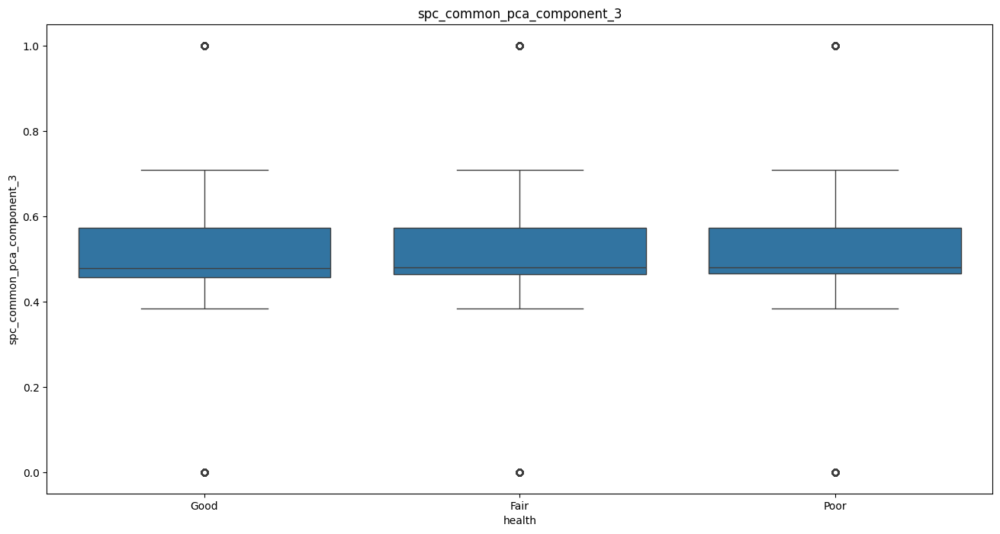

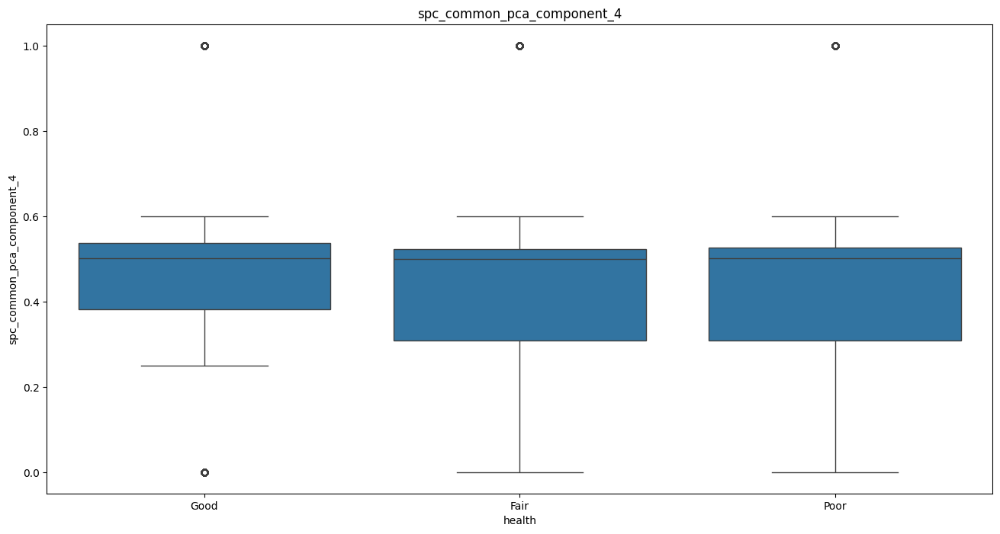

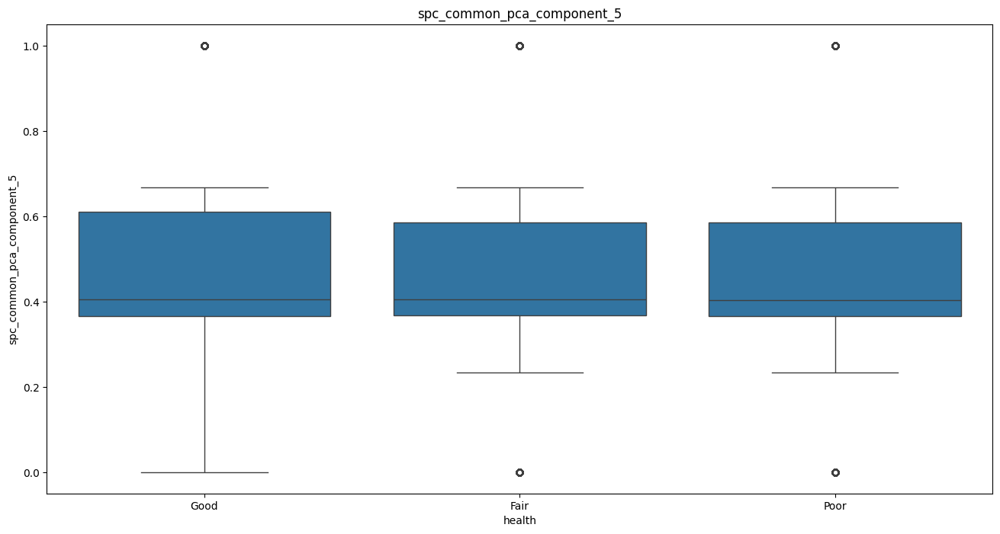

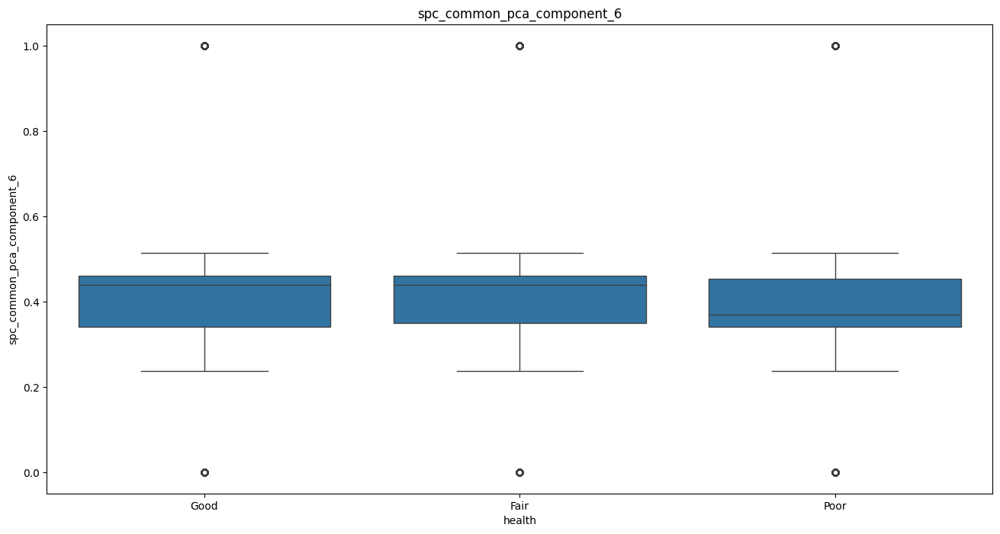

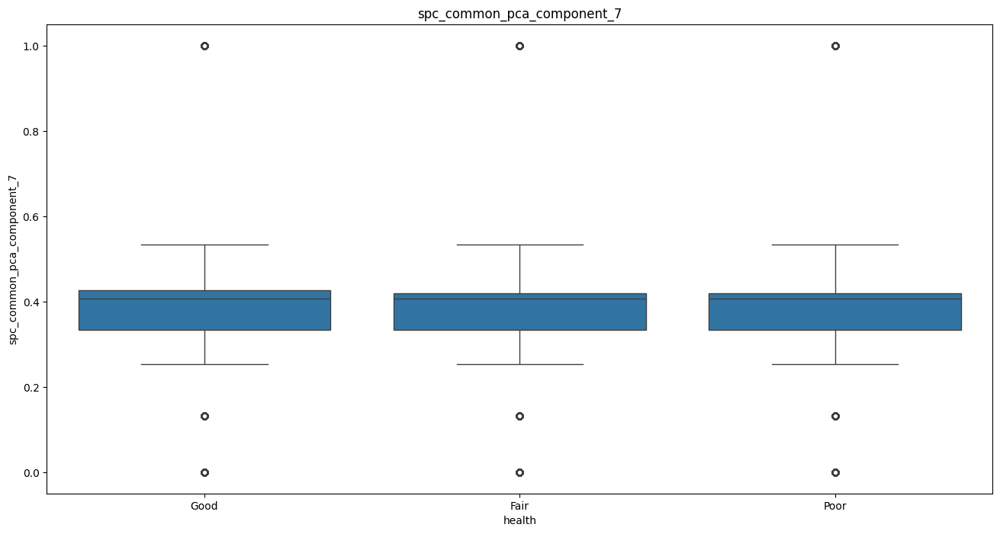

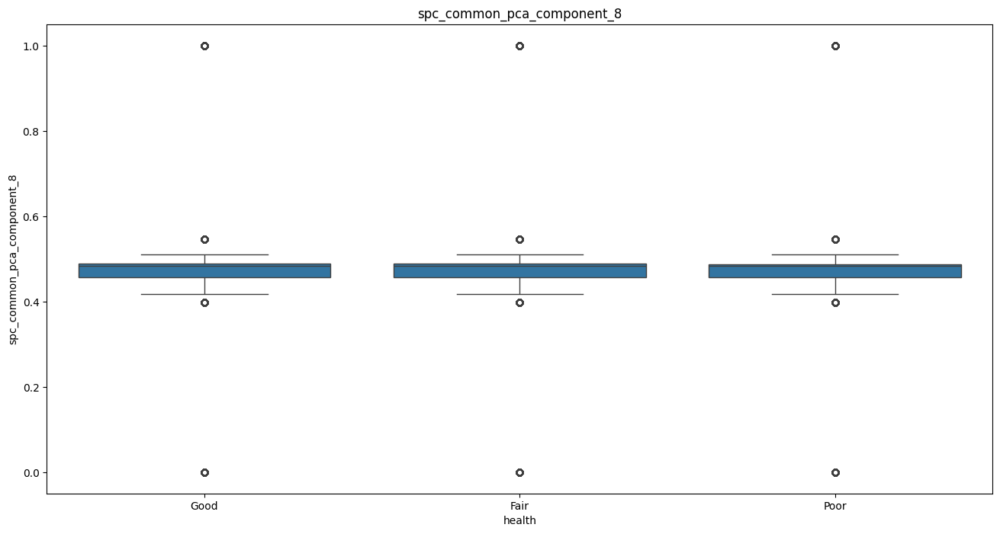

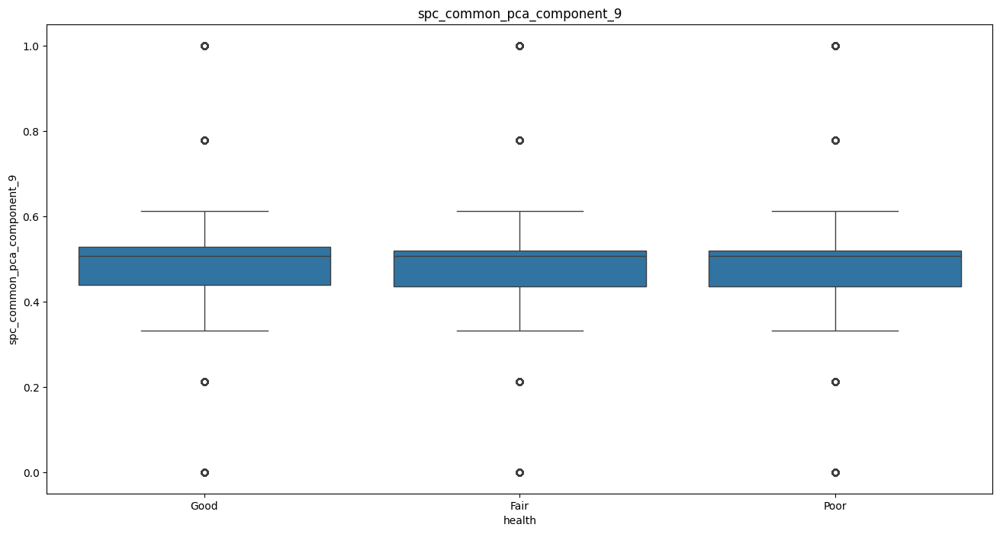

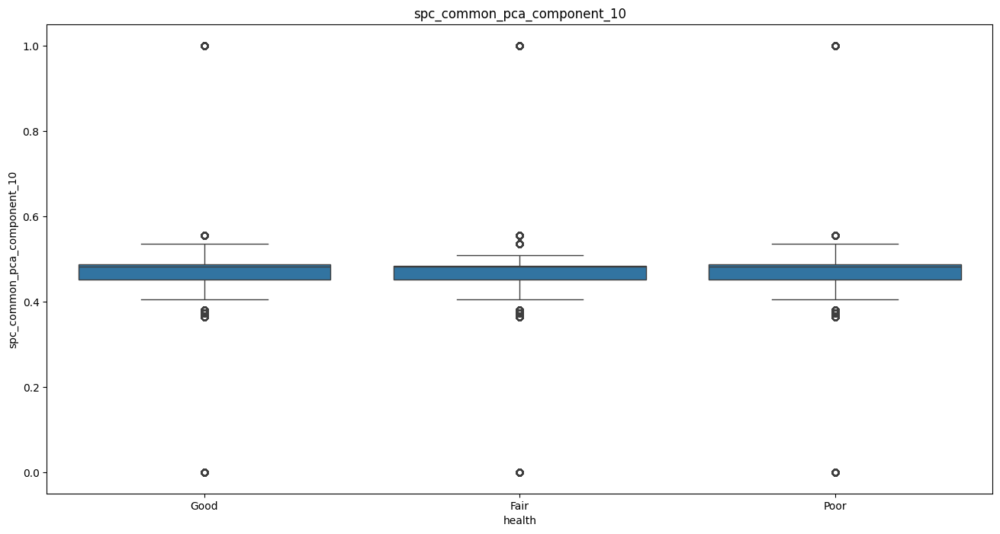

In [107]:
for i in range(len(data_transformed_test.columns) - 1):
    plot_two_variables(data_transformed_test, 'health', data_transformed_test.columns[i], data_transformed_test.columns[i])

In [108]:
data_transformed_test.groupby('health').mean()

,spc_common_pca_component_1,spc_common_pca_component_2,spc_common_pca_component_3,spc_common_pca_component_4,spc_common_pca_component_5,spc_common_pca_component_6,spc_common_pca_component_7,spc_common_pca_component_8,spc_common_pca_component_9,spc_common_pca_component_10
health,,,,,,,,,,
Fair,0.261344,0.408104,0.506908,0.446353,0.481389,0.410700,0.384787,0.477531,0.484176,0.471070
Good,0.286752,0.373908,0.487736,0.457483,0.487866,0.409107,0.385214,0.483821,0.495450,0.472426
Poor,0.229091,0.442769,0.529278,0.459841,0.447579,0.411361,0.389697,0.469287,0.488939,0.477378


Данные 10 компонент можно использовать для дальнейшего анализа. Предполагаю, что после этапа Feature Selection не все попадут в итоговую модель.

In [109]:
data = pd.merge(data, data_transformed_normed, left_index=True, right_index=True)

#### **Итого**

10 компонент, полученных в результате связки "Bag of Words + PCA" можно использовать в качестве потенциальных предикторов.
Также из исходного поля "spc_common" для Топ-10 самых частотных значений использовать преобразование "one-hot encoding".

### **steward**

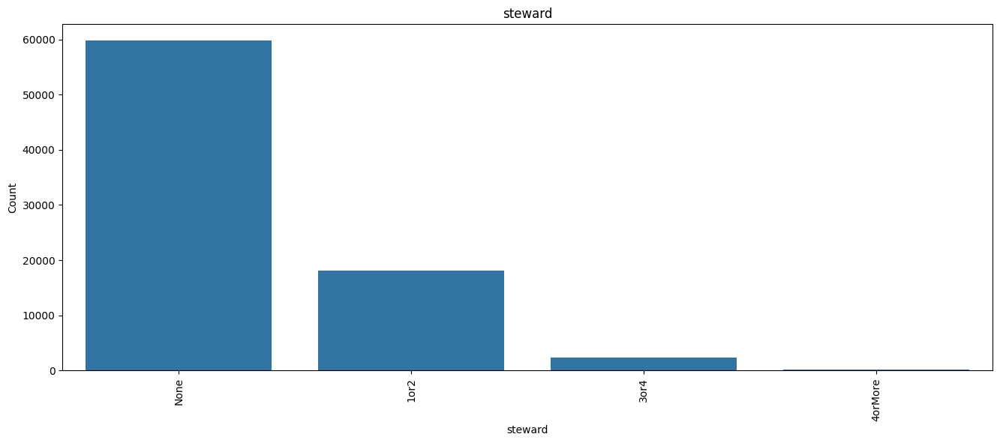

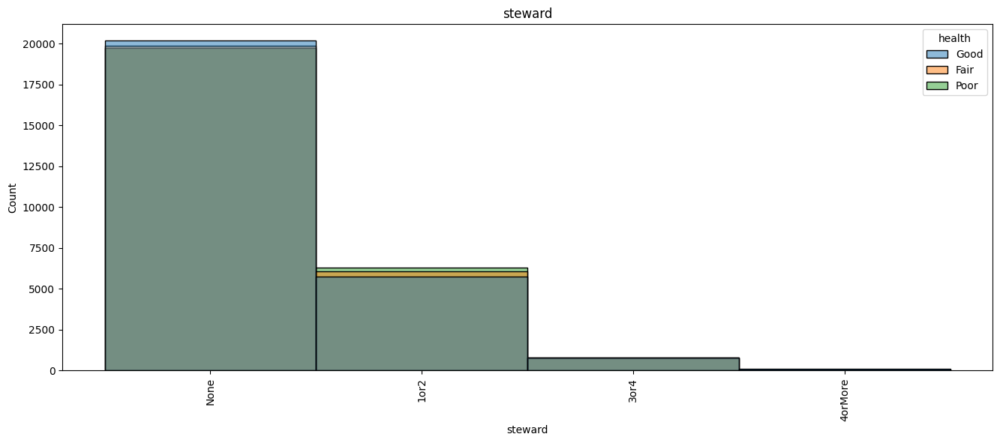

In [110]:
target = 'health'
variable = 'steward'

hist(data, variable, variable, 'Count', variable)
hist_of_target(data, target, variable, 'Count', variable)

Хорошо разделяет по классам значение "4orMore", однако оно и наименее частотное из всех:

In [111]:
groupby_two_variables(data, variable, target).sort_values('Good_share')

Средние значения поля "steward", агрегированные по полю "health": 


health,Fair,Good,Poor,Total,Fair_share,Good_share,Poor_share
steward,,,,,,,
1or2,6084,5751,6283,18118,33.579865,31.741914,34.678221
None,19873,20178,19737,59788,33.239112,33.749247,33.011641
3or4,812,798,747,2357,34.450573,33.856597,31.692830
4orMore,49,91,49,189,25.925926,48.148148,25.925926


Для данного поля подойдет преобразование методом "one-hot encoding" для трех самых частотных значений:

In [112]:
steward_most_frequent = [x for x in data.steward.value_counts().sort_values(ascending = False).head(3).index]
for value in steward_most_frequent:
    colum_name = 'has_' + str(value) + '_steward'
    data[colum_name] = np.where(data['steward'] == value, 1, 0)

Данные три поля будут использованы для последующего анализа.

### **guards**

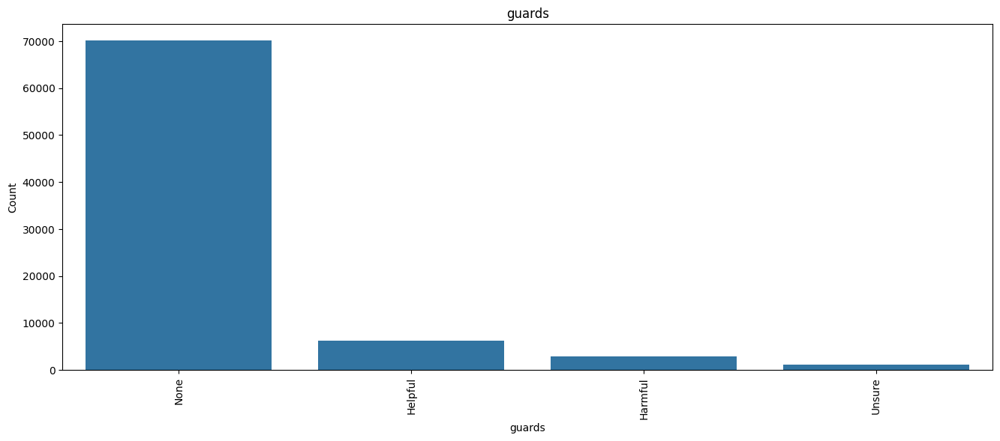

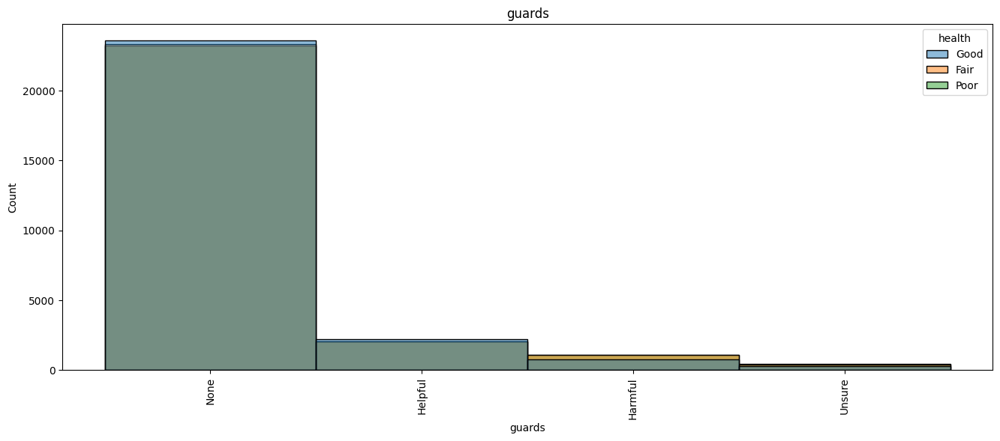

In [113]:
target = 'health'
variable = 'guards'

hist(data, variable, variable, 'Count', variable)
hist_of_target(data, target, variable, 'Count', variable)

Значения "Harmful" и "Unsure" имеют меньшую долю хороших деревьев, что вполне логично:

In [114]:
groupby_two_variables(data, variable, target).sort_values('Total', ascending = False)

Средние значения поля "guards", агрегированные по полю "health": 


health,Fair,Good,Poor,Total,Fair_share,Good_share,Poor_share
guards,,,,,,,
None,23341,23591,23203,70135,33.280103,33.636558,33.083339
Helpful,2026,2198,2062,6286,32.230353,34.966592,32.803054
Harmful,1055,749,1091,2895,36.442142,25.872193,37.685665
Unsure,396,280,460,1136,34.859155,24.647887,40.492958


Для даного поля также стоит использовать преобразование методом "one-hot encoding" для трех самых частотных значений:

In [115]:
guards_most_frequent = [x for x in data.guards.value_counts().sort_values(ascending = False).head(3).index]
for value in guards_most_frequent:
    colum_name = 'has_' + str(value) + '_guards'
    data[colum_name] = np.where(data['guards'] == value, 1, 0)

Данные три поля будут использованы для последующего анализа.

### **curb_loc**

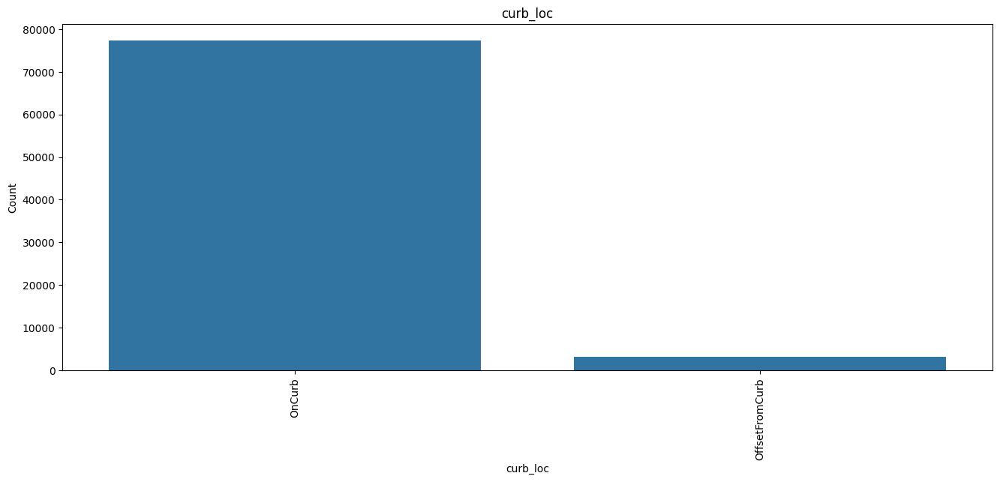

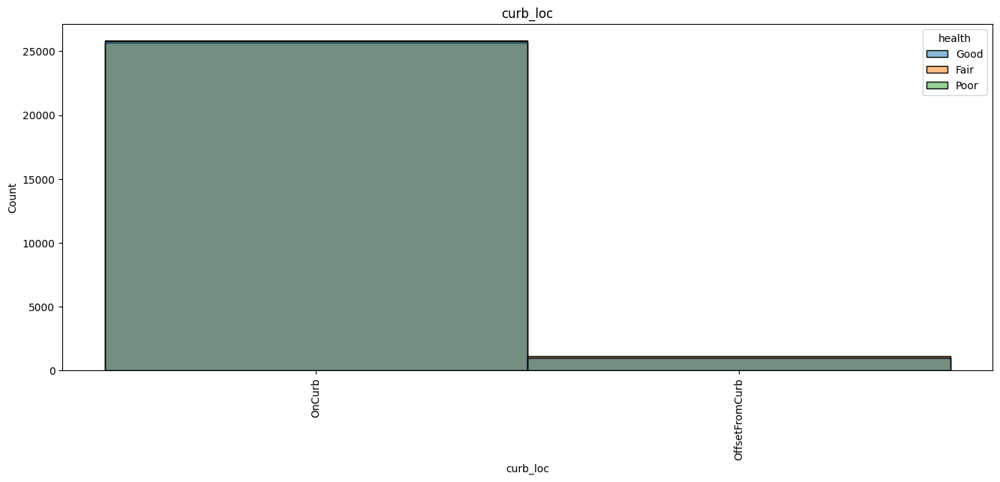

In [227]:
target = 'health'
variable = 'curb_loc'

hist(data, variable, variable, 'Count', variable)
hist_of_target(data, target, variable, 'Count', variable)

В целом, значения немного разделяют классы "Fair" и "Poor"

In [228]:
groupby_two_variables(data, variable, target).sort_values('Total', ascending = False)

Средние значения поля "curb_loc", агрегированные по полю "health": 


health,Fair,Good,Poor,Total,Fair_share,Good_share,Poor_share
curb_loc,,,,,,,
OnCurb,25693,25798,25850,77341,33.220413,33.356176,33.423411
OffsetFromCurb,1125,1020,963,3108,36.196911,32.818533,30.984556


Данное поле будет использовано в последующем анализе.

In [229]:
data_dummies = pd.get_dummies(data[['curb_loc']], dtype = int, drop_first = True)
data = pd.concat([data, data_dummies], axis = 1)

### **sidewalk**

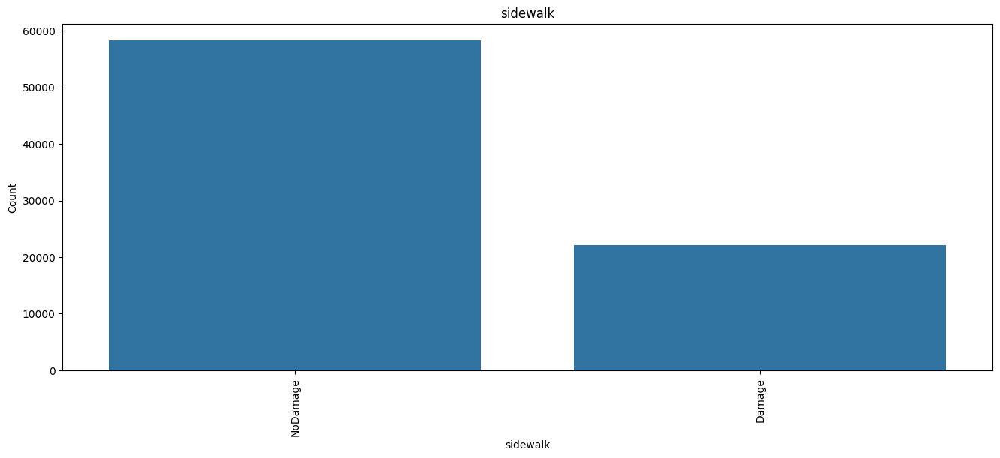

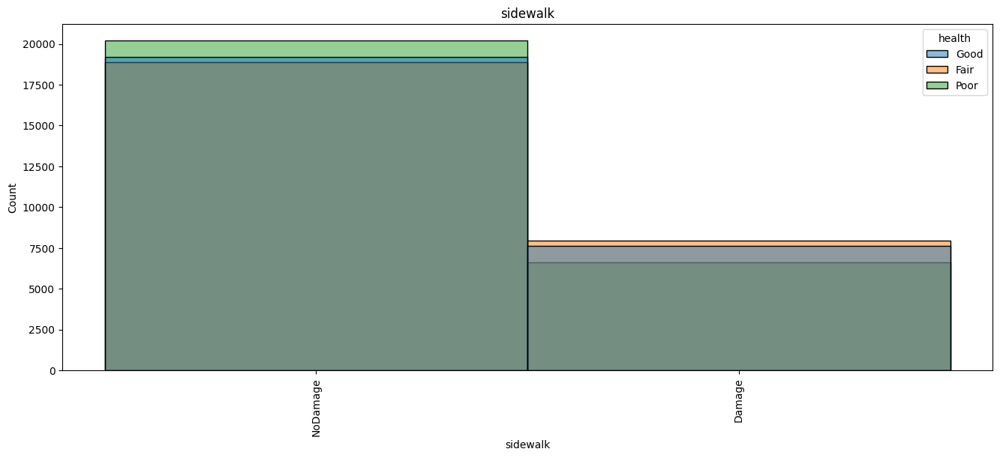

In [116]:
target = 'health'
variable = 'sidewalk'

hist(data, variable, variable, 'Count', variable)
hist_of_target(data, target, variable, 'Count', variable)

В целом, поле не слишком хорошо разделяет классы, но есть некоторые отличия в доле плохих деревьев:

In [117]:
groupby_two_variables(data, variable, target).sort_values('Total', ascending = False)

Средние значения поля "sidewalk", агрегированные по полю "health": 


health,Fair,Good,Poor,Total,Fair_share,Good_share,Poor_share
sidewalk,,,,,,,
NoDamage,18881,19193,20212,58286,32.393714,32.929005,34.677281
Damage,7937,7625,6604,22166,35.807092,34.399531,29.793377


In [118]:
data_dummies = pd.get_dummies(data['sidewalk'], dtype = int, drop_first = True)
data = pd.concat([data, data_dummies], axis = 1)

Данное поле будет использовано для последующего анализа.

### **user_type**

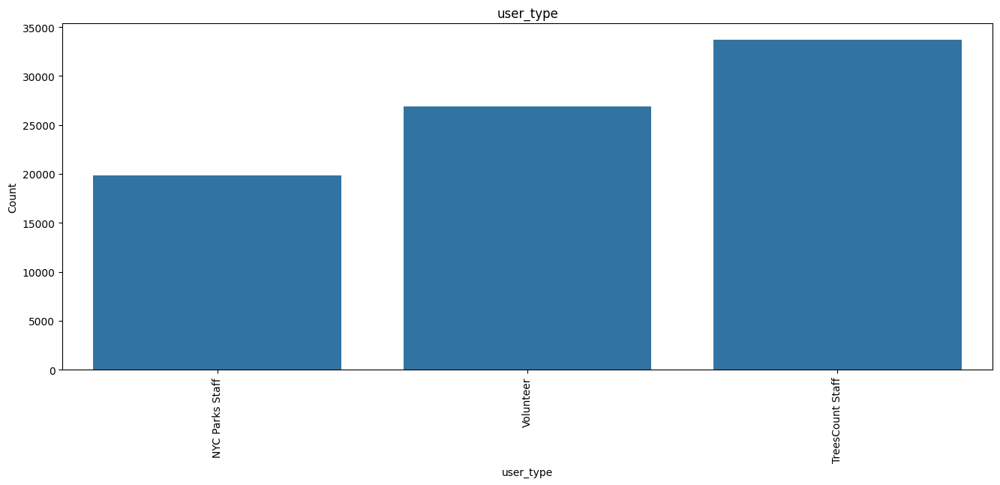

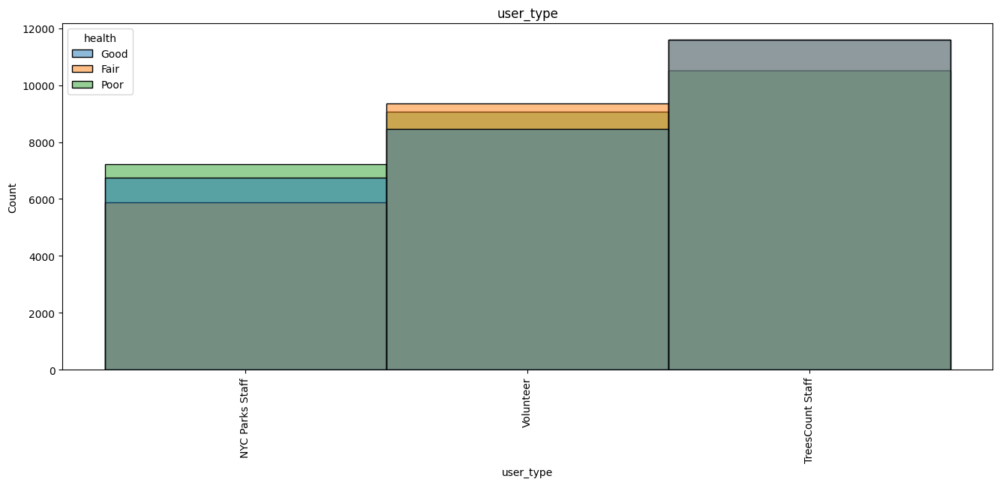

In [119]:
target = 'health'
variable = 'user_type'

hist(data, variable, variable, 'Count', variable)
hist_of_target(data, target, variable, 'Count', variable)

Неплохое разделение для хороших и плохих деревьев демонстирует значение "NYC Parks Staff":

In [120]:
groupby_two_variables(data, variable, target).sort_values('Total', ascending = False)

Средние значения поля "user_type", агрегированные по полю "health": 


health,Fair,Good,Poor,Total,Fair_share,Good_share,Poor_share
user_type,,,,,,,
TreesCount Staff,11589,11596,10520,33705,34.383623,34.404391,31.211986
Volunteer,9360,8471,9066,26897,34.799420,31.494219,33.706361
NYC Parks Staff,5869,6751,7230,19850,29.566751,34.010076,36.423174


Для даного поля также стоит использовать преобразование методом "one-hot encoding" для двух самых частотных значений:

In [309]:
user_type_most_frequent = [x for x in data.user_type.value_counts().sort_values(ascending = False).head(2).index]
for value in user_type_most_frequent:
    colum_name = 'has_' + str(value) + '_user_type'
    data[colum_name] = np.where(data['user_type'] == value, 1, 0)

Данные два поля будут использованы для последующего анализа.

### **problems**

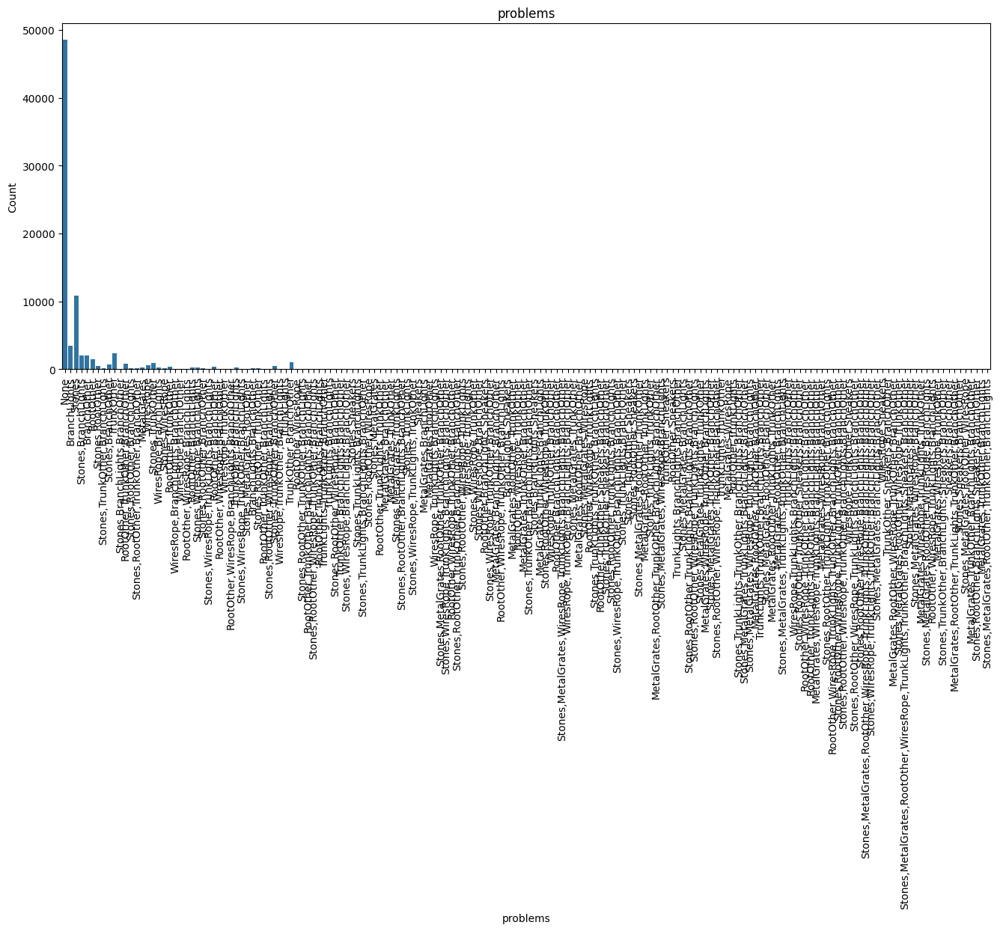

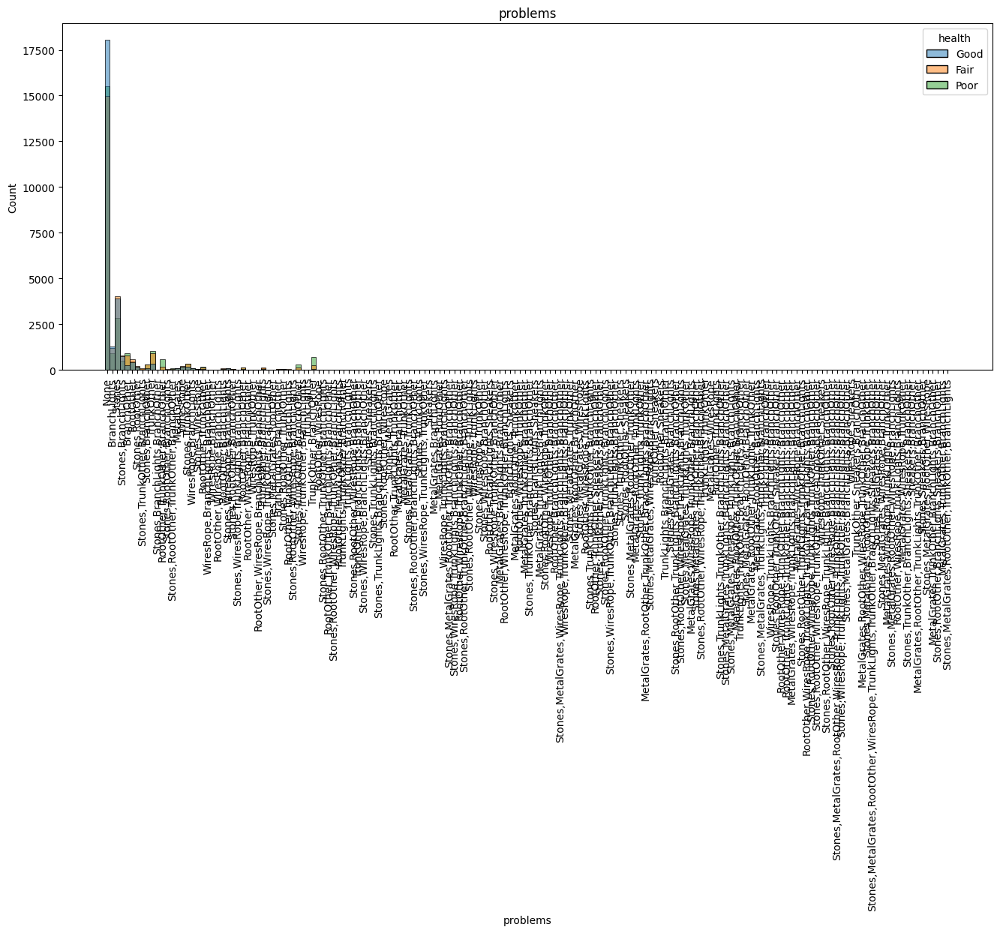

In [122]:
target = 'health'
variable = 'problems'

hist(data, variable, variable, 'Count', variable)
hist_of_target(data, target, variable, 'Count', variable)

Выглядит так, что данное поле имеет перечисление проблем через запятую:

In [123]:
data.problems.value_counts().head(40)

problems
None                                          48508
Stones                                        10813
BranchLights                                   3444
TrunkOther                                     2320
Stones,BranchLights                            2040
BranchOther                                    1998
RootOther                                      1508
TrunkOther,BranchOther                         1032
Stones,TrunkOther                               888
RootOther,TrunkOther,BranchOther                772
Stones,BranchOther                              702
WiresRope                                       564
Stones,RootOther                                530
Stones,TrunkOther,BranchOther                   483
RootOther,TrunkOther                            386
RootOther,BranchOther                           336
MetalGrates                                     318
TrunkOther,BranchLights                         304
WiresRope,BranchLights                          299
Roo

Причем разбивка по проблем дает хорошее разделение:

In [124]:
groupby_two_variables(data, variable, target).sort_values('Total', ascending = False).head(40)

Средние значения поля "problems", агрегированные по полю "health": 


health,Fair,Good,Poor,Total,Fair_share,Good_share,Poor_share
problems,,,,,,,
None,14966.0,18034.0,15508.0,48508.0,30.852643,37.177373,31.969984
Stones,4035.0,3916.0,2862.0,10813.0,37.316193,36.215666,26.468140
BranchLights,1223.0,1283.0,938.0,3444.0,35.511034,37.253194,27.235772
TrunkOther,920.0,351.0,1049.0,2320.0,39.655172,15.129310,45.215517
"Stones,BranchLights",798.0,738.0,504.0,2040.0,39.117647,36.176471,24.705882
BranchOther,812.0,245.0,941.0,1998.0,40.640641,12.262262,47.097097
RootOther,592.0,430.0,486.0,1508.0,39.257294,28.514589,32.228117
"TrunkOther,BranchOther",260.0,40.0,732.0,1032.0,25.193798,3.875969,70.930233
"Stones,TrunkOther",359.0,184.0,345.0,888.0,40.427928,20.720721,38.851351


Здесь можно попробовать различные варианты преобразования данного поля:
- Подсчет количества проблем;
- Флаг наличия проблем (1, если есть хотя бы одна проблема, и 0, если их нет);
- Отдельные бинарные поля для проблем(1, если есть данная проблема, и 0, если ее нет);
- Bag of Words + PCA

#### **Подсчет значений**

Подсчет количесвта проблем дает распределение с длинным хвостом, где большинство значение равно нулю (т.е. проблем нет), а на конце хвоста есть несколько малочастотных значений:

In [125]:
data['problems_count'] = data['problems'].str.split(',').str.len()
data['problems_count'] = np.where(data['problems'] == 'None', 0, data['problems_count'])
data['problems_count'].value_counts()

problems_count
0    48508
1    20998
2     7522
3     2707
4      603
5       95
6       17
8        1
9        1
Name: count, dtype: int64

Однако подсчет проблем дает очень неплохое разделение по классам:

In [126]:
groupby_two_variables(data, 'problems_count', target).sort_values('Total', ascending = False)

Средние значения поля "problems_count", агрегированные по полю "health": 


health,Fair,Good,Poor,Total,Fair_share,Good_share,Poor_share
problems_count,,,,,,,
0,14966.0,18034.0,15508.0,48508.0,30.852643,37.177373,31.969984
1,7921.0,6491.0,6586.0,20998.0,37.722640,30.912468,31.364892
2,2838.0,1781.0,2903.0,7522.0,37.729327,23.677214,38.593459
3,871.0,420.0,1416.0,2707.0,32.175840,15.515331,52.308829
4,192.0,86.0,325.0,603.0,31.840796,14.262023,53.897181
5,30.0,5.0,60.0,95.0,31.578947,5.263158,63.157895
6,0.0,1.0,16.0,17.0,0.000000,5.882353,94.117647
8,0.0,0.0,1.0,1.0,0.000000,0.000000,100.000000
9,0.0,0.0,1.0,1.0,0.000000,0.000000,100.000000


Но для 5 и более проблем недостаточное количество образцов чтобы для них держать отдельное значение. Поэтому все данные случаи лучше помечать цифрой 4:

In [127]:
data['problems_count'] = np.where(data['problems_count'] > 4, 4, data['problems_count'])
groupby_two_variables(data, 'problems_count', target).sort_values('Total', ascending = False)

Средние значения поля "problems_count", агрегированные по полю "health": 


health,Fair,Good,Poor,Total,Fair_share,Good_share,Poor_share
problems_count,,,,,,,
0,14966,18034,15508,48508,30.852643,37.177373,31.969984
1,7921,6491,6586,20998,37.722640,30.912468,31.364892
2,2838,1781,2903,7522,37.729327,23.677214,38.593459
3,871,420,1416,2707,32.175840,15.515331,52.308829
4,222,92,403,717,30.962343,12.831241,56.206416


#### **Флаг наличия проблем**

Разбиение по наличию проблем дает неплохое разхделение:

In [128]:
data['has_problem'] = np.where(data['problems_count'] > 0, 1, 0)
data['has_problem'].value_counts()

has_problem
0    48508
1    31944
Name: count, dtype: int64

Также видно, что при наличии хотя бы одной проблемы растет доля плохих и посредственных деревьев:

In [129]:
groupby_two_variables(data, 'has_problem', target).sort_values('Total', ascending = False)

Средние значения поля "has_problem", агрегированные по полю "health": 


health,Fair,Good,Poor,Total,Fair_share,Good_share,Poor_share
has_problem,,,,,,,
0,14966,18034,15508,48508,30.852643,37.177373,31.969984
1,11852,8784,11308,31944,37.102429,27.498122,35.399449


#### **Отдельные поля для проблемы**

Всего есть 10 уникальных значений, из которых 9 олицетворяют реальную проблему и 1 - отсутствие проблем:

In [130]:
data.problems.str.split(',', expand = True).stack().value_counts()

None            48508
Stones          17315
BranchLights     7950
TrunkOther       7514
BranchOther      6499
RootOther        5015
WiresRope        2012
MetalGrates       635
TrunkLights       165
Sneakers           64
Name: count, dtype: int64

Данным кодом можно создать все 9 бинарных полей, олицетворяющих наличие той или иной проблемы (поле с отсутствием проблем уже реализовано чуть выше):

In [131]:
list_of_problems = ['Stones', 'BranchLights', 'TrunkOther', 'BranchOther',
                    'RootOther', 'WiresRope', 'MetalGrates', 'TrunkLights', 'Sneakers']

for value in list_of_problems:
    colum_name = 'has_' + str(value) + '_problem'
    data[colum_name] = np.where(data['problems'].str.contains(','.join([value])), 1, 0)

По таблицам ниже видно следующее:
- "TrunkOther", "BranchOther", "MetalGrates" и "Sneakers" хорошо разделяют деревья плохого качества от деревьев хорошего качества;
- "RootOther", "TrunkLights" неплохо разделяют деревья плохого качества от деревьев хорошего качества;
- "Stones", "BranchLights", "RootOther" неплохо разделяют деревья посредственного качества от остальных;
- Поля "TrunkLights" и "Sneakers" слишком низкочастотные для включения их в модель.

In [132]:
list_of_columns = ['has_Stones_problem', 'has_BranchLights_problem','has_TrunkOther_problem', 'has_BranchOther_problem',
                   'has_RootOther_problem', 'has_WiresRope_problem', 'has_MetalGrates_problem', 'has_TrunkLights_problem',
                   'has_Sneakers_problem']

for col_name in list_of_columns:
    display(groupby_two_variables(data, col_name, 'health').sort_values('Total', ascending = False))

Средние значения поля "has_Stones_problem", агрегированные по полю "health": 


health,Fair,Good,Poor,Total,Fair_share,Good_share,Poor_share
has_Stones_problem,,,,,,,
0,20282,21226,21629,63137,32.123794,33.618956,34.257250
1,6536,5592,5187,17315,37.747618,32.295697,29.956685


Средние значения поля "has_BranchLights_problem", агрегированные по полю "health": 


health,Fair,Good,Poor,Total,Fair_share,Good_share,Poor_share
has_BranchLights_problem,,,,,,,
0,23831,24225,24446,72502,32.869438,33.412871,33.717691
1,2987,2593,2370,7950,37.572327,32.616352,29.811321


Средние значения поля "has_TrunkOther_problem", агрегированные по полю "health": 


health,Fair,Good,Poor,Total,Fair_share,Good_share,Poor_share
has_TrunkOther_problem,,,,,,,
0,24225,25817,22896,72938,33.213140,35.395816,31.391044
1,2593,1001,3920,7514,34.508917,13.321799,52.169284


Средние значения поля "has_BranchOther_problem", агрегированные по полю "health": 


health,Fair,Good,Poor,Total,Fair_share,Good_share,Poor_share
has_BranchOther_problem,,,,,,,
0,24651,26144,23158,73953,33.333333,35.352183,31.314484
1,2167,674,3658,6499,33.343591,10.370826,56.285582


Средние значения поля "has_RootOther_problem", агрегированные по полю "health": 


health,Fair,Good,Poor,Total,Fair_share,Good_share,Poor_share
has_RootOther_problem,,,,,,,
0,25009,25730,24698,75437,33.152167,34.107931,32.739902
1,1809,1088,2118,5015,36.071785,21.694915,42.233300


Средние значения поля "has_WiresRope_problem", агрегированные по полю "health": 


health,Fair,Good,Poor,Total,Fair_share,Good_share,Poor_share
has_WiresRope_problem,,,,,,,
0,26101,26275,26064,78440,33.275115,33.496940,33.227945
1,717,543,752,2012,35.636183,26.988072,37.375746


Средние значения поля "has_MetalGrates_problem", агрегированные по полю "health": 


health,Fair,Good,Poor,Total,Fair_share,Good_share,Poor_share
has_MetalGrates_problem,,,,,,,
0,26575,26681,26561,79817,33.294912,33.427716,33.277372
1,243,137,255,635,38.267717,21.574803,40.157480


Средние значения поля "has_TrunkLights_problem", агрегированные по полю "health": 


health,Fair,Good,Poor,Total,Fair_share,Good_share,Poor_share
has_TrunkLights_problem,,,,,,,
0,26762,26770,26755,80287,33.332918,33.342882,33.324199
1,56,48,61,165,33.939394,29.090909,36.969697


Средние значения поля "has_Sneakers_problem", агрегированные по полю "health": 


health,Fair,Good,Poor,Total,Fair_share,Good_share,Poor_share
has_Sneakers_problem,,,,,,,
0,26798,26806,26784,80388,33.335821,33.345773,33.318406
1,20,12,32,64,31.250000,18.750000,50.000000


Поэтому для дальнейшего анализа будут отобраны бинарные поля на базе значений "BranchOther", "MetalGrates", "RootOther", "Stones", "BranchLights"

In [133]:
list_to_drop = ['has_TrunkLights_problem', 'has_Sneakers_problem']
data.drop(columns = list_to_drop, inplace = True)

#### **Bag of Words + PCA**

Для данного поля можно выполнить аналогичную связку "Bag of Words + PCA", что и для поля "spc_common".

In [134]:
token_pattern='(?u)[a-zA-Z][a-z ]+'

pca, variance, data_transformed, vec, bow = vectorize_and_pca(data, 'problems', (1, 1), token_pattern, 5)

Пример векторизованных слов:

In [135]:
list(vec.vocabulary_.items())[:100]

[('none', 3),
 ('branchlights', 0),
 ('stones', 6),
 ('branchother', 1),
 ('rootother', 4),
 ('trunkother', 8),
 ('metalgrates', 2),
 ('wiresrope', 9),
 ('trunklights', 7),
 ('sneakers', 5)]

Данные пять компонент способны объяснять около 92% всей вариации, причем первая компонента - 49.71%:

In [136]:
variance

,component,variance
0,1,0.497116
1,2,0.166961
2,3,0.120884
3,4,0.069976
4,5,0.065192


In [137]:
scaler = MinMaxScaler().fit(data_transformed)
data_transformed_normed = pd.DataFrame(scaler.fit_transform(data_transformed.values), columns = data_transformed.columns, index = data_transformed.index)

data_transformed_test = pd.merge(data_transformed_normed, data['health'], left_index=True, right_index=True)

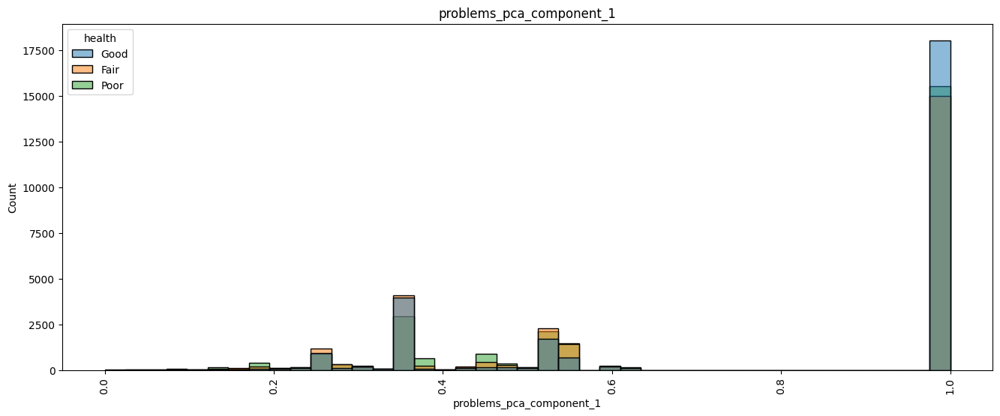

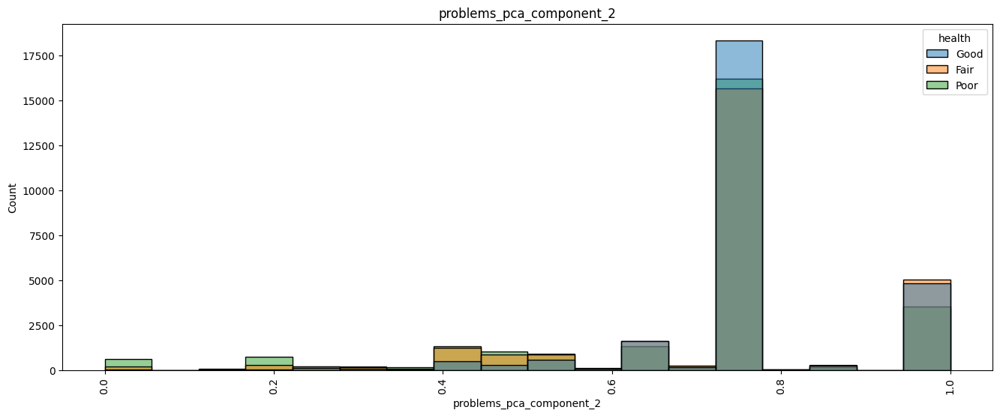

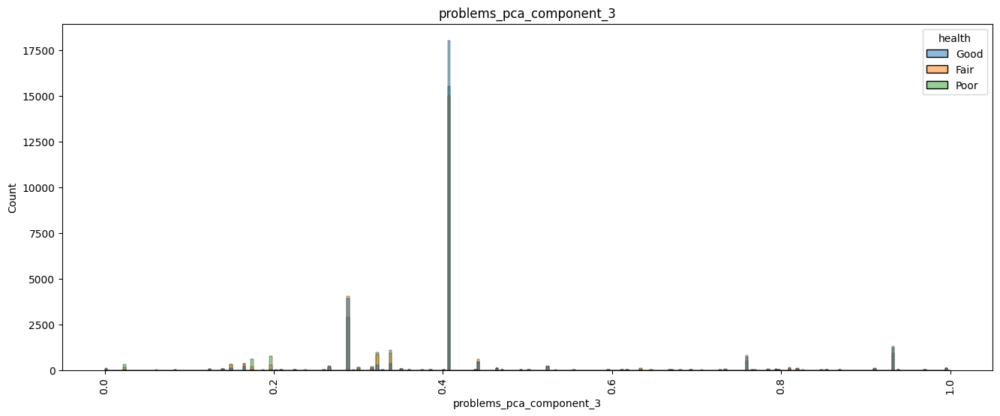

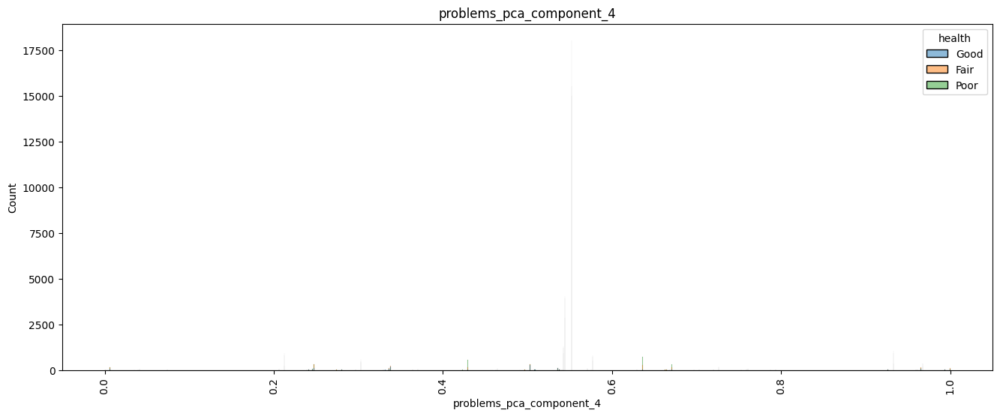

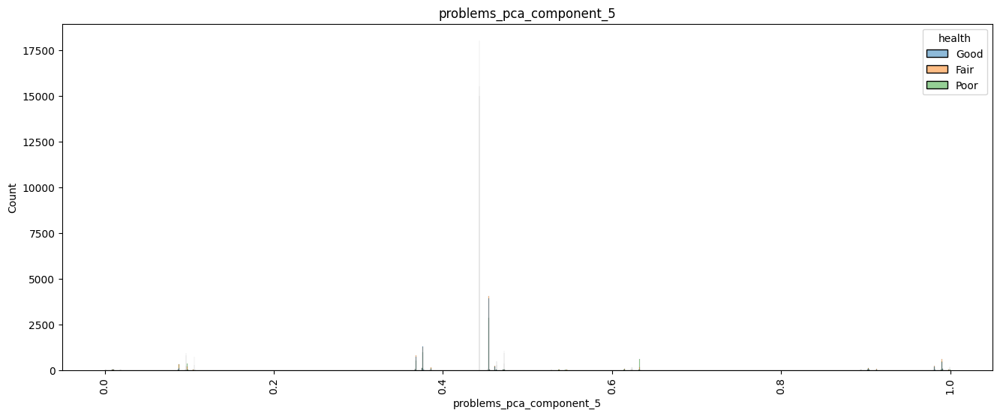

In [138]:
for i in range(len(data_transformed_test.columns) - 1):
    hist_of_target(data_transformed_test, 'health', data_transformed_test.columns[i], 'Count', data_transformed_test.columns[i])

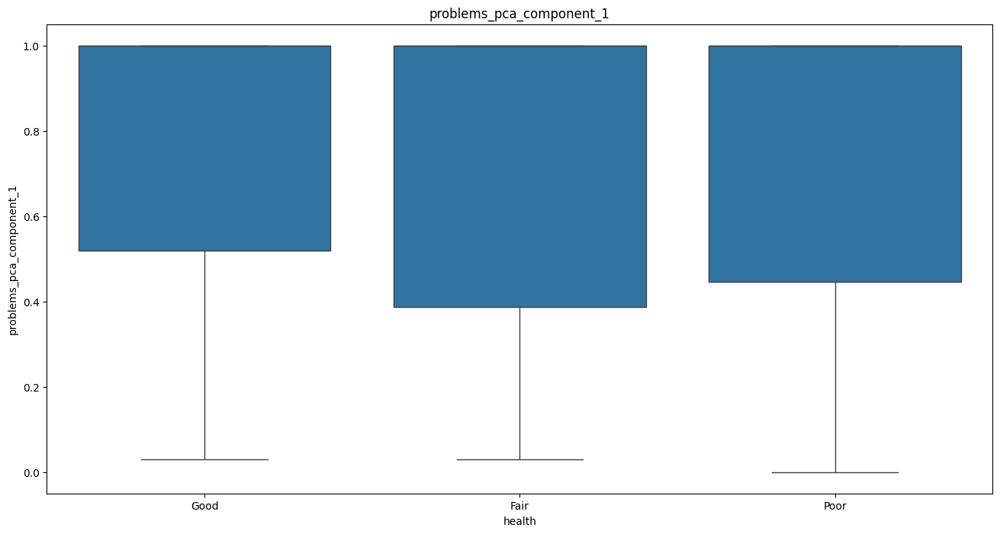

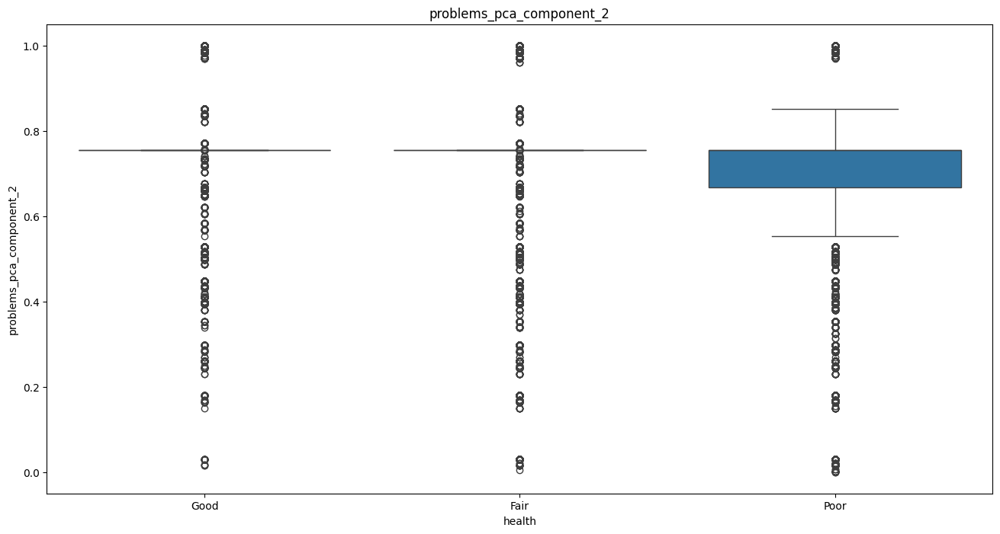

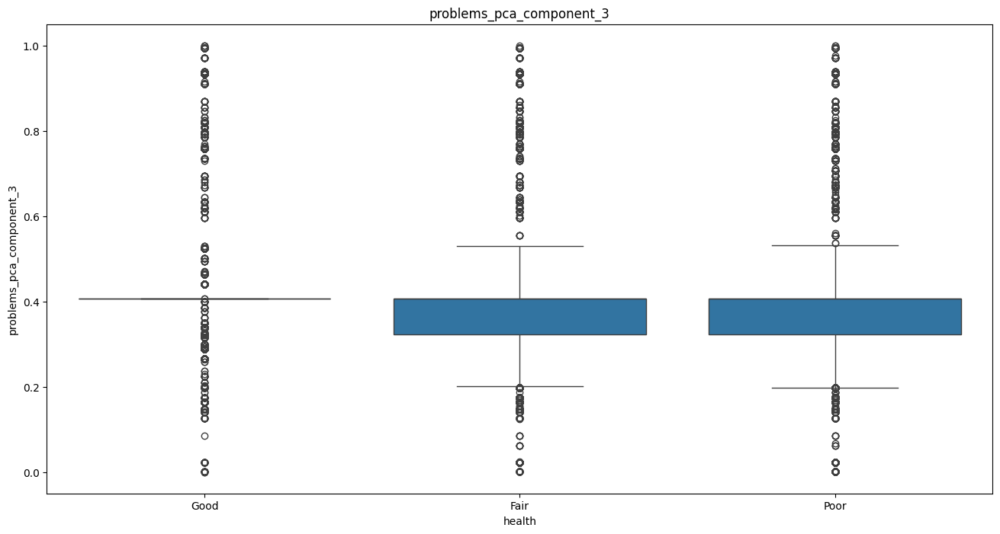

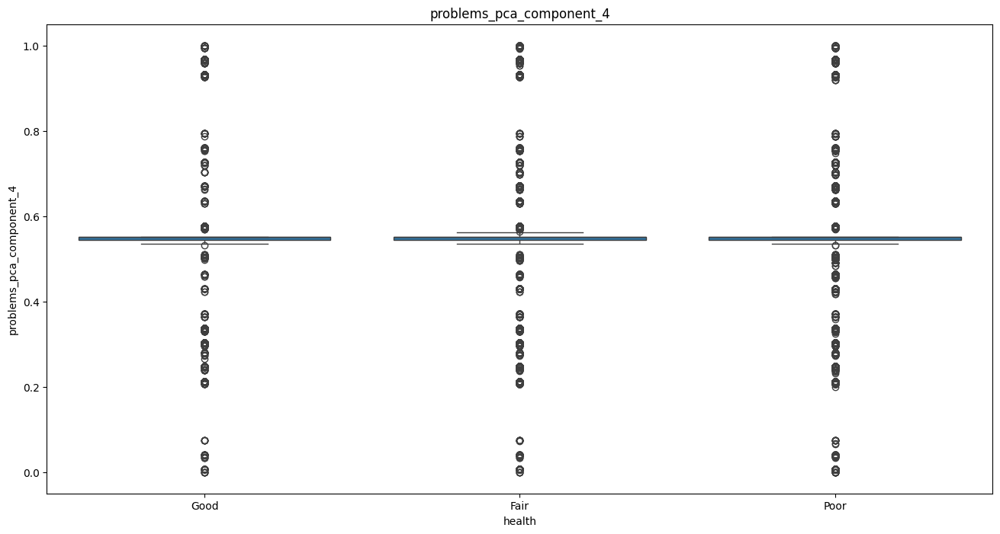

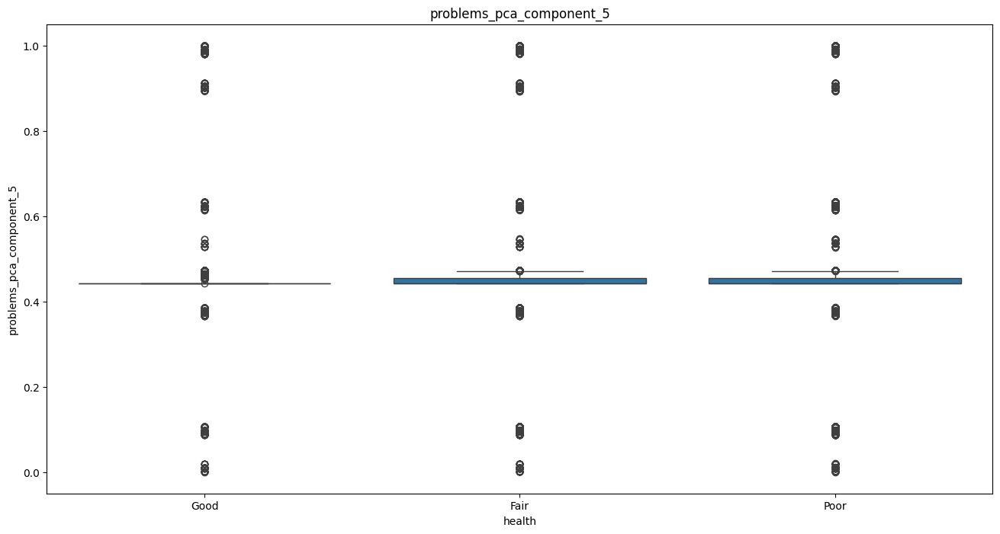

In [139]:
for i in range(len(data_transformed_test.columns) - 1):
    plot_two_variables(data_transformed_test, 'health', data_transformed_test.columns[i], data_transformed_test.columns[i])

In [140]:
data_transformed_test.groupby('health').mean()

,problems_pca_component_1,problems_pca_component_2,problems_pca_component_3,problems_pca_component_4,problems_pca_component_5
health,,,,,
Fair,0.737039,0.742394,0.418164,0.548059,0.446842
Good,0.803009,0.772960,0.426347,0.548235,0.451817
Poor,0.750345,0.700330,0.400803,0.548475,0.435024


Данные 5 компонент будут использованы для последующего анализа. Вполне возможно, что после этапа Feature Selection многие из них будут отброшены.

In [141]:
data = pd.merge(data, data_transformed_normed, left_index=True, right_index=True)

#### **Итого**

Само оригинальное поле "problems" нельзя использовать в качестве предиктора для ML/AI моделей, однако на базе данного поля были сформированы следующие поля:
- Поле с подсчетом количества проблем;
- Бинарное поле с флагом наличия проблем или их отсутствие;
- 7 бинарных полей для самых значимых проблем;
- 5 компонент, полученных путем связки "Bag of Words + PCA"

### **root_stone, root_grate, root_other**

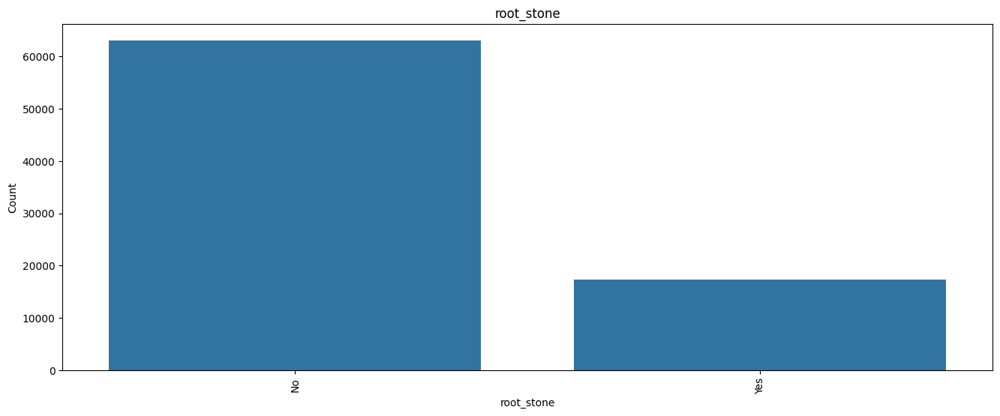

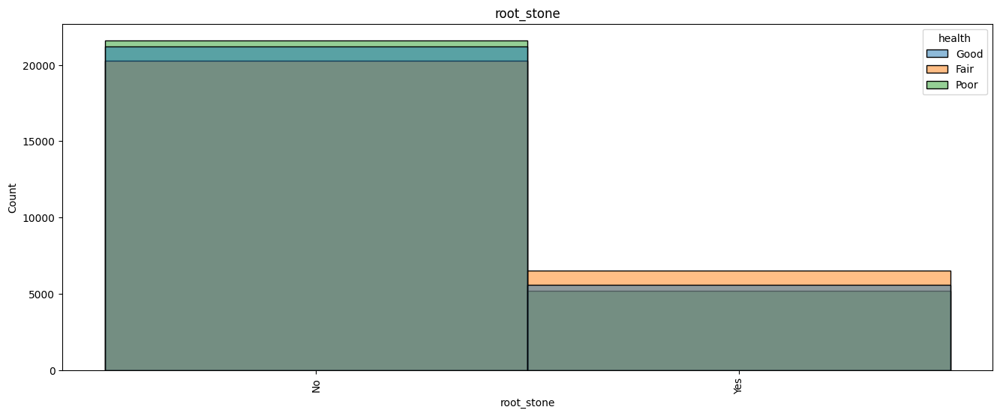

In [142]:
target = 'health'
variable = 'root_stone'

hist(data, variable, variable, 'Count', variable)
hist_of_target(data, target, variable, 'Count', variable)

In [143]:
groupby_two_variables(data, variable, target).sort_values('Total', ascending = False)

Средние значения поля "root_stone", агрегированные по полю "health": 


health,Fair,Good,Poor,Total,Fair_share,Good_share,Poor_share
root_stone,,,,,,,
No,20282,21226,21628,63136,32.124303,33.619488,34.256209
Yes,6536,5592,5187,17315,37.747618,32.295697,29.956685


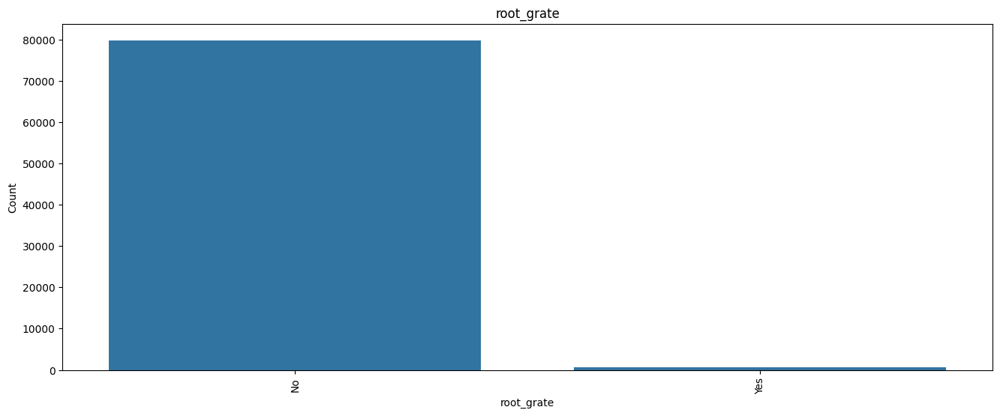

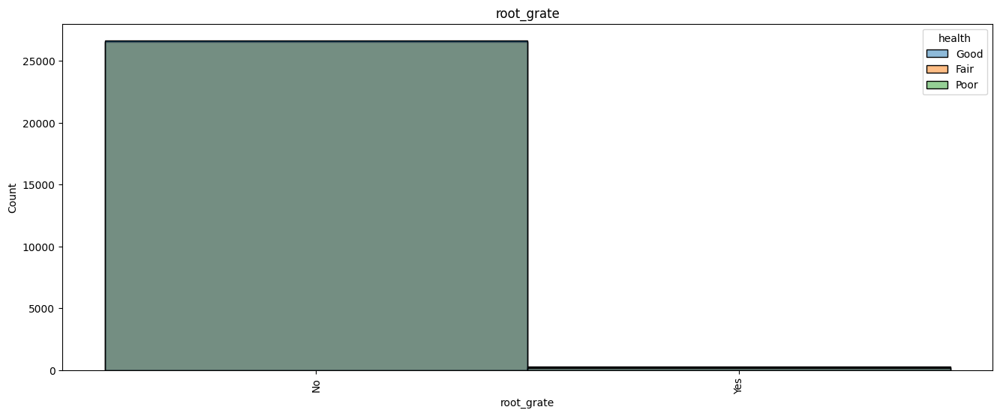

In [144]:
target = 'health'
variable = 'root_grate'

hist(data, variable, variable, 'Count', variable)
hist_of_target(data, target, variable, 'Count', variable)

In [145]:
groupby_two_variables(data, variable, target).sort_values('Total', ascending = False)

Средние значения поля "root_grate", агрегированные по полю "health": 


health,Fair,Good,Poor,Total,Fair_share,Good_share,Poor_share
root_grate,,,,,,,
No,26575,26681,26560,79816,33.295329,33.428135,33.276536
Yes,243,137,255,635,38.267717,21.574803,40.157480


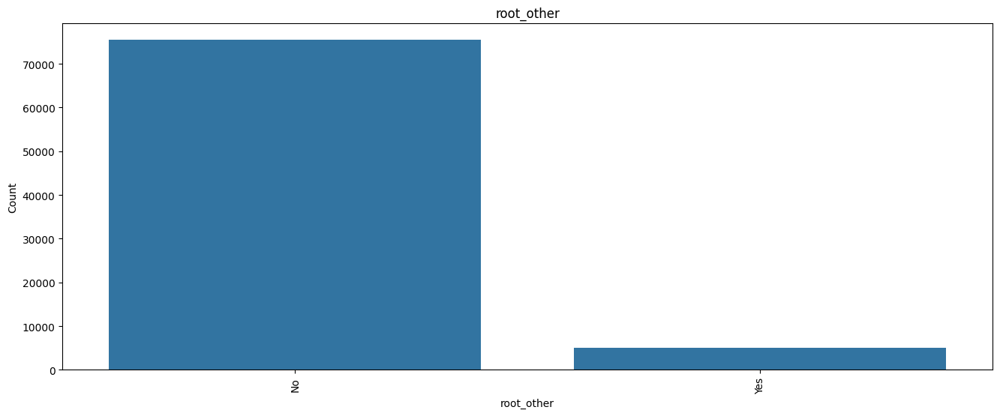

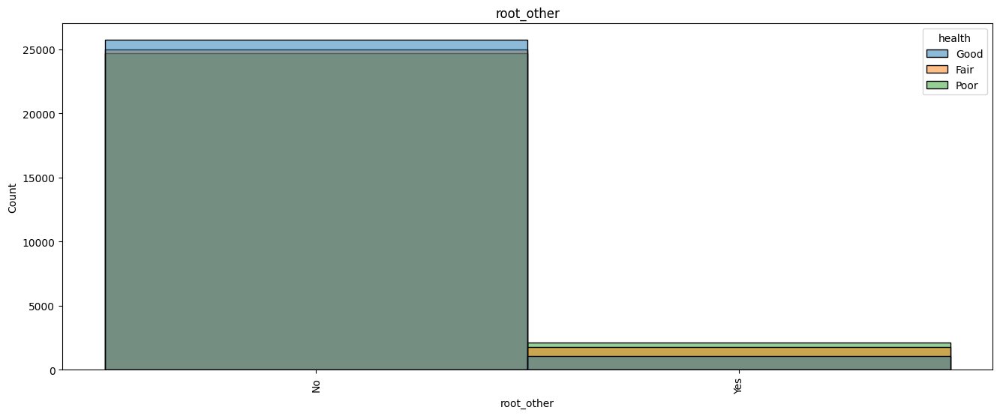

In [146]:
target = 'health'
variable = 'root_other'

hist(data, variable, variable, 'Count', variable)
hist_of_target(data, target, variable, 'Count', variable)

In [147]:
groupby_two_variables(data, variable, target).sort_values('Total', ascending = False)

Средние значения поля "root_other", агрегированные по полю "health": 


health,Fair,Good,Poor,Total,Fair_share,Good_share,Poor_share
root_other,,,,,,,
No,25009,25730,24698,75437,33.152167,34.107931,32.739902
Yes,1809,1088,2117,5014,36.078979,21.699242,42.221779


Данные поля можно использовать в качестве потенциальных предикторов, предварительно преобразовав в диапазон 0/1.

In [148]:
data_dummies = pd.get_dummies(data[['root_stone', 'root_grate', 'root_other']], dtype = int, drop_first = True)
data = pd.concat([data, data_dummies], axis = 1)

### **trunk_wire, trnk_light, trnk_other**

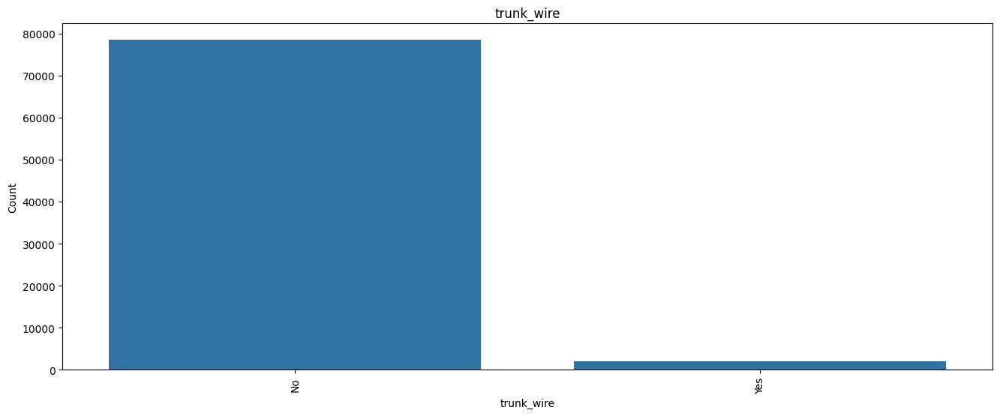

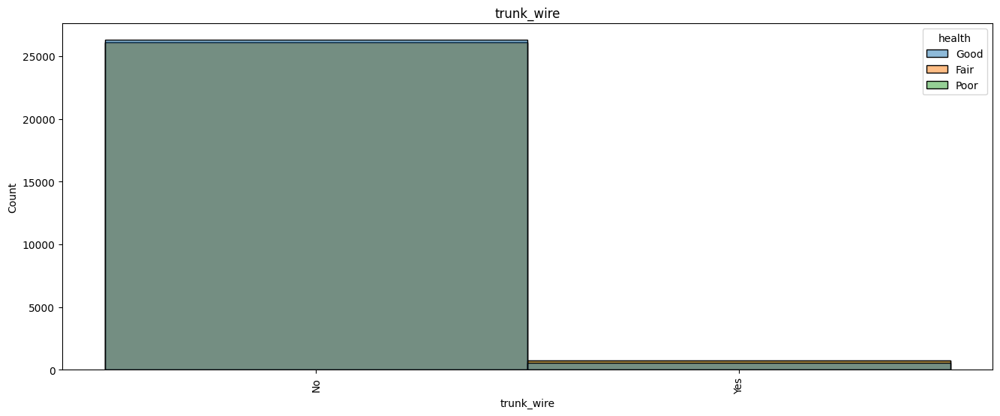

In [149]:
target = 'health'
variable = 'trunk_wire'

hist(data, variable, variable, 'Count', variable)
hist_of_target(data, target, variable, 'Count', variable)

In [150]:
groupby_two_variables(data, variable, target).sort_values('Total', ascending = False)

Средние значения поля "trunk_wire", агрегированные по полю "health": 


health,Fair,Good,Poor,Total,Fair_share,Good_share,Poor_share
trunk_wire,,,,,,,
No,26101,26275,26063,78439,33.275539,33.497367,33.227094
Yes,717,543,752,2012,35.636183,26.988072,37.375746


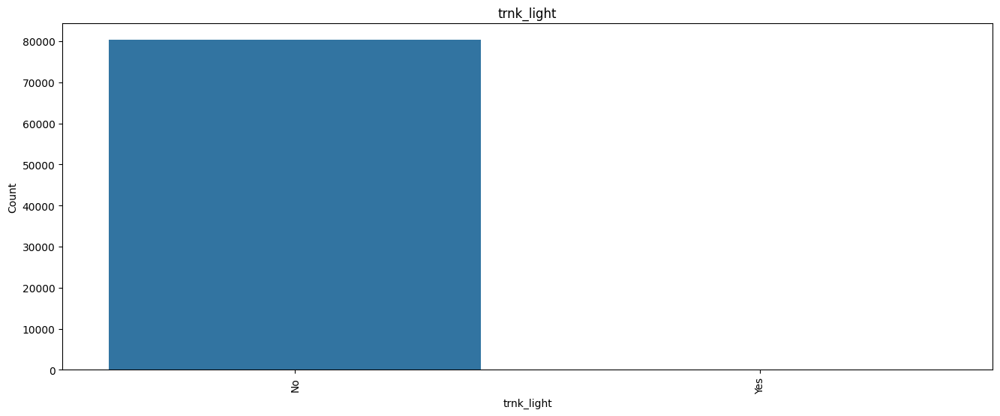

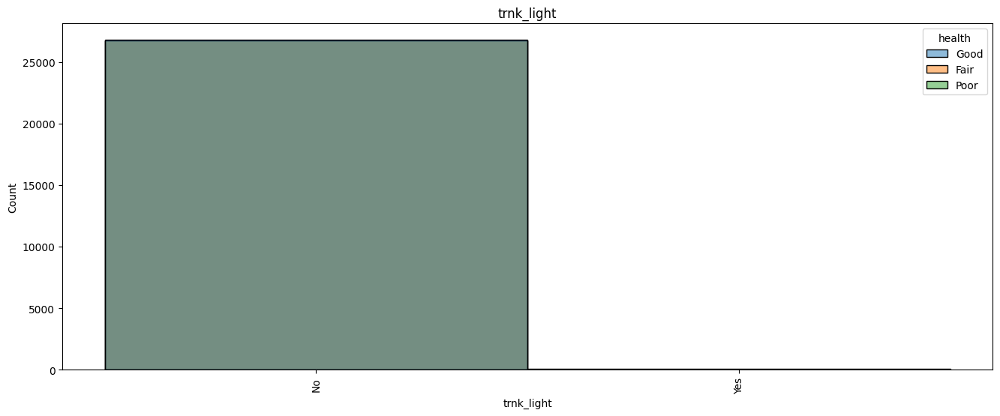

In [151]:
target = 'health'
variable = 'trnk_light'

hist(data, variable, variable, 'Count', variable)
hist_of_target(data, target, variable, 'Count', variable)

In [152]:
groupby_two_variables(data, variable, target).sort_values('Total', ascending = False)

Средние значения поля "trnk_light", агрегированные по полю "health": 


health,Fair,Good,Poor,Total,Fair_share,Good_share,Poor_share
trnk_light,,,,,,,
No,26762,26770,26754,80286,33.333333,33.343298,33.323369
Yes,56,48,61,165,33.939394,29.090909,36.969697


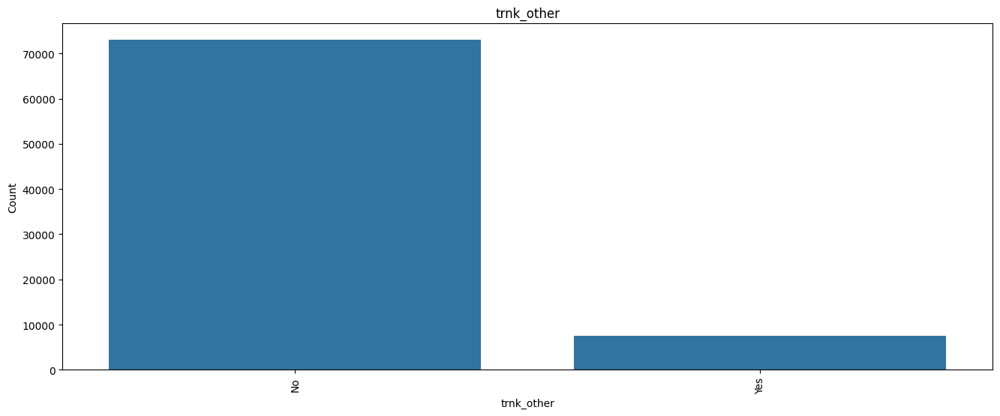

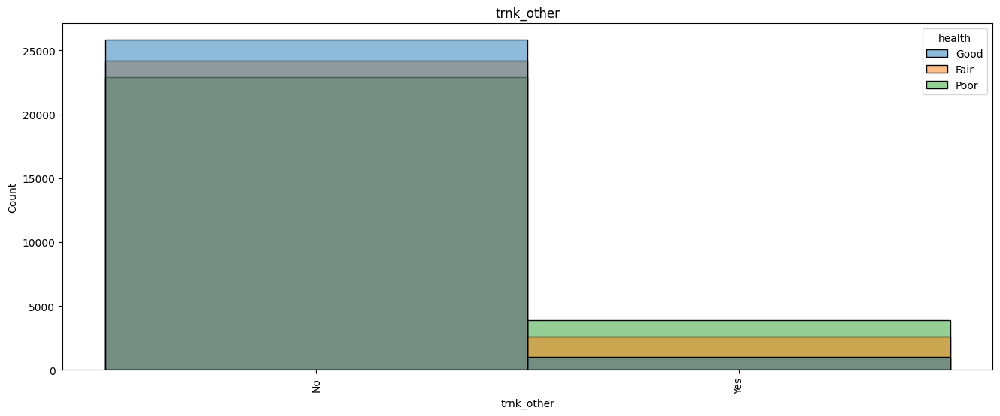

In [153]:
target = 'health'
variable = 'trnk_other'

hist(data, variable, variable, 'Count', variable)
hist_of_target(data, target, variable, 'Count', variable)

In [154]:
groupby_two_variables(data, variable, target).sort_values('Total', ascending = False)

Средние значения поля "trnk_other", агрегированные по полю "health": 


health,Fair,Good,Poor,Total,Fair_share,Good_share,Poor_share
trnk_other,,,,,,,
No,24225,25817,22896,72938,33.21314,35.395816,31.391044
Yes,2593,1001,3919,7513,34.51351,13.323572,52.162918


Данные поля можно использовать в качестве потенциальных предикторов, предварительно преобразовав в диапазон 0/1.

In [155]:
data_dummies = pd.get_dummies(data[['trunk_wire', 'trnk_light', 'trnk_other']], dtype = int, drop_first = True)
data = pd.concat([data, data_dummies], axis = 1)

### **brch_light, brch_shoe, brch_other**

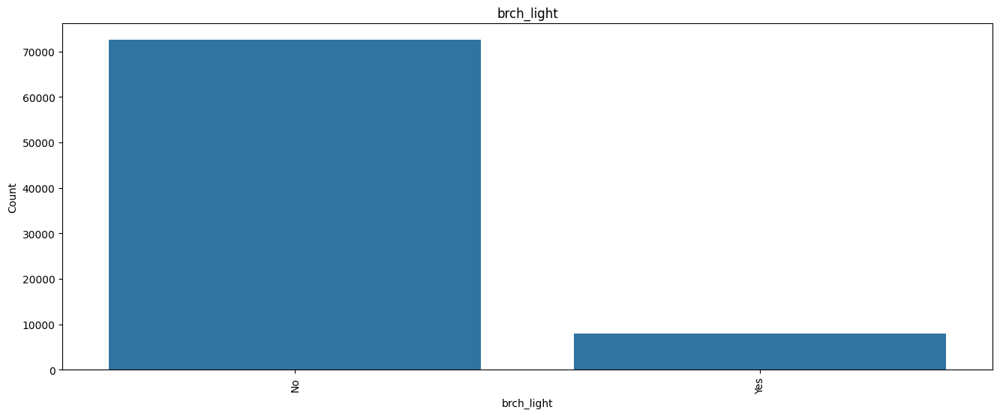

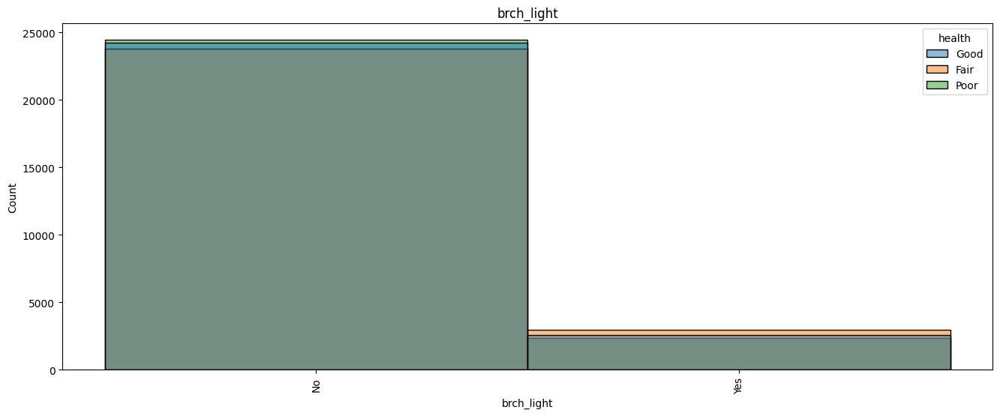

In [156]:
target = 'health'
variable = 'brch_light'

hist(data, variable, variable, 'Count', variable)
hist_of_target(data, target, variable, 'Count', variable)

In [157]:
groupby_two_variables(data, variable, target).sort_values('Total', ascending = False)

Средние значения поля "brch_light", агрегированные по полю "health": 


health,Fair,Good,Poor,Total,Fair_share,Good_share,Poor_share
brch_light,,,,,,,
No,23831,24225,24445,72501,32.869891,33.413332,33.716776
Yes,2987,2593,2370,7950,37.572327,32.616352,29.811321


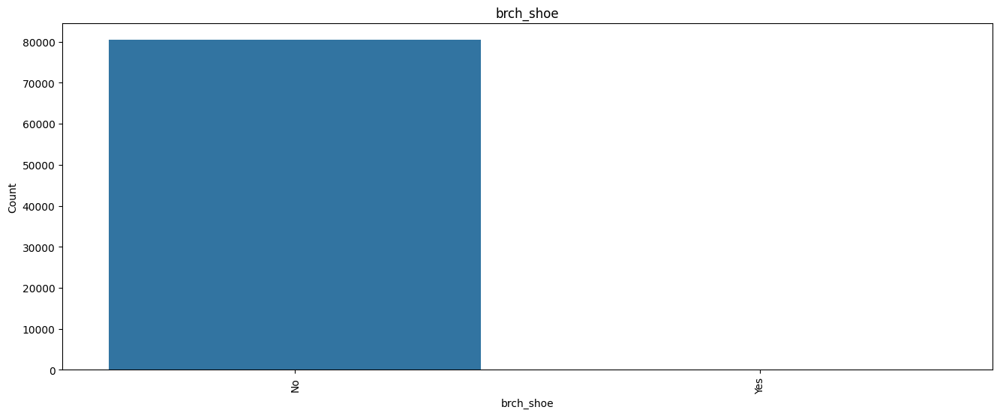

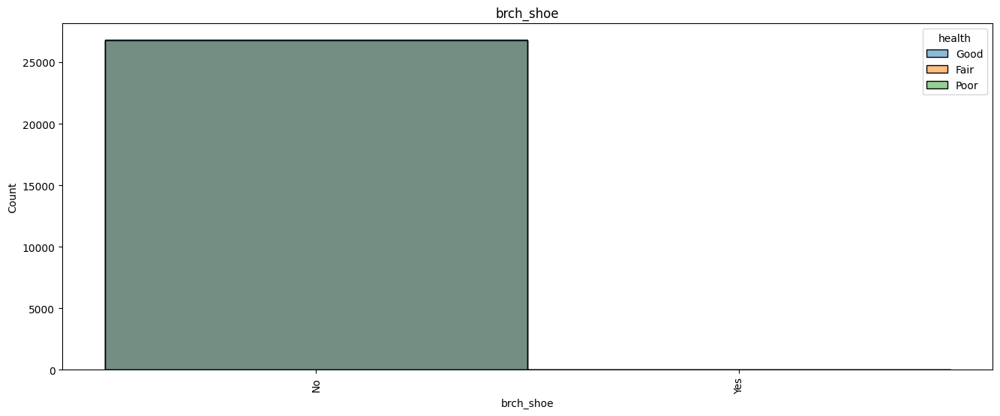

In [158]:
target = 'health'
variable = 'brch_shoe'

hist(data, variable, variable, 'Count', variable)
hist_of_target(data, target, variable, 'Count', variable)

In [159]:
groupby_two_variables(data, variable, target).sort_values('Total', ascending = False)

Средние значения поля "brch_shoe", агрегированные по полю "health": 


health,Fair,Good,Poor,Total,Fair_share,Good_share,Poor_share
brch_shoe,,,,,,,
No,26798,26806,26783,80387,33.336236,33.346188,33.317576
Yes,20,12,32,64,31.250000,18.750000,50.000000


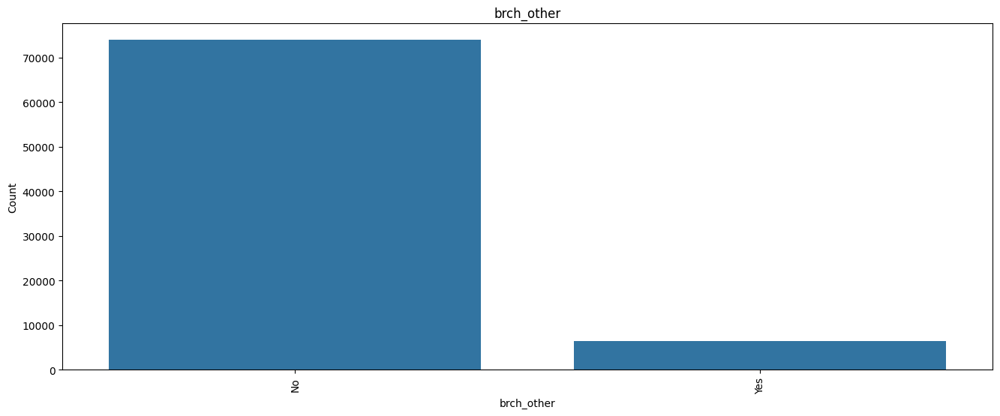

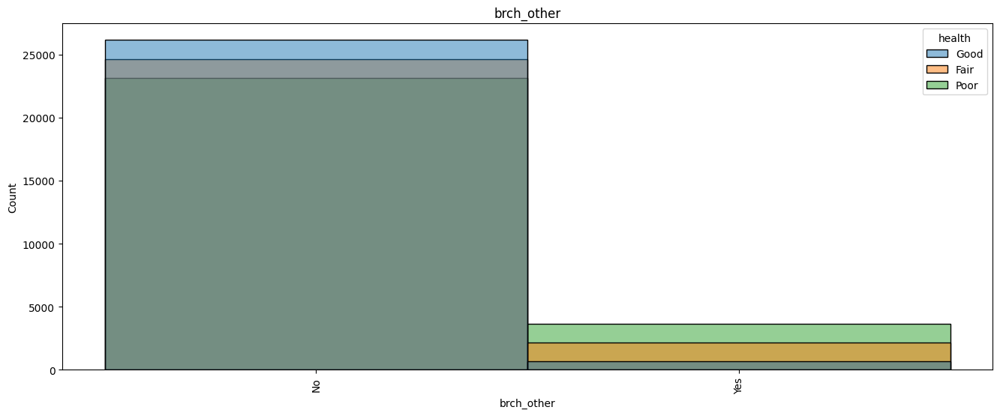

In [160]:
target = 'health'
variable = 'brch_other'

hist(data, variable, variable, 'Count', variable)
hist_of_target(data, target, variable, 'Count', variable)

In [161]:
groupby_two_variables(data, variable, target).sort_values('Total', ascending = False)

Средние значения поля "brch_other", агрегированные по полю "health": 


health,Fair,Good,Poor,Total,Fair_share,Good_share,Poor_share
brch_other,,,,,,,
No,24651,26144,23158,73953,33.333333,35.352183,31.314484
Yes,2167,674,3657,6498,33.348723,10.372422,56.278855


Данные поля можно использовать в качестве потенциальных предикторов, предварительно преобразовав в диапазон 0/1.

In [162]:
data_dummies = pd.get_dummies(data[['brch_light', 'brch_shoe', 'brch_other']], dtype = int, drop_first = True)
data = pd.concat([data, data_dummies], axis = 1)

### **address**

Поле крайне разнообразно, где в основном на один адрес приходится одно или несколько деревьев. Всего присутсвуют около 68.500 уникальных адресов на примерно 80 тысяч деревьев:

In [163]:
data['address'].nunique()

68544

In [164]:
target = 'health'
variable = 'address'

groupby_two_variables(data, variable, target).sort_values('Total', ascending = False).head(30)

Средние значения поля "address", агрегированные по полю "health": 


health,Fair,Good,Poor,Total,Fair_share,Good_share,Poor_share
address,,,,,,,
106 CROSS BAY BOULEVARD,20.0,5.0,62.0,87.0,22.988506,5.747126,71.264368
2350 FOREST HILL ROAD,13.0,5.0,12.0,30.0,43.333333,16.666667,40.000000
2 TELEPORT DRIVE,14.0,5.0,3.0,22.0,63.636364,22.727273,13.636364
2722 VETERANS ROAD WEST,3.0,0.0,18.0,21.0,14.285714,0.000000,85.714286
900 SOUTH AVENUE,6.0,3.0,12.0,21.0,28.571429,14.285714,57.142857
73-004 199 STREET,2.0,2.0,16.0,20.0,10.000000,10.000000,80.000000
79-25 WINCHESTER BOULEVARD,9.0,1.0,9.0,19.0,47.368421,5.263158,47.368421
1 BEACH 105 STREET,3.0,0.0,15.0,18.0,16.666667,0.000000,83.333333
28-055 ULMER STREET,5.0,0.0,10.0,15.0,33.333333,0.000000,66.666667


#### **Bag of Words + PCA**

Для данного поле предпочтительнее строить биграммы или триграммы, поскольку значения очень вариативны и использование униграмм может привести к переобучению.

In [165]:
token_pattern='(?u)[a-zA-Z][a-z ]+'

pca, variance, data_transformed, vec, bow = vectorize_and_pca(data, 'address', (2, 2), token_pattern, 5)

На примере нижно видно, что биграммы неплохо формируют векторы из улиц Нью-Йорка:

In [166]:
list(vec.vocabulary_.items())[:100]

[('west  street', 21),
 ('east  street', 11),
 ('north  street', 14),
 ('south  street', 17),
 ('paerdegat  street', 15),
 ('bay  street', 0),
 ('beach  street', 2),
 ('brighton  street', 6),
 ('co op city boulevard', 7),
 ('flatlands  street', 12),
 ('east  place', 10),
 ('west  drive', 18),
 ('west  place', 19),
 ('little west  street', 13),
 ('east  drive', 8),
 ('plumb  street', 16),
 ('beach  place', 1),
 ('east  drive south', 9),
 ('brighton  place', 4),
 ('west  road', 20),
 ('brighton  court', 3),
 ('brighton  road', 5)]

5 компонент способны объяснить 97.6% вариации исходного поля, причем 1 компонента объясняет 57.9% вариации:

In [167]:
variance

,component,variance
0,1,0.579376
1,2,0.284848
2,3,0.089936
3,4,0.013532
4,5,0.008429


In [168]:
scaler = MinMaxScaler().fit(data_transformed)
data_transformed_normed = pd.DataFrame(scaler.fit_transform(data_transformed.values), columns = data_transformed.columns, index = data_transformed.index)

data_transformed_test = pd.merge(data_transformed_normed, data['health'], left_index=True, right_index=True)

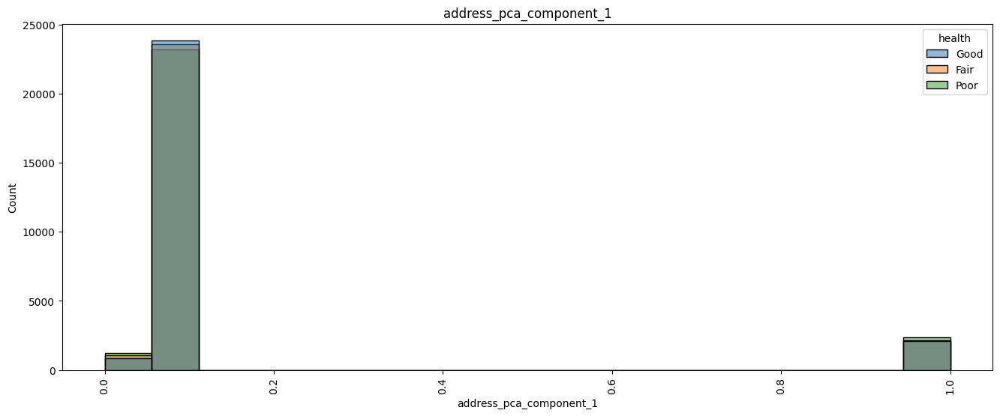

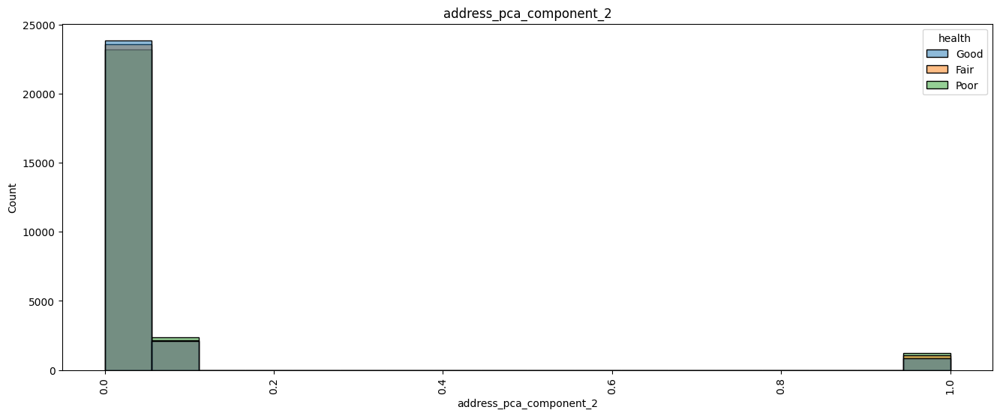

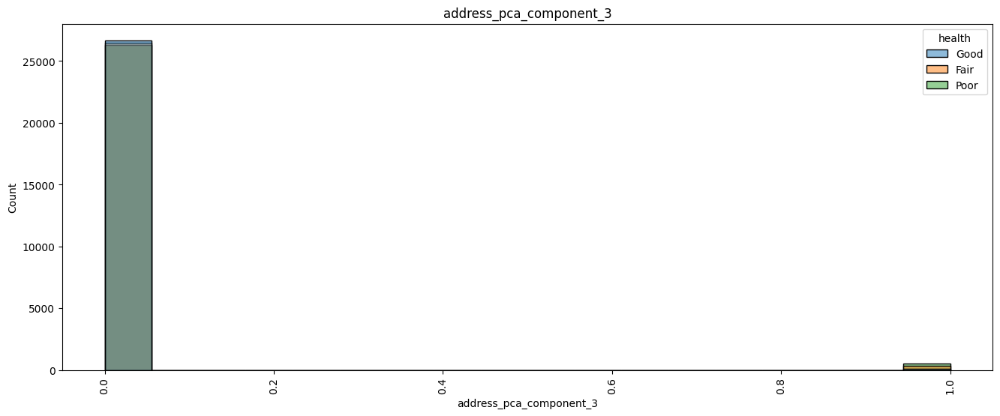

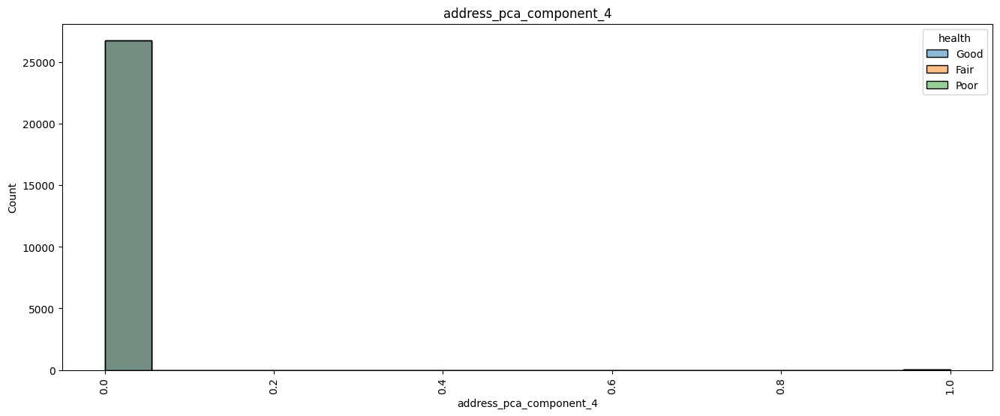

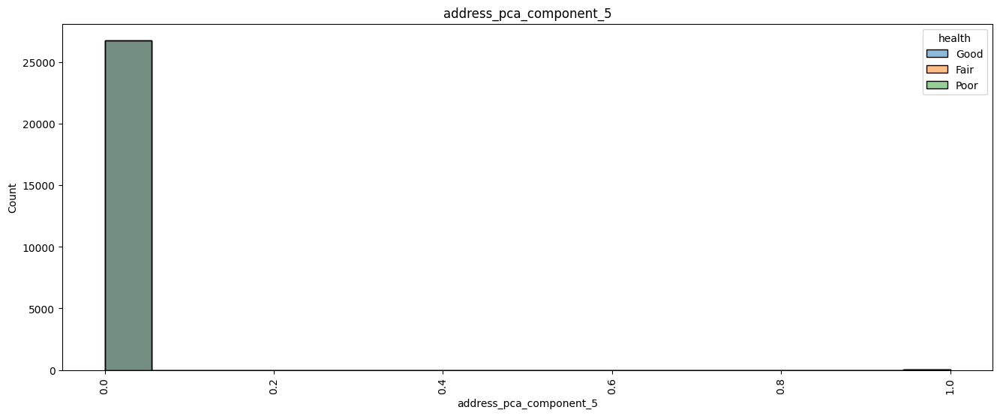

In [169]:
for i in range(len(data_transformed_test.columns) - 1):
    hist_of_target(data_transformed_test, 'health', data_transformed_test.columns[i], 'Count', data_transformed_test.columns[i])

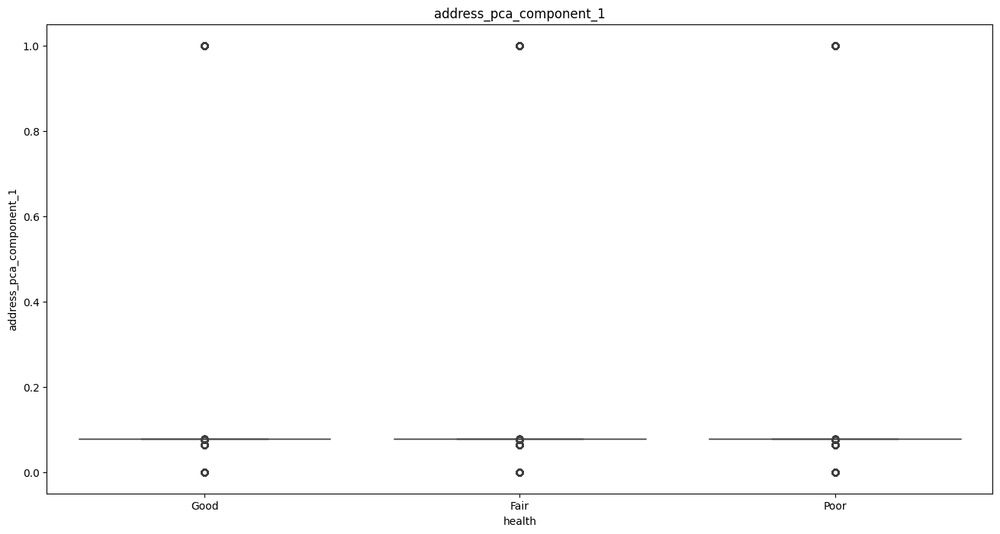

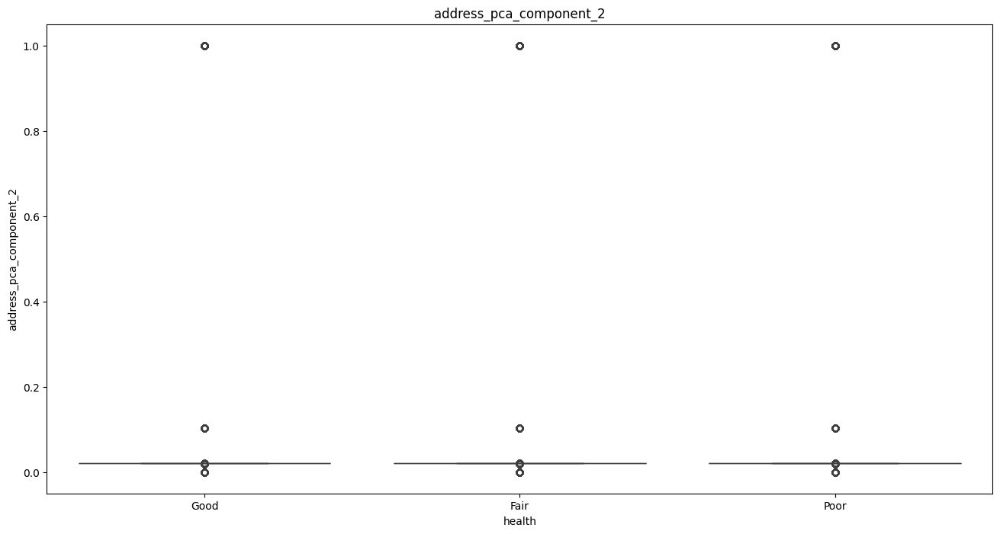

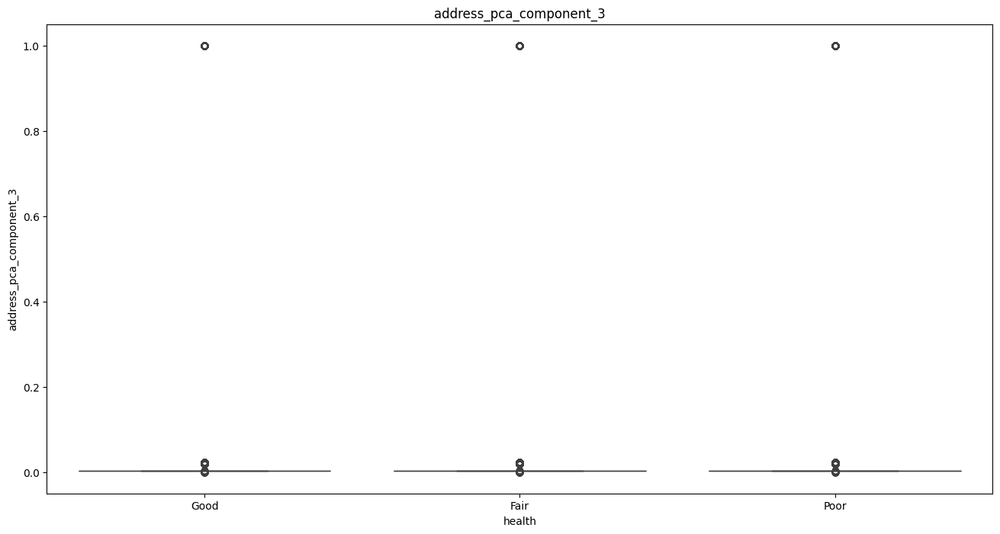

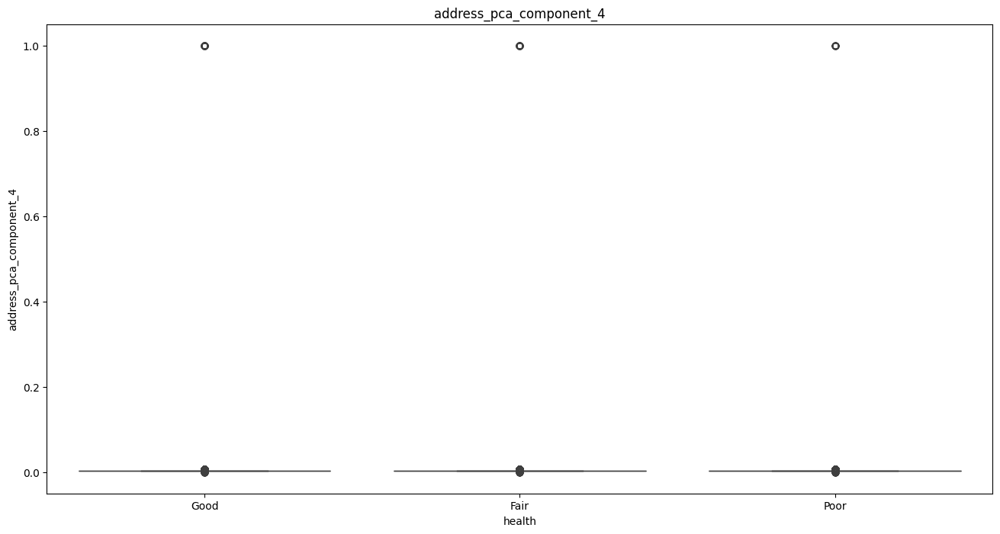

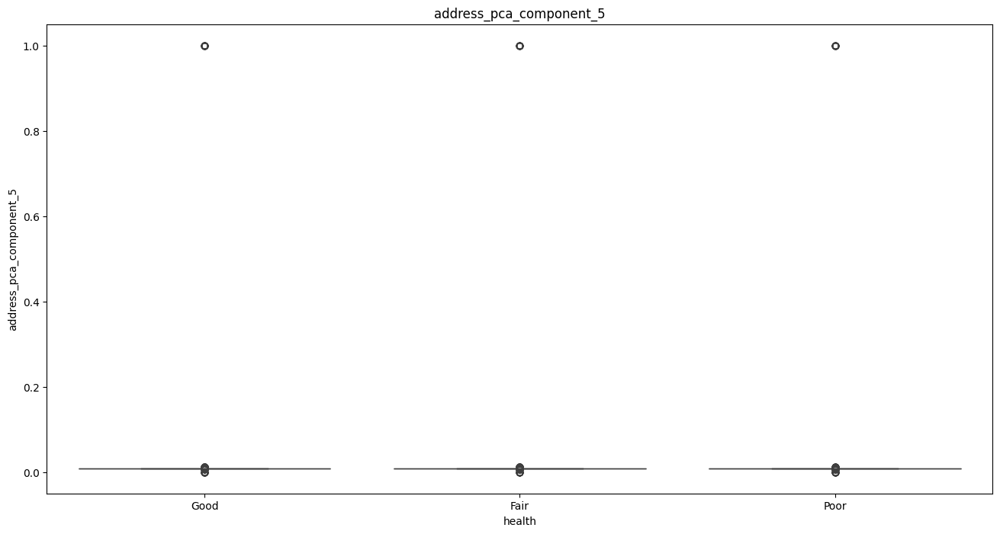

In [170]:
for i in range(len(data_transformed_test.columns) - 1):
    plot_two_variables(data_transformed_test, 'health', data_transformed_test.columns[i], data_transformed_test.columns[i])

In [171]:
data_transformed_test.groupby('health').mean()

,address_pca_component_1,address_pca_component_2,address_pca_component_3,address_pca_component_4,address_pca_component_5
health,,,,,
Fair,0.148773,0.066037,0.016657,0.005604,0.009338
Good,0.146526,0.059073,0.009099,0.005861,0.009645
Poor,0.155679,0.072584,0.023912,0.004871,0.009437


Аналогично полям "problems" и "sps_common", данные 5 компонент будут использованы для последующего анализа.

In [172]:
data = pd.merge(data, data_transformed_normed, left_index=True, right_index=True)

### **zip_city, borough**

Два поля анализируются совместно, поскольку из описания полей следует, что zip_city часто принимает значение аналогичное с полем "borough". 

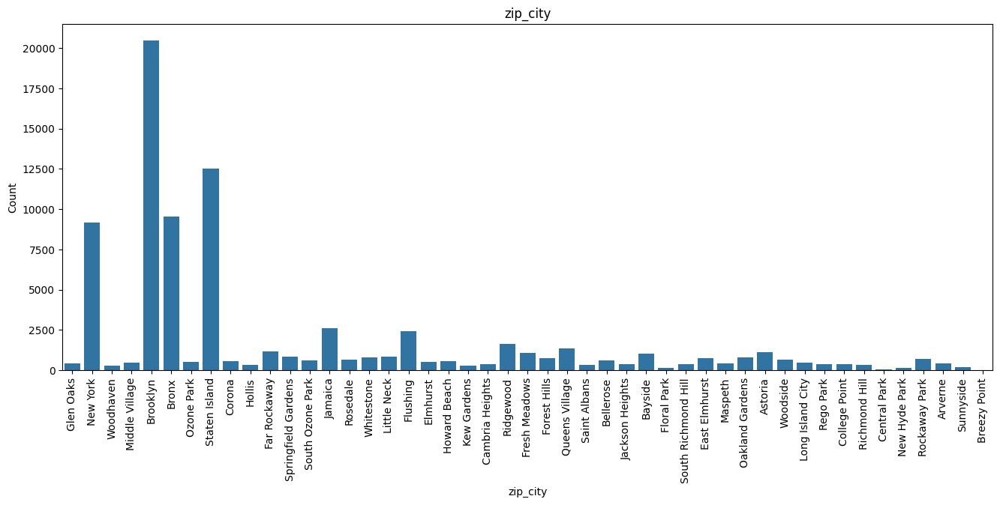

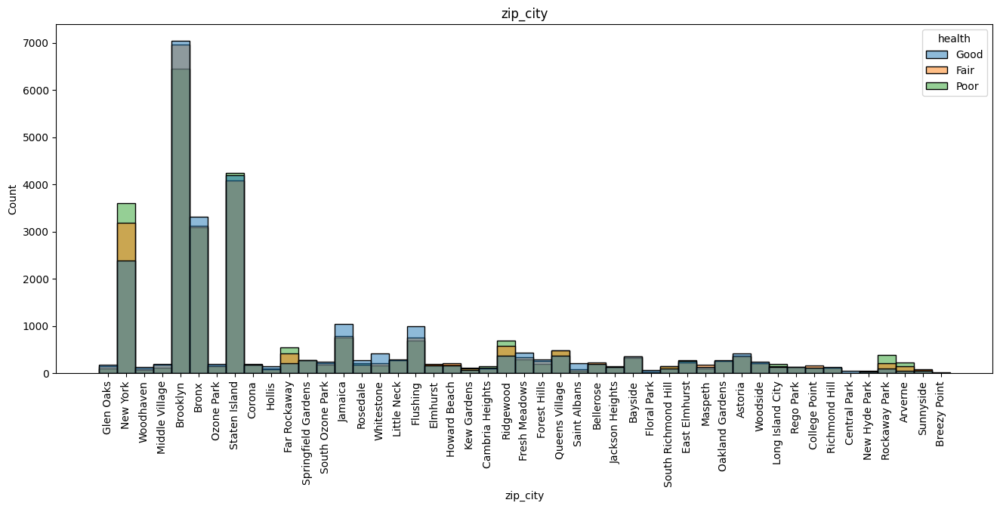

In [173]:
target = 'health'
variable = 'zip_city'

hist(data, variable, variable, 'Count', variable)
hist_of_target(data, target, variable, 'Count', variable)

Достаточно вариабельное поле, в которм значения способны неплохо делать совокупность по целевой переменой:

In [174]:
groupby_two_variables(data, variable, target).sort_values('Total', ascending = False)

Средние значения поля "zip_city", агрегированные по полю "health": 


health,Fair,Good,Poor,Total,Fair_share,Good_share,Poor_share
zip_city,,,,,,,
Brooklyn,6962.0,7041.0,6458.0,20461.0,34.025707,34.411808,31.562485
Staten Island,4087.0,4199.0,4238.0,12524.0,32.633344,33.527627,33.839029
Bronx,3115.0,3317.0,3094.0,9526.0,32.699979,34.820491,32.479530
New York,3178.0,2385.0,3601.0,9164.0,34.679179,26.025753,39.295068
Jamaica,791.0,1038.0,758.0,2587.0,30.575957,40.123695,29.300348
Flushing,761.0,987.0,686.0,2434.0,31.265407,40.550534,28.184059
Ridgewood,584.0,377.0,686.0,1647.0,35.458409,22.890103,41.651488
Queens Village,486.0,369.0,479.0,1334.0,36.431784,27.661169,35.907046
Far Rockaway,411.0,202.0,550.0,1163.0,35.339639,17.368874,47.291488


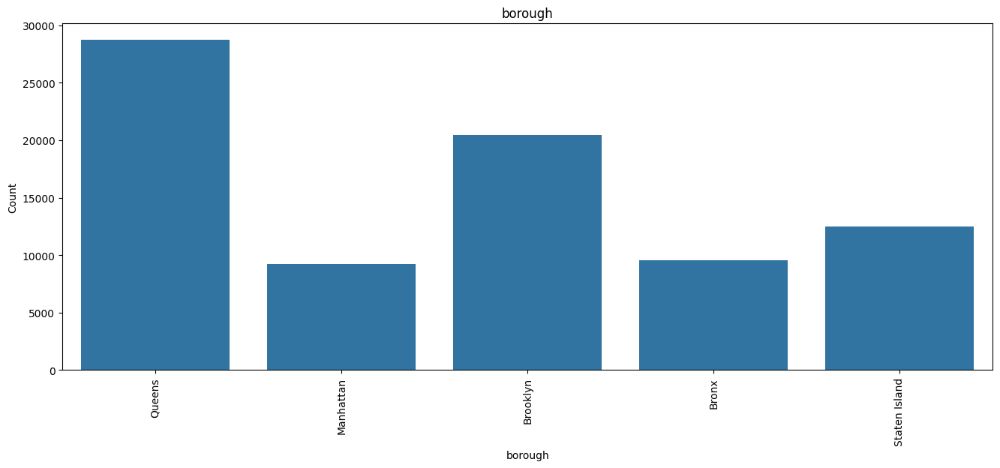

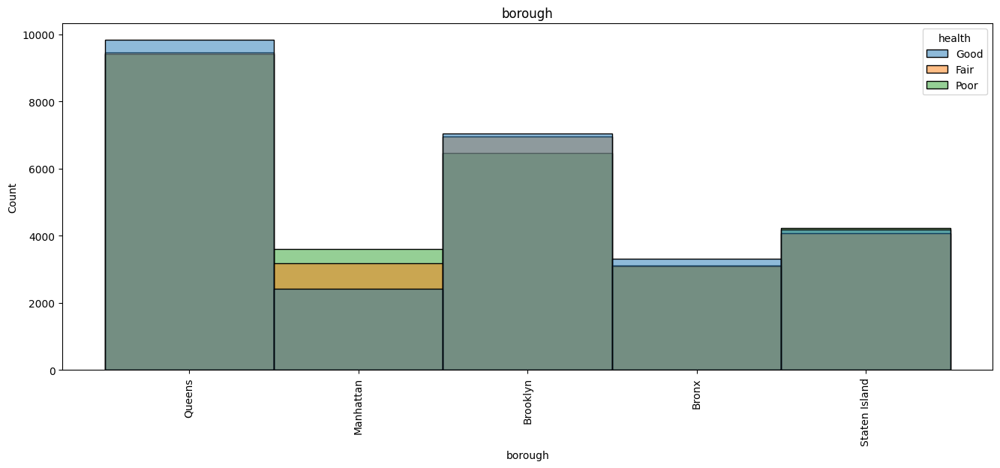

In [175]:
target = 'health'
variable = 'borough'

hist(data, variable, variable, 'Count', variable)
hist_of_target(data, target, variable, 'Count', variable)

Поле "borough" имеет меньше уникальных значений, которые достаточно многочисленные, однако они не сильно делят всю совокупность по целевой перемнной. Явное разделение дает только значение "Manhattan", где доля хороших деревье значительно меньше, чем в других районах.

In [176]:
groupby_two_variables(data, variable, target).sort_values('Total', ascending = False)

Средние значения поля "borough", агрегированные по полю "health": 


health,Fair,Good,Poor,Total,Fair_share,Good_share,Poor_share
borough,,,,,,,
Queens,9466,9831,9415,28712,32.968794,34.240039,32.791167
Brooklyn,6963,7041,6458,20462,34.028932,34.410126,31.560942
Staten Island,4087,4199,4238,12524,32.633344,33.527627,33.839029
Bronx,3115,3317,3094,9526,32.699979,34.820491,32.479530
Manhattan,3187,2430,3609,9226,34.543681,26.338608,39.117711


По графику ниже видно, что большинству значений "zip_city" соответствует район "Queens":

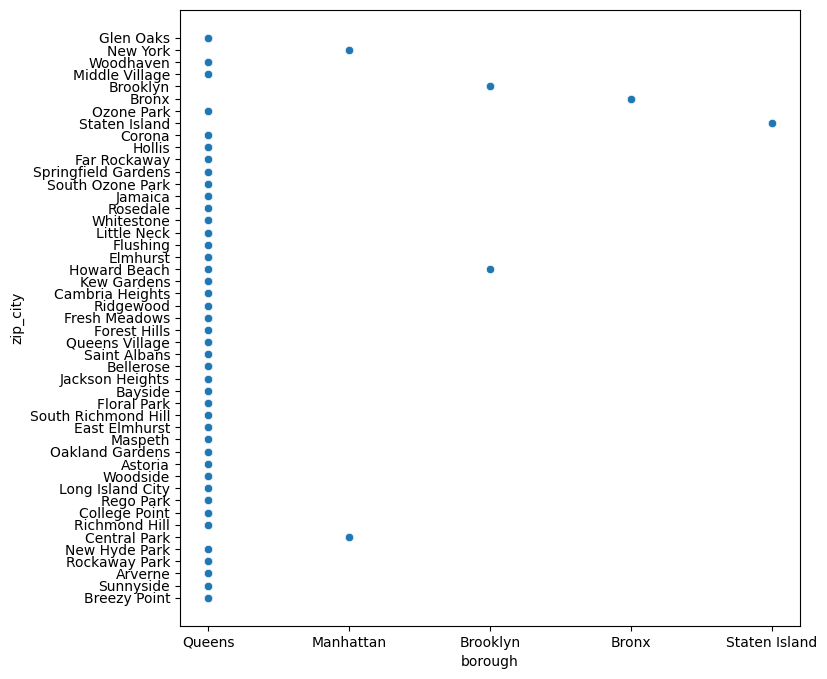

In [177]:
plt.figure(figsize = (8, 8))
sns.scatterplot(data = data, x = 'borough', y = 'zip_city')
plt.show()

Для поля "borough" можно преобразовать значения при помощи метода "one-hot encoding":

In [178]:
borough_most_frequent = [x for x in data.borough.value_counts().sort_values(ascending = False).head(4).index]
for value in borough_most_frequent:
    colum_name = 'has_' + str(value) + '_borough'
    data[colum_name] = np.where(data['borough'] == value, 1, 0)

Данные 4 поля будут использованы для дальнейшего анализа.

#### **Bag of Words + PCA**

Для поля "zip_city" имеет смысл попробовать связку "Bag of Words + PCA"

In [179]:
token_pattern='(?u)[a-zA-Z][a-z ]+'

pca, variance, data_transformed, vec, bow = vectorize_and_pca(data, 'zip_city', (1, 1), token_pattern, 5)

Районы города вполне неплохо векторизировались:

In [180]:
list(vec.vocabulary_.items())[:100]

[('glen oaks', 18),
 ('new york', 29),
 ('woodhaven', 45),
 ('middle village', 27),
 ('brooklyn', 6),
 ('bronx', 5),
 ('ozone park', 31),
 ('staten island', 42),
 ('corona', 10),
 ('hollis', 19),
 ('far rockaway', 13),
 ('springfield gardens', 41),
 ('south ozone park', 39),
 ('jamaica', 22),
 ('rosedale', 37),
 ('whitestone', 44),
 ('little neck', 24),
 ('flushing', 15),
 ('elmhurst', 12),
 ('howard beach', 20),
 ('kew gardens', 23),
 ('cambria heights', 7),
 ('ridgewood', 35),
 ('fresh meadows', 17),
 ('forest hills', 16),
 ('queens village', 32),
 ('saint albans', 38),
 ('bellerose', 3),
 ('jackson heights', 21),
 ('bayside', 2),
 ('floral park', 14),
 ('south richmond hill', 40),
 ('east elmhurst', 11),
 ('maspeth', 26),
 ('oakland gardens', 30),
 ('astoria', 1),
 ('woodside', 46),
 ('long island city', 25),
 ('rego park', 33),
 ('college point', 9),
 ('richmond hill', 34),
 ('central park', 8),
 ('new hyde park', 28),
 ('rockaway park', 36),
 ('arverne', 0),
 ('sunnyside', 43),
 (

Данные 5 компонент объясняют 64.5% вариации исходного поля "zip_city":

In [181]:
variance

,component,variance
0,1,0.245868
1,2,0.159777
2,3,0.132006
3,4,0.072377
4,5,0.035612


In [182]:
scaler = MinMaxScaler().fit(data_transformed)
data_transformed_normed = pd.DataFrame(scaler.fit_transform(data_transformed.values), columns = data_transformed.columns, index = data_transformed.index)

data_transformed_test = pd.merge(data_transformed_normed, data['health'], left_index=True, right_index=True)

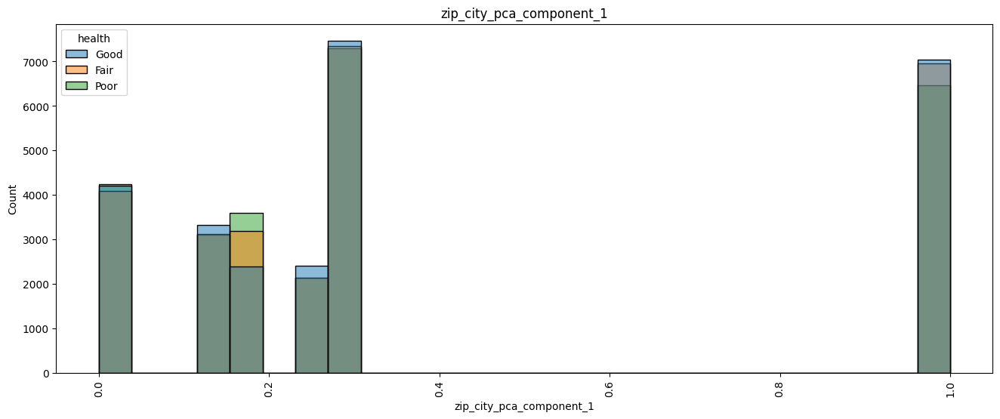

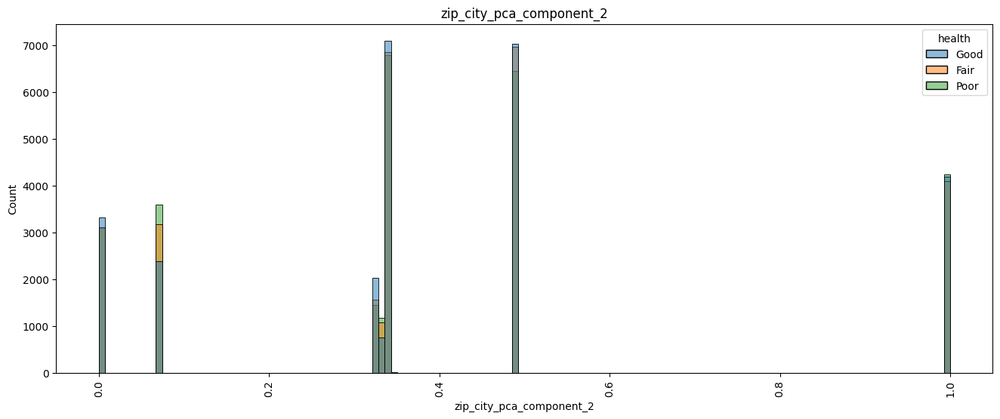

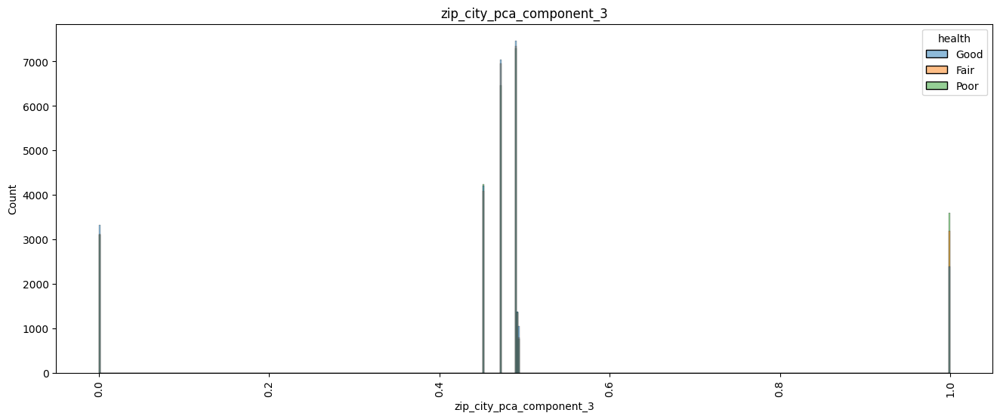

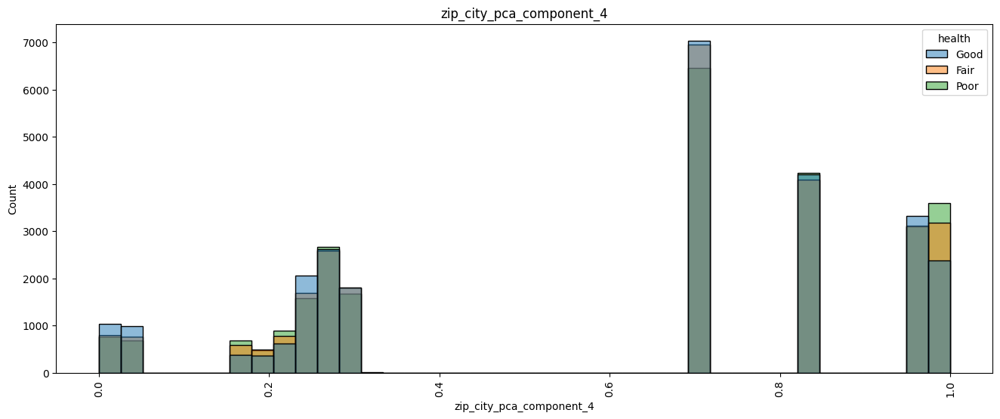

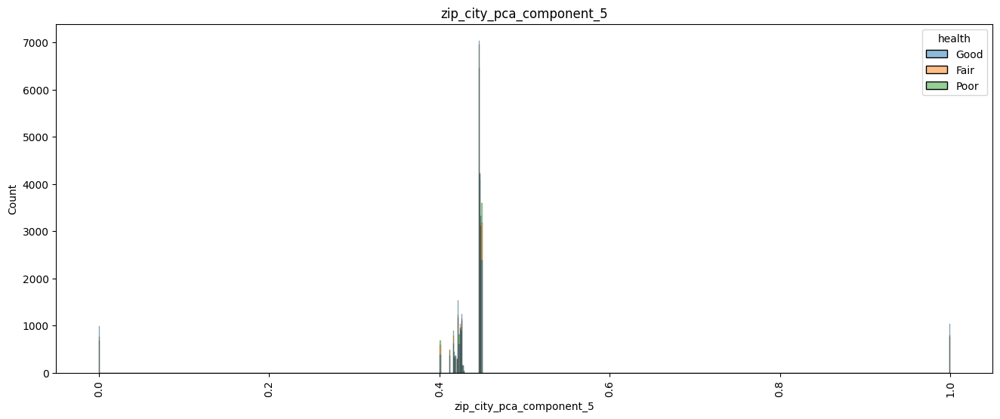

In [183]:
for i in range(len(data_transformed_test.columns) - 1):
    hist_of_target(data_transformed_test, 'health', data_transformed_test.columns[i], 'Count', data_transformed_test.columns[i])

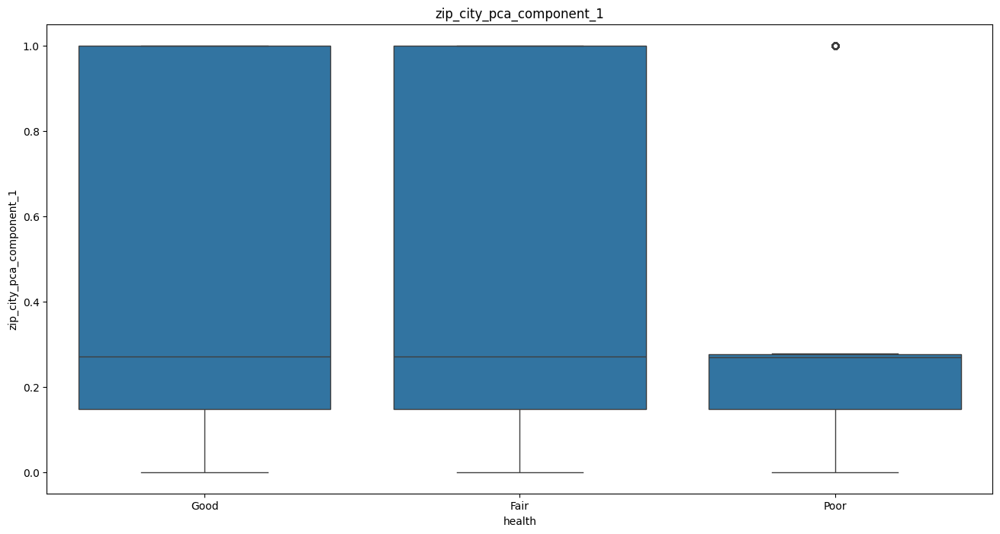

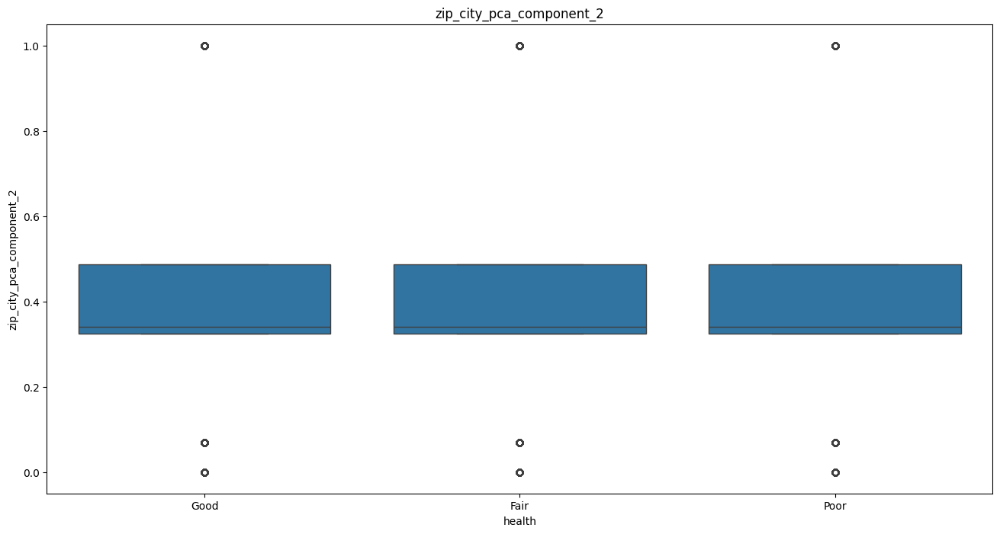

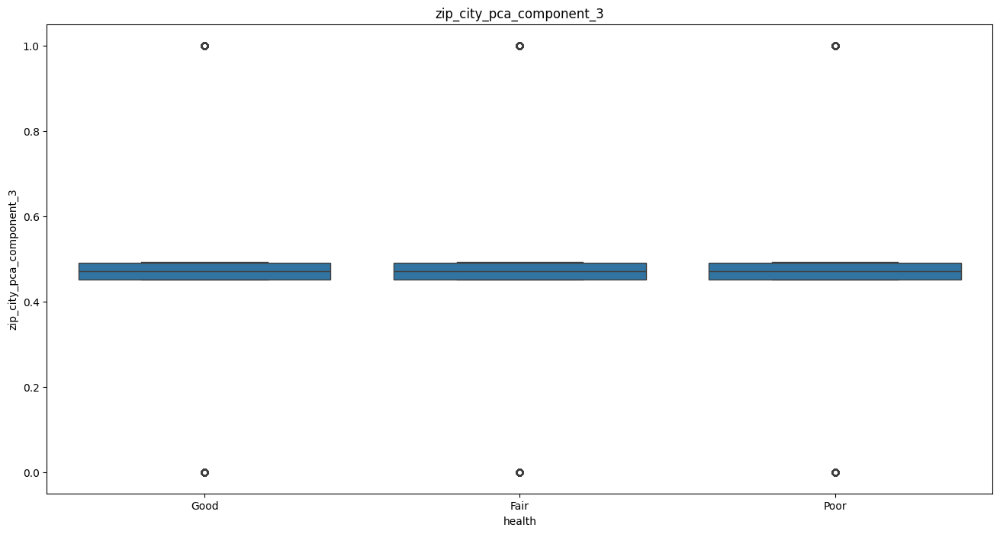

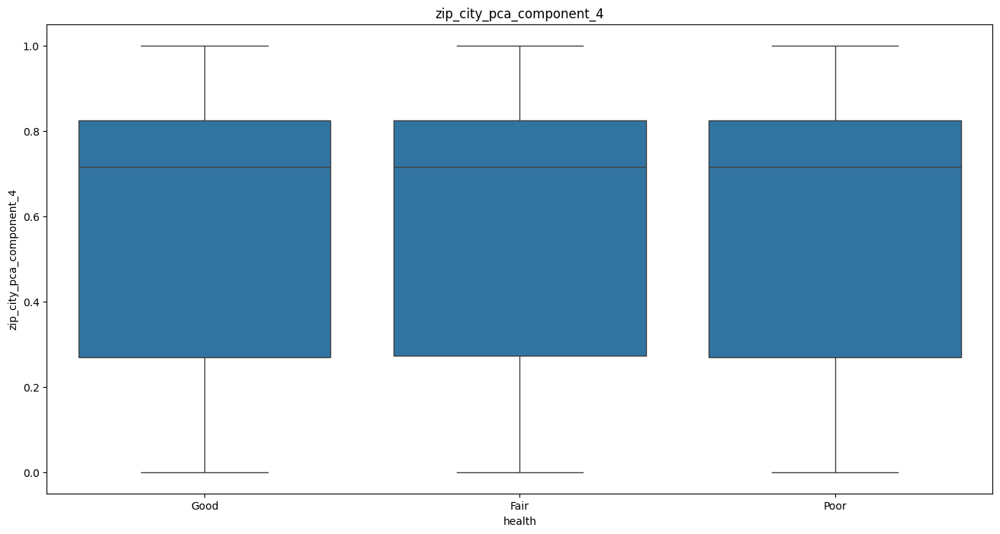

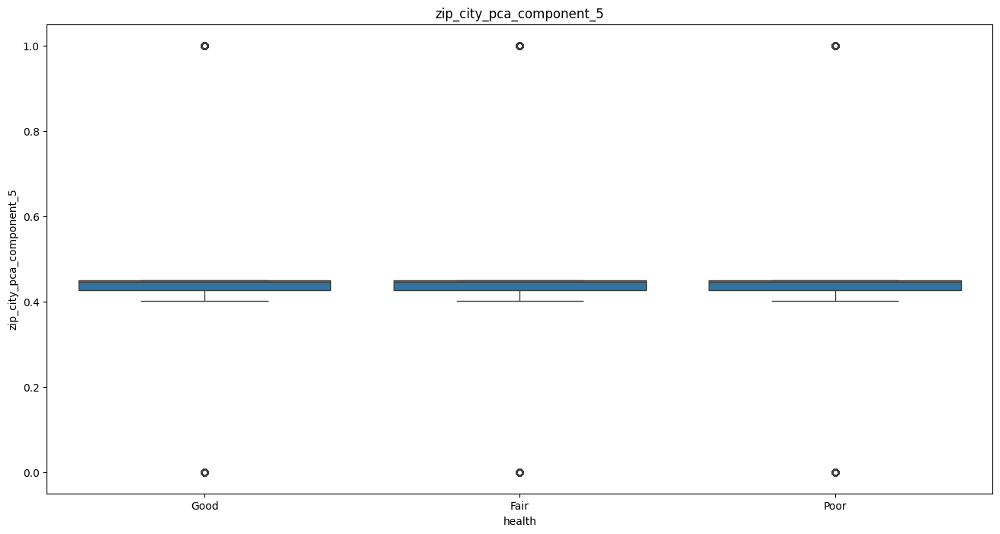

In [184]:
for i in range(len(data_transformed_test.columns) - 1):
    plot_two_variables(data_transformed_test, 'health', data_transformed_test.columns[i], data_transformed_test.columns[i])

In [185]:
data_transformed_test.groupby('health').mean()

,zip_city_pca_component_1,zip_city_pca_component_2,zip_city_pca_component_3,zip_city_pca_component_4,zip_city_pca_component_5
health,,,,,
Fair,0.391233,0.405788,0.482901,0.618205,0.443400
Good,0.394544,0.414249,0.463945,0.602176,0.444969
Poor,0.374346,0.402768,0.491459,0.624398,0.443869


Данные 5 компонент будут использованы для последующего анализа.

In [186]:
data = pd.merge(data, data_transformed_normed, left_index=True, right_index=True)

### **nta, nta_name**

Данные два поля также являются зависимыми друг от друга и полностью соответствуют друг другу:

In [187]:
data.groupby(['nta']).nta_name.nunique().max()

np.int64(1)

Для дальнейшего анализа буду использовать поле "nta_name".

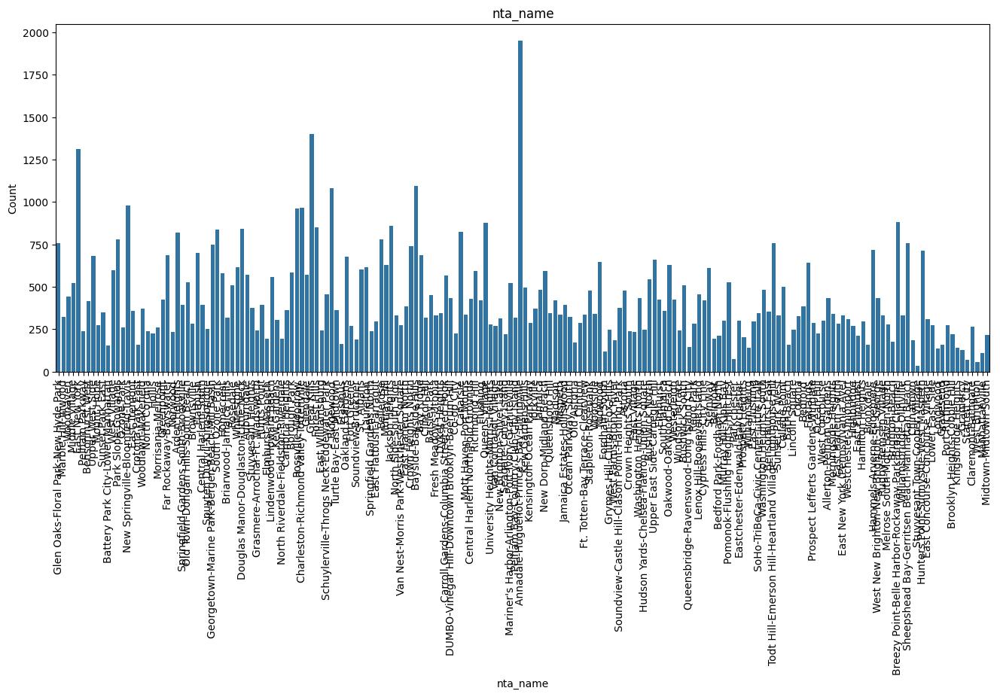

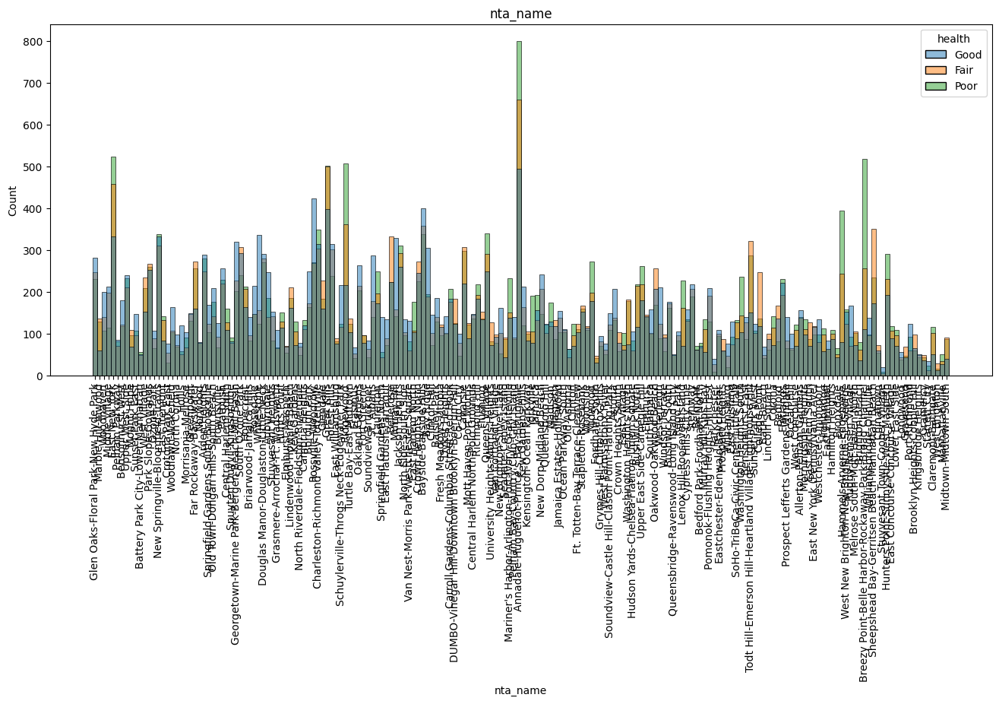

In [188]:
target = 'health'
variable = 'nta_name'

hist(data, variable, variable, 'Count', variable)
hist_of_target(data, target, variable, 'Count', variable)

Поле достаточно вариативно. Помимо прочего значения неплохо делят целевую переменную по классам:

In [189]:
groupby_two_variables(data, variable, target).sort_values('Total', ascending = False).head(30)

Средние значения поля "nta_name", агрегированные по полю "health": 


health,Fair,Good,Poor,Total,Fair_share,Good_share,Poor_share
nta_name,,,,,,,
Annadale-Huguenot-Prince's Bay-Eltingville,659,494,800,1953,33.742960,25.294419,40.962622
Great Kills,500,398,502,1400,35.714286,28.428571,35.857143
East New York,457,333,524,1314,34.779300,25.342466,39.878234
Bayside-Bayside Hills,358,399,337,1094,32.723949,36.471664,30.804388
Ridgewood,361,215,507,1083,33.333333,19.852262,46.814404
New Springville-Bloomfield-Travis,310,333,338,981,31.600408,33.944954,34.454638
Charleston-Richmond Valley-Tottenville,304,314,349,967,31.437435,32.471562,36.091003
Rossville-Woodrow,269,423,271,963,27.933541,43.925234,28.141225
Breezy Point-Belle Harbor-Rockaway Park-Broad Channel,255,111,517,883,28.878822,12.570781,58.550396


Как вариант, можно использовать Топ-5 самых частотных значений в качестве бинарных переменных.

In [190]:
nta_name_most_frequent = [x for x in data.nta_name.value_counts().sort_values(ascending = False).head(5).index]
for value in nta_name_most_frequent:
    colum_name = 'has_' + str(value) + '_nta_name'
    data[colum_name] = np.where(data['nta_name'] == value, 1, 0)

#### **Bag of Words + PCA**

Тесты с использованием униграмм, биграмм и триграмм не дают хорошего качества подгона. В целом выглядит так, что данное поле не подходит для дальнейшего использования.

In [191]:
token_pattern='(?u)[a-zA-Z][a-z ]+'

pca, variance, data_transformed, vec, bow = vectorize_and_pca(data, 'nta_name', (3, 3), token_pattern, 5)

In [192]:
list(vec.vocabulary_.items())[:100]

[('glen oaks floral park new hyde park', 15),
 ('new springville bloomfield travis', 25),
 ('old town dongan hills south beach', 27),
 ('georgetown marine park bergen beach', 14),
 ('marine park bergen beach mill basin', 22),
 ('douglas manor douglaston little neck', 9),
 ('grasmere arrochar ft', 16),
 ('arrochar ft wadsworth', 2),
 ('north riverdale fieldston riverdale', 26),
 ('charleston richmond valley tottenville', 7),
 ('schuylerville throgs neck edgewater park', 33),
 ('van nest morris park westchester square', 40),
 ('carroll gardens columbia street red hook', 5),
 ('dumbo vinegar hill downtown brooklyn', 10),
 ('vinegar hill downtown brooklyn boerum hill', 41),
 ('mariner s harbor arlington', 23),
 ('s harbor arlington port ivory', 32),
 ('arlington port ivory graniteville', 1),
 ('pelham bay country club city island', 28),
 ('annadale huguenot prince', 0),
 ('huguenot prince s bay', 20),
 ('prince s bay eltingville', 30),
 ('ft totten bay terrace', 13),
 ('totten bay terrace 

In [193]:
variance

,component,variance
0,1,0.219871
1,2,0.067264
2,3,0.059818
3,4,0.057958
4,5,0.056549


In [194]:
scaler = MinMaxScaler().fit(data_transformed)
data_transformed_normed = pd.DataFrame(scaler.fit_transform(data_transformed.values), columns = data_transformed.columns, index = data_transformed.index)

data_transformed_test = pd.merge(data_transformed_normed, data['health'], left_index=True, right_index=True)

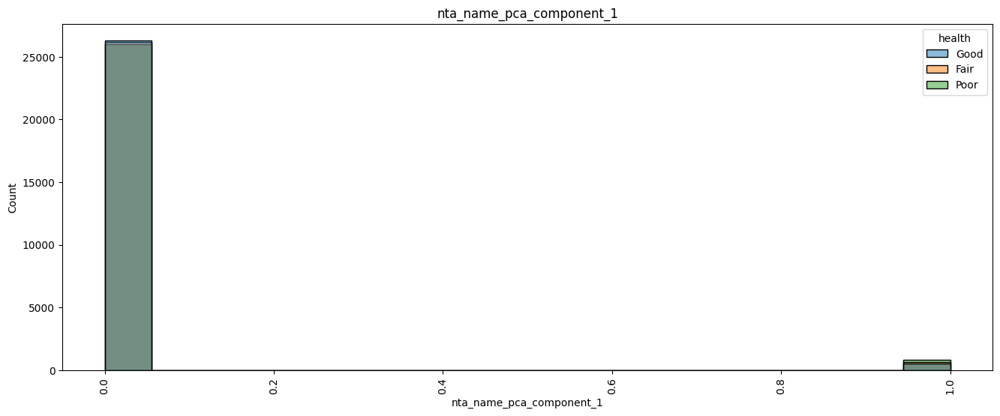

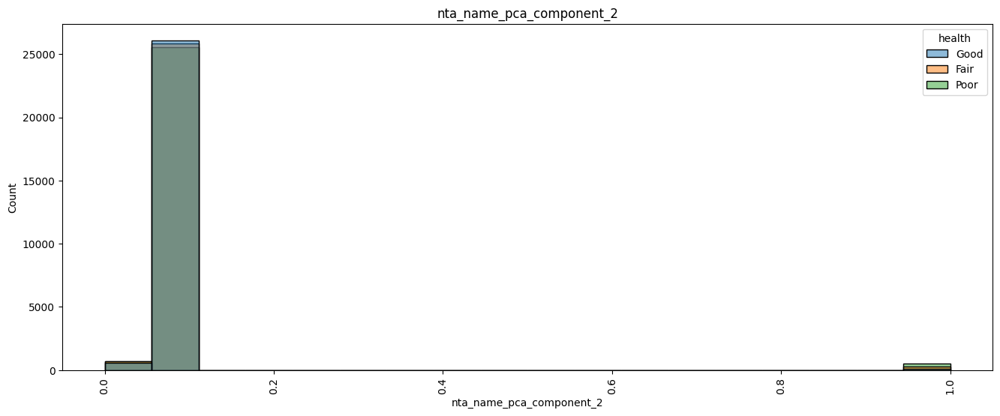

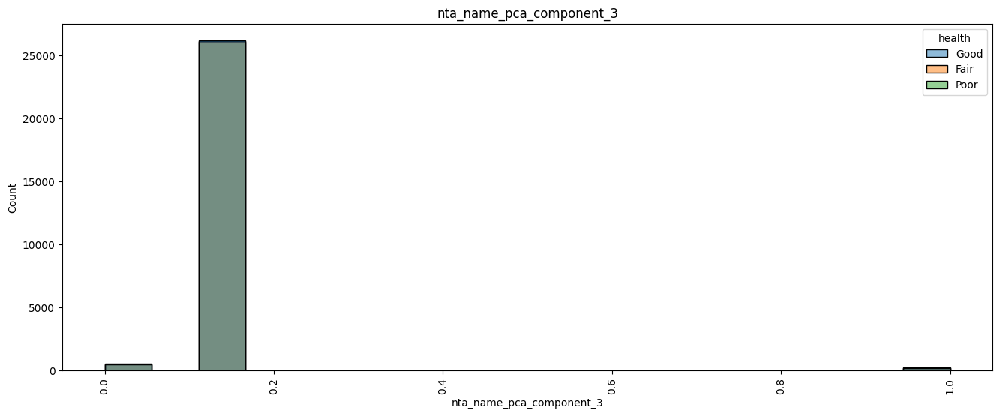

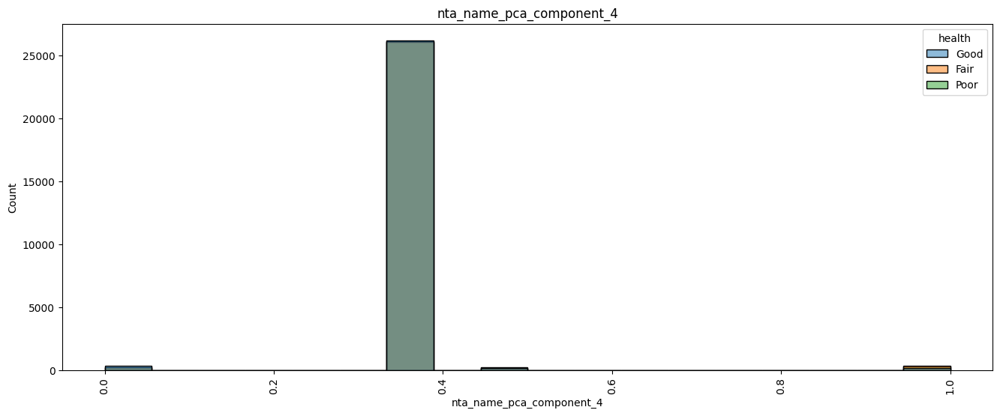

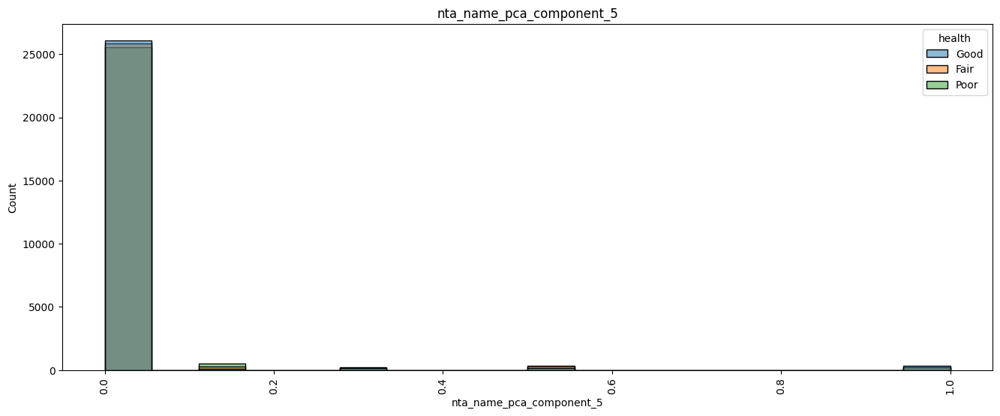

In [195]:
for i in range(len(data_transformed_test.columns) - 1):
    hist_of_target(data_transformed_test, 'health', data_transformed_test.columns[i], 'Count', data_transformed_test.columns[i])

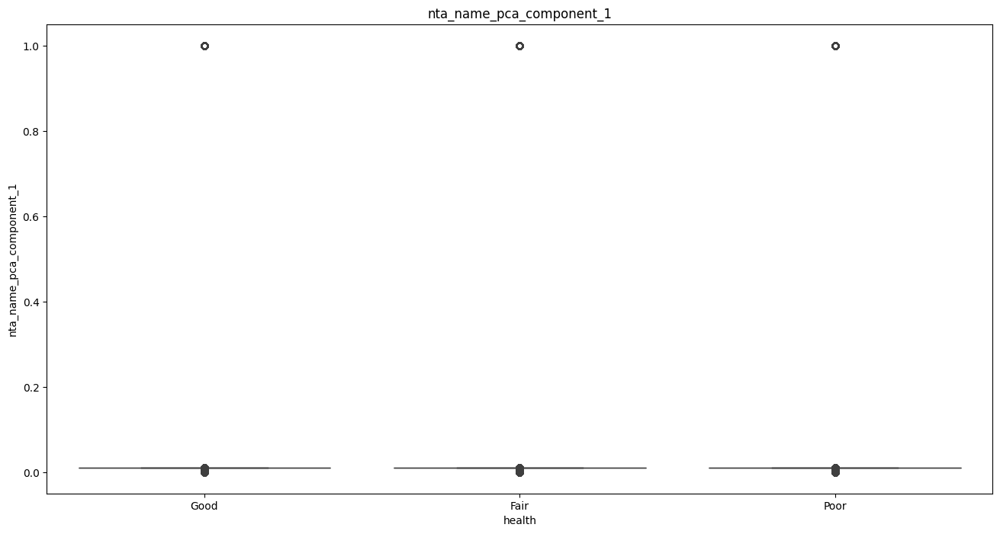

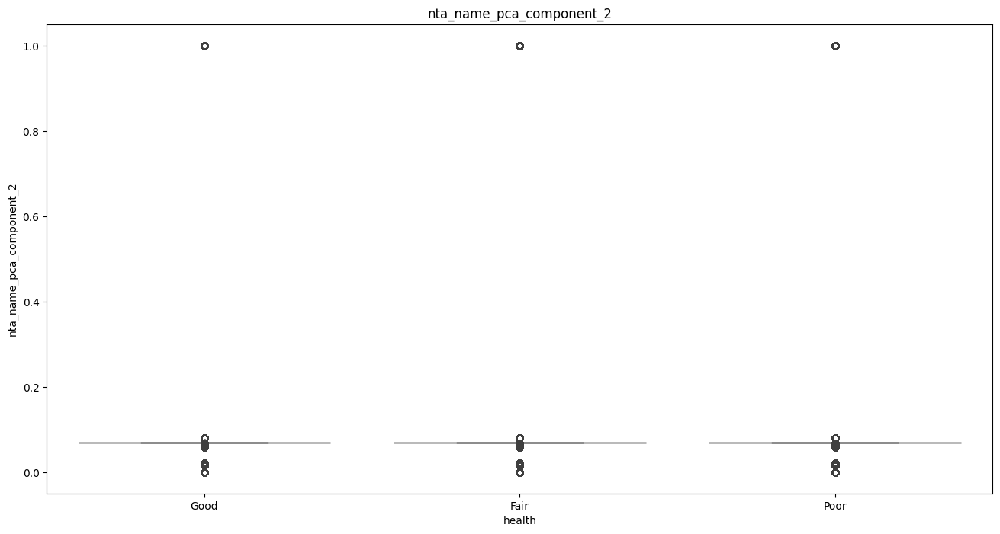

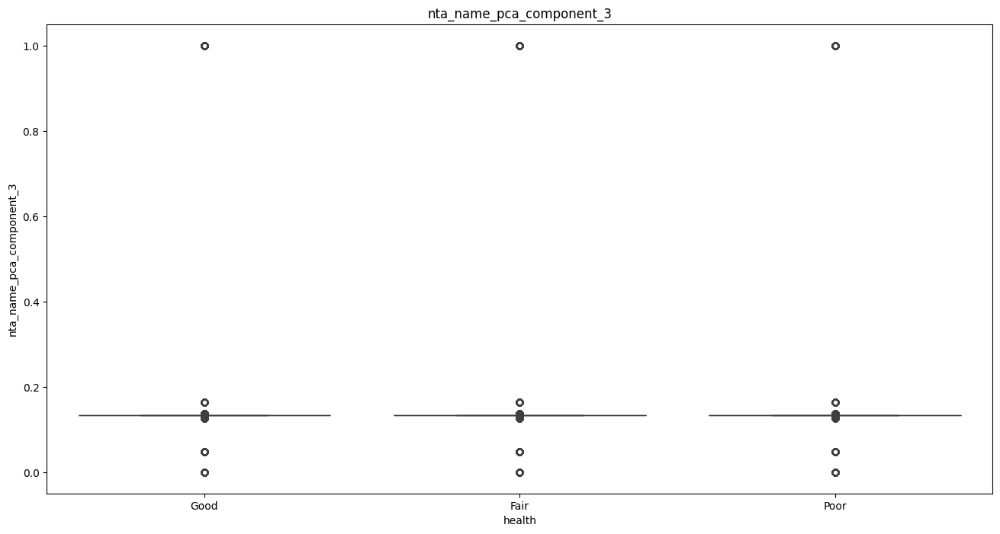

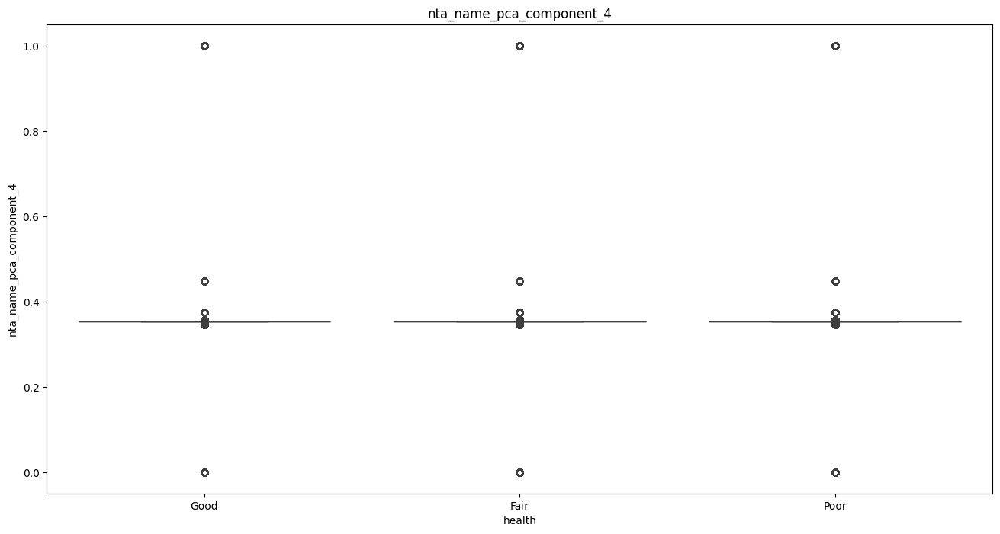

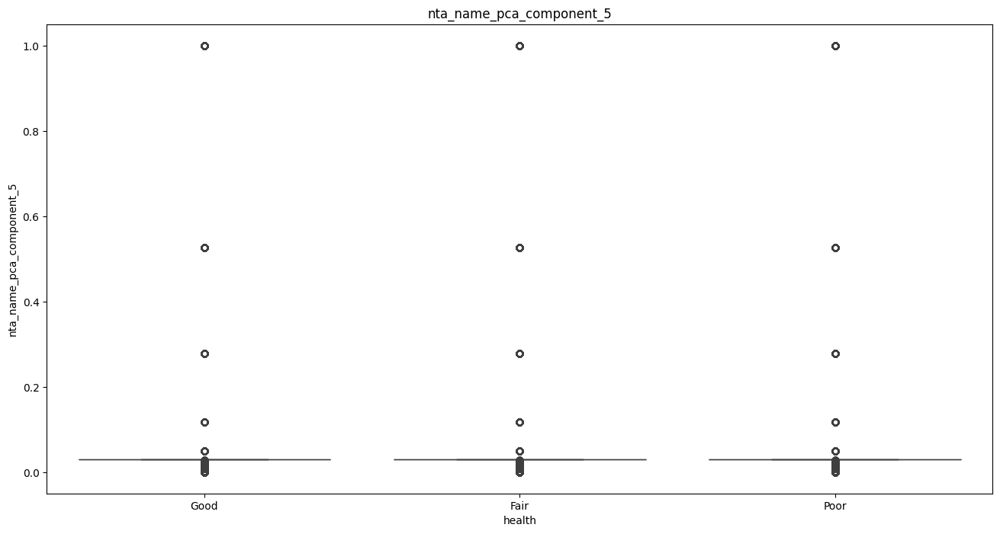

In [196]:
for i in range(len(data_transformed_test.columns) - 1):
    plot_two_variables(data_transformed_test, 'health', data_transformed_test.columns[i], data_transformed_test.columns[i])

In [197]:
data_transformed_test.groupby('health').mean()

,nta_name_pca_component_1,nta_name_pca_component_2,nta_name_pca_component_3,nta_name_pca_component_4,nta_name_pca_component_5
health,,,,,
Fair,0.033910,0.075767,0.135443,0.357520,0.043955
Good,0.027921,0.070938,0.135373,0.351999,0.043471
Poor,0.038994,0.084802,0.138648,0.357563,0.044027


In [198]:
#data = pd.merge(data, data_transformed_normed, left_index=True, right_index=True)

#### **Итого**

Выглядит так, что данное поле не принесет полезной информации для модели:
- Связка "Bag of Words + PCA" не дало хороших компонент. способных как-то разделять целевую переменную;
- "One-hot encoding" создаст очень разреженную матрицу. Для дальнейшего анализа были выбраны только 5 самых частотных значений.

### **Основные выводы**

По распределению можно сделать следующие выводы:
- created_at можно отбросить из-за нерелевантности для данной задачи;
- status можно отбросить из-за того, что для данной задачи нужны только случаи со значением Alive(т.е. живые деревья); 
- state принимает только одно значение, поэтому его можно отбросить;
- curb_loc, problems, problems, trunk_ware, trnk_light, brch_shoe, выглядят не слишком вариабельными. Возможно они не смогут дать достаточно информации и для быстродействия модели их придется убрать; 
- curb_loc, sidewalk, root stone, root_grade, root_other, trunk_wire, trnk_light, trnk_other, brch_light, brch_shoe, brch_other,  - бинарные категориальные поля. Для последующего моделирования нужно заменить значения на 1/0;
- steward, guards, usertype, borough, - категориальные поля. Значения нужно преобразовать перед использованием в моделях ML/AI;
- spc_latin, spc_common, problems, zip_city, nta, nta_name - тектовые поля. Значения нужно преобразовать перед использованием в моделях ML/AI;
- spc_latin и spc_common; nta и nta_name - имеют очень схожие распределения соответственно. Их них были отобраны поля spc_common и nta_name.

Также отдельно для каждого поля была предложена предобработка значений для последующего анализа и использования в моделях ML/AI.

## **Визуализация на карте мира**

Для визуализации качества деревьев я использовал библиотеку "folium".

In [3]:
# poor_health_map = folium.Map(location=[40.708752, -73.945031], zoom_start=10)

# for i in range(len(data)):
#     if data.iloc[i]['health'] == 'Poor':
#         folium.Circle(location = [data.iloc[i]['latitude'], data.iloc[i]['longitude']], radius = 1, color = 'red').add_to(poor_health_map)
        
# poor_health_map

Недостаток в том, что визуализация всех деревьев на карте делает карту плохо обозримой и прасматриваемой, в том числе из-за слишком большого числа объектов.

## **Поиск возможных методов импутации пропусков**

### **Поиск зависимостей пропусков**

Всего есть две "группы" полей, в которых обнаружено достаточно большое число пропусков, чтобы обратить на это внимание:
- council_district и census_tract;
- bin и bbl.

Поля bin и bbl не имеют описание, которое поставлялось вмесвте с набором данных, поэтому выявить пропуски для них достаточно затруднительно.
Для полей council_district и census_tract можно предроложить следующее:
- Пропуски появились на этапе сбора информации, где данные значения вводились не всегда и/или по желанию;
- Есть особенности, связанные с административно-территориальным делением в стране.

Количество пропусков совпадает и они полностью зависимы между собой:

In [200]:
data_unbalanced['council_district_blank_values'] = np.where((data_unbalanced['council district'].isnull()), 1, 0)
data_unbalanced['census_tract_blank_values'] = np.where(data_unbalanced['census tract'].isnull(), 1, 0)

condition = data_unbalanced['council_district_blank_values'] + data_unbalanced['census_tract_blank_values']
data_unbalanced['blank_both_council_district_census_tract'] = np.where(condition == 2, 1, 0)

print('Количество пропусков в поле council_district: {}'.format(data_unbalanced['council_district_blank_values'].value_counts()[1]))
print('Количество пропусков в поле census_tract: {}'.format(data_unbalanced['census_tract_blank_values'].value_counts()[1]))
print('Количество пропусков в обоих полях одновременно: {}'.format(data_unbalanced['blank_both_council_district_census_tract'].value_counts()[1]))

Количество пропусков в поле council_district: 6519
Количество пропусков в поле census_tract: 6519
Количество пропусков в обоих полях одновременно: 6519


Пропуски затрагивают лишь часть Нью-Йорка, поэтому считать их полностью случайными некорректно:

In [4]:
# blank_both_council_district_census_tract_map = folium.Map(location=[40.708752, -73.945031], zoom_start=10)

# for i in range(len(data_unbalanced)):
#     if data_unbalanced.iloc[i]['blank_both_council_district_census_tract'] == 1:
#         folium.Circle(location = [data_unbalanced.iloc[i]['latitude'], data_unbalanced.iloc[i]['longitude']], radius = 1, color = 'red'
#                      ).add_to(blank_both_council_district_census_tract_map)
        
# blank_both_council_district_census_tract_map.save('\\data\\maps\\blank_both_council_district_census_tract_map.html')
# blank_both_council_district_census_tract_map

Причем существуют целые районы/участки улиц, у которых есть пропуски в данных:

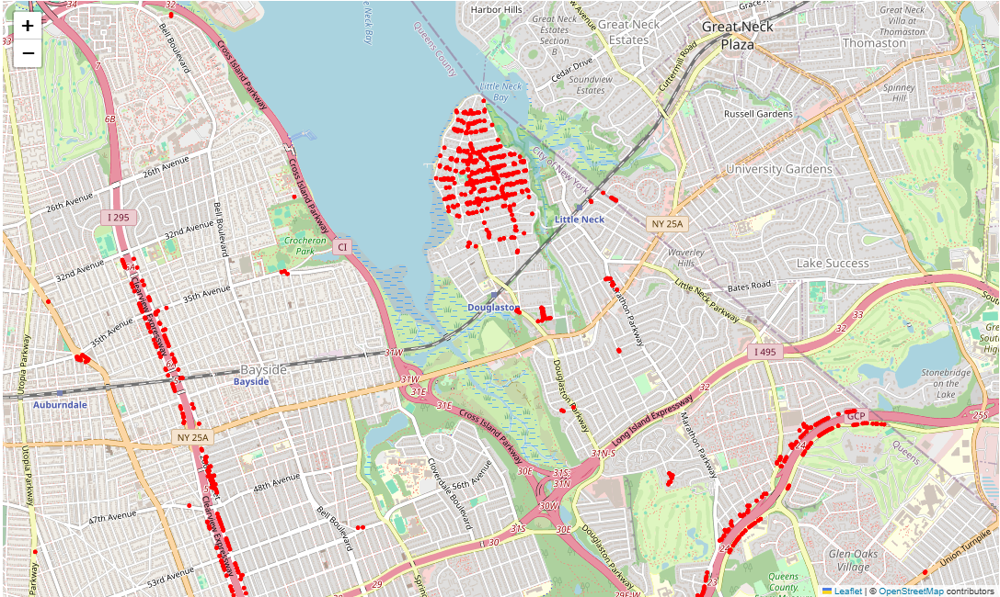

Если смотреть на качество деревьев разбивке по пропускам, то есть небольшие отличия. Поэтому нужно данные пропуски учесть в данных:

In [202]:
data_unbalanced.groupby(['blank_both_council_district_census_tract']).health.value_counts(normalize=True).unstack().sort_values('Good', ascending=False)

health,Fair,Good,Poor
blank_both_council_district_census_tract,,,
0,0.147794,0.811228,0.040977
1,0.166613,0.777312,0.056075


Наибольшая доля пропусков в районе Little Neck - 7.57%:

In [203]:
slice_ = data_unbalanced.groupby(['zip_city']).blank_both_council_district_census_tract.value_counts().unstack()
slice_['percentage'] = slice_[1] / (slice_[1] + slice_[0]) * 100
slice_.sort_values('percentage', ascending = False)

blank_both_council_district_census_tract,0,1,percentage
zip_city,,,
Little Neck,6729.0,551.0,7.568681
Central Park,876.0,59.0,6.310160
Arverne,1931.0,82.0,4.073522
Far Rockaway,6661.0,226.0,3.281545
New York,62740.0,1748.0,2.710582
Whitestone,9246.0,203.0,2.148375
Forest Hills,6909.0,150.0,2.124947
Floral Park,1507.0,32.0,2.079272
Jamaica,25560.0,468.0,1.798064


Судя по тому, что в данном районе чередуются как пропуски, так и заполненые значения, можно сделать вывод, что данные пропуски можно попробовать заполнить на основании тех значений, которые встречаются рядом. Так выглядит пример района "Little Neck", где рядом с пропусками встречаются в основном значения, равные 19:

In [204]:
list_of_zip_cities = ['Little Neck', 'Central Park', 'Arverne', 'Far Rockaway', 'Far Rockaway']
data_zip_cities = data_unbalanced[data_unbalanced['zip_city'].isin(list_of_zip_cities)]

In [5]:
# show_nulls_on_map([40.777682, -73.750707], 18, data_zip_cities, 'blank_both_council_district_census_tract', 'council district')

А для поля "census tract" рядом со значением nan встречается значение 1483:

In [6]:
# show_nulls_on_map([40.777682, -73.750707], 18, data_zip_cities, 'blank_both_council_district_census_tract', 'census tract')

Поля bin и bbl также имеют абсолютную взаимосвязь в пропусках:

In [210]:
list_of_zip_cities = ['Little Neck', 'Central Park', 'Arverne', 'Far Rockaway', 'Far Rockaway']
data_zip_cities = data_unbalanced[data_unbalanced['zip_city'].isin(list_of_zip_cities)]

data_unbalanced['bin_blank_values'] = np.where((data_unbalanced['bin'].isnull()), 1, 0)
data_unbalanced['bbl_blank_values'] = np.where(data_unbalanced['bbl'].isnull(), 1, 0)

condition = data_unbalanced['bin_blank_values'] + data_unbalanced['bbl_blank_values']
data_unbalanced['blank_both_bin_bbl'] = np.where(condition == 2, 1, 0)

print('Количество пропусков в поле council_district: {}'.format(data_unbalanced['bin_blank_values'].value_counts()[1]))
print('Количество пропусков в поле census_tract: {}'.format(data_unbalanced['bbl_blank_values'].value_counts()[1]))
print('Количество пропусков в обоих полях одновременно: {}'.format(data_unbalanced['blank_both_bin_bbl'].value_counts()[1]))

Количество пропусков в поле council_district: 9559
Количество пропусков в поле census_tract: 9559
Количество пропусков в обоих полях одновременно: 9559


Пропуски в данные полях также очень схожи с теми, что и у полей council district и census tract. Наибольшая доля пропусков также приходится на район "Little Neck":

In [211]:
slice_ = data_unbalanced.groupby(['zip_city']).blank_both_bin_bbl.value_counts().unstack()
slice_['percentage'] = slice_[1] / (slice_[1] + slice_[0]) * 100
slice_.sort_values('percentage', ascending = False)

blank_both_bin_bbl,0,1,percentage
zip_city,,,
Little Neck,6707.0,573.0,7.870879
Central Park,868.0,67.0,7.165775
Arverne,1922.0,91.0,4.520616
Far Rockaway,6634.0,253.0,3.673588
New York,62433.0,2055.0,3.186639
Whitestone,9202.0,247.0,2.614033
Floral Park,1500.0,39.0,2.534113
College Point,3024.0,75.0,2.420136
Forest Hills,6898.0,161.0,2.280776


In [7]:
# show_nulls_on_map([40.777682, -73.750707], 18, data_zip_cities, 'blank_both_bin_bbl', 'bbl')

In [8]:
# show_nulls_on_map([40.777682, -73.750707], 18, data_zip_cities, 'blank_both_bin_bbl', 'bin')

Следовательно, для полей council district, census tract, bin, bbl можно использовать методы импутации пропущенных значеий, например, k-ближайших соседей.

### **Импутация пропусков**

Смысл в том, что используя метод k-ближайших соседей в задачи регрессии с параметром k=1, алгоритм находит ближайший образец со значением, который потом использует для заполнения пропусков. Для данных пропусков это может сработать, поскольку пропуски вполне рандомные и рядом с ними достаточно много однотипных значений.

In [214]:
def MinMax(x):
    x_min = np.min(x)
    x_max = np.max(x)
    minmax_x = (x - x_min) / (x_max - x_min)

    return minmax_x

data['latitude_minmax'] = MinMax(data['latitude'])
data['longitude_minmax'] = MinMax(data['longitude'])

In [215]:
data[['latitude_minmax', 'longitude_minmax', 'council district', 'census tract', 'bin', 'bbl']]

,latitude_minmax,longitude_minmax,council district,census tract,bin,bbl
0,0.610323,0.966790,23.0,155102.0,4456402.0,4.084420e+09
1,0.884875,0.594871,10.0,291.0,1064803.0,1.022240e+09
2,0.462241,0.712354,32.0,10.0,4183508.0,4.089160e+09
3,0.519592,0.679618,30.0,65703.0,4071583.0,4.030600e+09
4,0.403695,0.688040,42.0,1116.0,3390990.0,3.044800e+09
...,...,...,...,...,...,...
80445,0.624441,0.491066,4.0,119.0,1076173.0,1.009980e+09
80446,0.593103,0.668509,25.0,26902.0,4037308.0,4.015090e+09
80447,0.487980,0.653183,30.0,577.0,4086890.0,4.035930e+09
80448,0.607231,0.505145,4.0,88.0,1037545.0,1.013150e+09


Метрики качества использования данного механизма импутации:

In [216]:
print('census tract')
null_imput(data, ['latitude_minmax', 'longitude_minmax'], 'census tract')

census tract
Показатель mae: 689.5924203381309
Показатель mape(в %): 101.60488756099922


In [217]:
print('council district')
null_imput(data, ['latitude_minmax', 'longitude_minmax'], 'council district')

council district
Показатель mae: 0.04537741185343473
Показатель mape(в %): 0.2542065321476224


In [218]:
print('bbl')
null_imput(data, ['latitude_minmax', 'longitude_minmax'], 'bbl')

bbl
Показатель mae: 703751.8525066297
Показатель mape(в %): 2.880961675747874e+22


In [219]:
print('bin')
null_imput(data, ['latitude_minmax', 'longitude_minmax'], 'bin')

bin
Показатель mae: 24215.078987245863
Показатель mape(в %): 0.7309155804619348


Для полей council district, bbl и bin метрики импутации очень хорошие, поэтому для данных полей можно использовать алгоритм k-ближайших соседей с параметром k = 1.
Для поля census tract точность неудовлетворительна. Вероятно, пропуски для данного поля стоит заполнить значением "-1".

## **Определение степени влияния переменных**

### **Подготовка данных**

In [317]:
data_prepared = data.copy()

In [ ]:
data_prepared = data_prepared.rename(columns = {"has_Annadale-Huguenot-Prince's Bay-Eltingville_nta_name": "has_Annadale-Huguenot-Prince Bay-Eltingville_nta_name"})

In [318]:
list_to_drop = ['tree_id', 'created_at', 'status', 'spc_latin', 'nta', 'state', 'x_sp', 'y_sp']
list_to_change_type = ['postcode', 'community board', 'borocode', 'cncldist', 'st_assem', 'st_senate', 'boro_ct', 'council district', 'census tract']

data_prepared = data_prepared.drop(list_to_drop, axis = 1)
data_prepared[list_to_change_type] = data_prepared[list_to_change_type].astype('object')

In [330]:
data_prepared.dropna(inplace = True)

In [322]:
column_float = ['tree_dbh', 'tree_dbh_wrangled', 'tree_dbh_big',
                'problems_count', 'bin', 'bbl',
                'haversine_manhattan_distance_to_poor_tree',
                'haversine_euclidian_distance_to_poor_tree',
                'spc_common_pca_component_1', 'spc_common_pca_component_2',
                'spc_common_pca_component_3', 'spc_common_pca_component_4',
                'spc_common_pca_component_5', 'spc_common_pca_component_6',
                'spc_common_pca_component_7', 'spc_common_pca_component_8',
                'spc_common_pca_component_9', 'spc_common_pca_component_10',
                'problems_pca_component_1', 'problems_pca_component_2',
                'problems_pca_component_3', 'problems_pca_component_4',
                'problems_pca_component_5', 'address_pca_component_1',
                'address_pca_component_2', 'address_pca_component_3',
                'address_pca_component_4', 'address_pca_component_5',
                'zip_city_pca_component_1', 'zip_city_pca_component_2',
                'zip_city_pca_component_3', 'zip_city_pca_component_4',
                'zip_city_pca_component_5'
                ]

column_binary = ['has_London planetree_tree', 'has_Norway maple_tree',
                'has_Callery pear_tree', 'has_honeylocust_tree', 'has_pin oak_tree',
                'has_littleleaf linden_tree', 'has_cherry_tree',
                'has_Japanese zelkova_tree', 'has_ginkgo_tree', 'has_red maple_tree',
                'has_None_steward', 'has_1or2_steward', 'has_3or4_steward',
                'has_None_guards', 'has_Helpful_guards', 'has_Harmful_guards',
                'NoDamage', 'has_TreesCount Staff_user_type',
                'has_Volunteer_user_type', 'has_problem',
                'has_Stones_problem', 'has_BranchLights_problem',
                'has_TrunkOther_problem', 'has_BranchOther_problem',
                'has_RootOther_problem', 'has_WiresRope_problem',
                'has_MetalGrates_problem', 'root_stone_Yes', 'root_grate_Yes',
                'root_other_Yes', 'trunk_wire_Yes', 'trnk_light_Yes', 'trnk_other_Yes',
                'brch_light_Yes', 'brch_shoe_Yes', 'brch_other_Yes',
                'has_Queens_borough', 'has_Brooklyn_borough',
                'has_Staten Island_borough', 'has_Bronx_borough',
                'has_Annadale-Huguenot-Prince Bay-Eltingville_nta_name',
                'has_Great Kills_nta_name', 'has_East New York_nta_name',
                'has_Bayside-Bayside Hills_nta_name', 'has_Ridgewood_nta_name',
                'curb_loc_OnCurb']

target = ['health']

### **Анализ взаимосвязей**

Всего вышло 33 числовых переменных и 46 бинарных:

In [323]:
print('Количество числовых полей: {}'.format(len(column_float)))
print('Количество бинарных полей: {}'.format(len(column_binary)))

Количество числовых полей: 33
Количество бинарных полей: 46


Также есть категориальная целевая переменная, которая принимает три уникальных значений: "Good", "Fair", "Poor".

Определение степени взаимосвязи переменных важно по нескольким причинам:
- В модели должны использоваться только те предикторы, которые влияют на целевую переменную и на прогнозные качества модели. Включение в модель нерелевантных предикторов может как ухудшить качество прогнозирования, так и уменьшить скорость обучения и скоринга совокупности;
- Борьба с мультиколлинеарностью (наличие корреляции между предикторами): мультиколлинеарность ухудшает интрепретируемость модели, а также не позволяет должным образом определить степень влияния предикторов на целевую переменную в модели.

Более полный и плотный отбор предикторов для использования моделей в ML/AI будет проведен а отдельном этапе "Feature Selection", однако базовый отбор предикторов и определение степени связи можно сделать на данном этапе. Это поможет заранее выявитить мультиколлинеарные переменные и выявить потенциально важные предикторы.

Для базового анализа степени взаимосвязи можно использовать следующие методы:
- Коэффициент корреляции Пирсона: для числовых переменных;
- Коэффициент корреляции ФИ: для бинарных переменных;
- Anova-анализ (Дисперсионный анализ): для сравнения числовых переменных с категориальными;
- Коэффициент Хи-квадрат ($chi^2$): для сравнения бинарных переменных с категориальными.

#### **Сравнение числовых переменных между собой**

Определение степени взаимосвязи между числовыми переменными обычно делается при помощи "коэффициента корреляции Пирсона", значения которого находятся в диапазоне [-1, 1], где 1 означает функциональную зависимость, а -1 - обратную функциональную зависимость. Чем ближе значение к -1 или 1, тем сильнее взаимосвязь между переменными. Данный коэффициент не применим к бинарным и категориальным полям, однако может помочь в опредлелении мультиколлинеарности между числовыми переменными.

Удобно визуализировать корреляционную матрицу при помощи метода heatmap библиотеки seabron. Однако она не совсем читаема из-за большого числа числовых полей. В целом видно, что для большинства полей нет явной мультиколлинеарности, однако некоторые поля имеют большую взаимосвязь:

<Axes: >

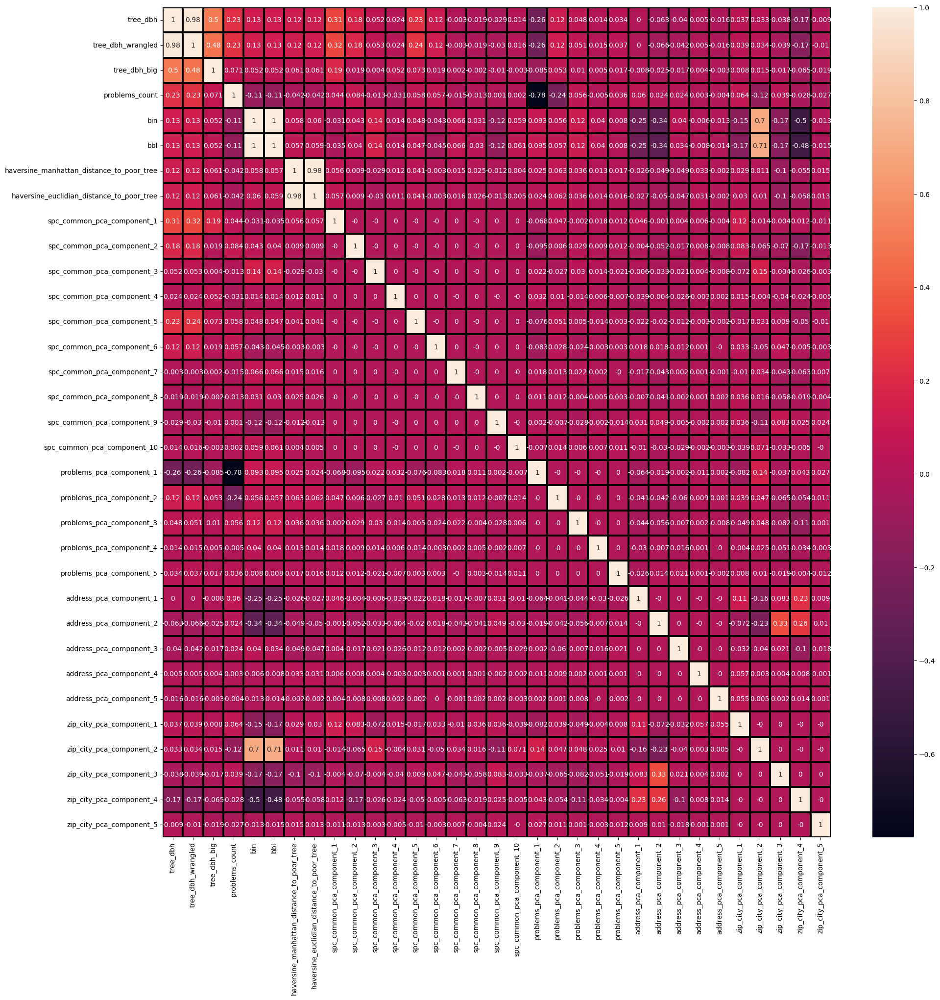

In [261]:
corr = data_prepared[column_float].corr().round(3)
plt.figure(figsize = (22, 22))
sns.heatmap(corr, annot = True, linewidth = 1.5, linecolor = 'black', fmt='.2g')

Для более удобного просмотра взамосвязанных полей матрицу преобразую к таблице вида "переменная", "другая переменная", "коэффициент корреляции" и "коэффициент корреляции по модулю" (для сортировки по убыванию):

In [302]:
corr_pairs = pd.DataFrame(corr.unstack().reset_index()).rename(columns = {0:'Correlation', 'level_0' : 'variable_1', 'level_1' : 'variable_2'})
corr_pairs['Correlation_abs'] = np.abs(corr_pairs['Correlation'])
# corr_pairs = corr_pairs[corr_pairs.Correlation < 1].reset_index(drop = True)
corr_pairs = corr_pairs[pd.DataFrame(np.sort(corr_pairs[['variable_1','variable_2']].values, 1)).duplicated()].reset_index(drop = True)
corr_pairs

,variable_1,variable_2,Correlation,Correlation_abs
0,tree_dbh_wrangled,tree_dbh,0.981,0.981
1,tree_dbh_big,tree_dbh,0.503,0.503
2,tree_dbh_big,tree_dbh_wrangled,0.476,0.476
3,problems_count,tree_dbh,0.227,0.227
4,problems_count,tree_dbh_wrangled,0.234,0.234
...,...,...,...,...
523,zip_city_pca_component_5,address_pca_component_5,0.001,0.001
524,zip_city_pca_component_5,zip_city_pca_component_1,-0.000,0.000
525,zip_city_pca_component_5,zip_city_pca_component_2,-0.000,0.000
526,zip_city_pca_component_5,zip_city_pca_component_3,0.000,0.000


Выбрать порог фильтрации может быть достаточно искуссной задачей, поэтому для данной задачи я выбрал достаточно малый порог в 0.2 по модулю:

In [305]:
corr_pairs[corr_pairs['Correlation_abs'] > 0.2].sort_values('Correlation_abs', ascending = False)

,variable_1,variable_2,Correlation,Correlation_abs
14,bbl,bin,0.997,0.997
27,haversine_euclidian_distance_to_poor_tree,haversine_manhattan_distance_to_poor_tree,0.981,0.981
0,tree_dbh_wrangled,tree_dbh,0.981,0.981
156,problems_pca_component_1,problems_count,-0.779,0.779
411,zip_city_pca_component_2,bbl,0.709,0.709
410,zip_city_pca_component_2,bin,0.699,0.699
1,tree_dbh_big,tree_dbh,0.503,0.503
469,zip_city_pca_component_4,bin,-0.496,0.496
470,zip_city_pca_component_4,bbl,-0.477,0.477
2,tree_dbh_big,tree_dbh_wrangled,0.476,0.476


Некотрая мультиколлинеарность легко объясняется:
- tree_dbh_wrangled формировалось из tree_dbh путем приведления выбросов к значению 35;
- haversine_euclidian_distance_to_poor_tree и haversine_manhattan_distance_to_poor_tree представляют из себя ближайшее расстояние к дереву с качеством "Poor". Поэтому не удивительно, что данные поля сильно похожи;
- problems_pca_component_1 и problems_count формировались из одного поля "problems";
- tree_dbh_big формировался на базе tree_dbh, где для больших значений бралась единица, а для остальных - ноль. Поэтому поля tree_dbh_big, tree_dbh и tree_dbh_wrangled имеют сильную взаимосвязь;

Более сложно с другими полями:
- bbl и bin не имеют информацию о том, что это за поля и для чего они используются;
- Поля bbl и bin имеют небольшую взаимосвязь с PCA-компонентами полей zip_city и address. Возможно данные поля олицетворяют собой некий идентификатор, как-то связанный с пространственным представлением деревьев на карте Нью-Йорка. Выглядит так, что данные поля нельзя использовать в качестве предиктора в чистом виде;
- Есть некотрая взаимосвязь между компонентами PCA-компонентами полей zip_city и address. Причину выявить достаточно сложно, поскольку PCA-уменьшение размерности славится своим ухудшением интерпретируемости результатов. Однако по качественному описанию полей zip_city и address понятно, что район города и адреса будут связаны друг с другом.

Как минимум из полей haversine_euclidian_distance_to_poor_tree и haversine_manhattan_distance_to_poor_tree; tree_dbh_wrangled и tree_dbh; problems_pca_component_1 и problems_count нужно будет выбрать только одно соответственно. Лучше всего выбрать то, которое наиболее тесно связано с целевой переменной.

#### **Сравнение бинарных полей между собой**

Согласно определению из википедии: использование коэффициента корреляции Пирсона на бинарных данных возвращает коэффициент Фи:
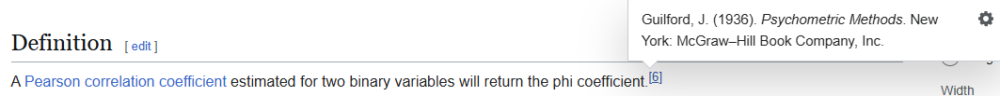

Аналогично числовым данным удобно визуализировать корреляционную матрицу при помощи метода heatmap библиотеки seabron. Здесь еще больше полей, поэтому данная матрица тяжело читаема. В целом видно, что для большинства полей нет явной мультиколлинеарности, однако некоторые поля имеют большую взаимосвязь:

<Axes: >

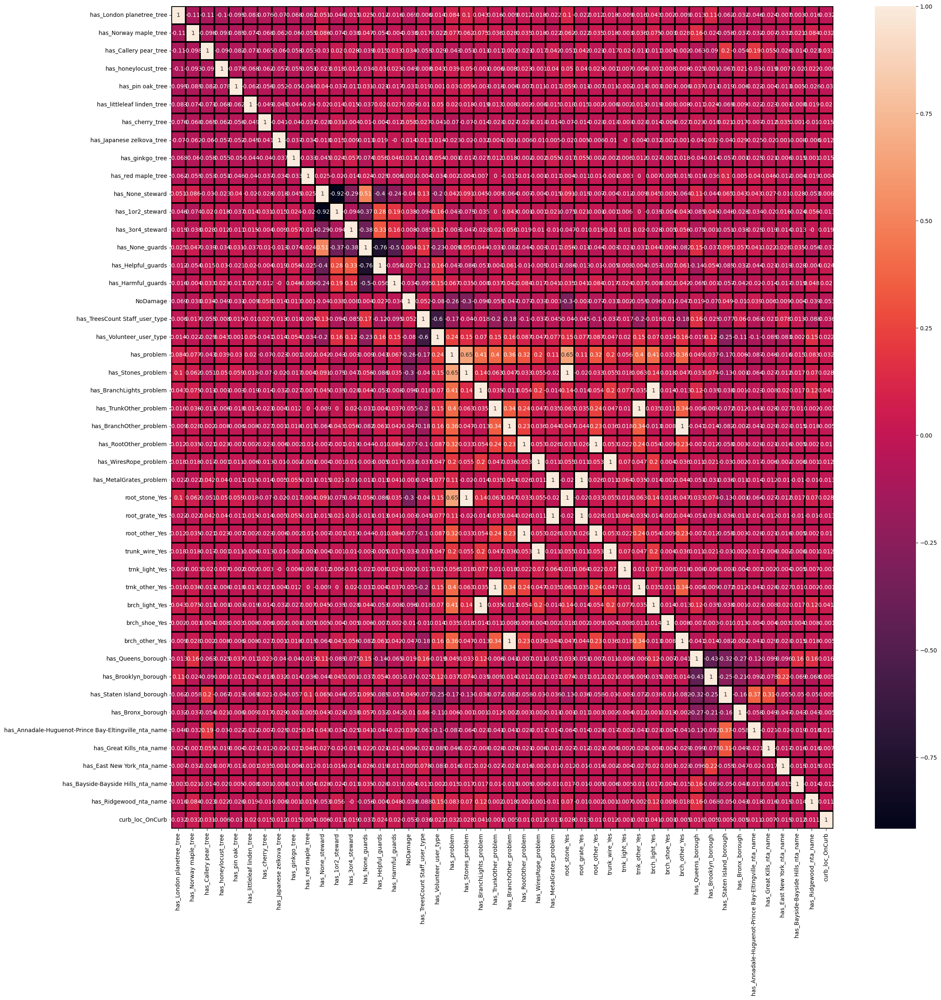

In [324]:
corr = data_prepared[column_binary].corr().round(3)
plt.figure(figsize = (26, 26))
sns.heatmap(corr, annot = True, linewidth = 1.5, linecolor = 'black', fmt='.2g')

In [327]:
corr_pairs = pd.DataFrame(corr.unstack().reset_index()).rename(columns = {0:'Correlation', 'level_0' : 'variable_1', 'level_1' : 'variable_2'})
corr_pairs['Correlation_abs'] = np.abs(corr_pairs['Correlation'])
# corr_pairs = corr_pairs[corr_pairs.Correlation < 1].reset_index(drop = True)
corr_pairs = corr_pairs[pd.DataFrame(np.sort(corr_pairs[['variable_1','variable_2']].values, 1)).duplicated()].reset_index(drop = True)
corr_pairs

,variable_1,variable_2,Correlation,Correlation_abs
0,has_Norway maple_tree,has_London planetree_tree,-0.114,0.114
1,has_Callery pear_tree,has_London planetree_tree,-0.110,0.110
2,has_Callery pear_tree,has_Norway maple_tree,-0.098,0.098
3,has_honeylocust_tree,has_London planetree_tree,-0.104,0.104
4,has_honeylocust_tree,has_Norway maple_tree,-0.093,0.093
...,...,...,...,...
1030,curb_loc_OnCurb,has_Annadale-Huguenot-Prince Bay-Eltingville_n...,0.011,0.011
1031,curb_loc_OnCurb,has_Great Kills_nta_name,0.007,0.007
1032,curb_loc_OnCurb,has_East New York_nta_name,-0.015,0.015
1033,curb_loc_OnCurb,has_Bayside-Bayside Hills_nta_name,-0.012,0.012


In [328]:
corr_pairs[corr_pairs['Correlation_abs'] > 0.2].sort_values('Correlation_abs', ascending = False)

,variable_1,variable_2,Correlation,Correlation_abs
430,root_other_Yes,has_RootOther_problem,1.000,1.000
618,brch_other_Yes,has_BranchOther_problem,1.000,1.000
549,brch_light_Yes,has_BranchLights_problem,1.000,1.000
518,trnk_other_Yes,has_TrunkOther_problem,1.000,1.000
404,root_grate_Yes,has_MetalGrates_problem,1.000,1.000
460,trunk_wire_Yes,has_WiresRope_problem,1.000,1.000
371,root_stone_Yes,has_Stones_problem,1.000,1.000
65,has_1or2_steward,has_None_steward,-0.917,0.917
104,has_Helpful_guards,has_None_guards,-0.759,0.759
370,root_stone_Yes,has_problem,0.645,0.645


Для бинарных переменных мультиколлинеарность можно объяснить так:
- Поля root_other_Yes и has_RootOther_problem; brch_other_Yes и has_BranchOther_problem; brch_light_Yes и has_BranchLights_problem; trnk_other_Yes и has_TrunkOther_problem; root_grate_Yes и has_MetalGrates_problem; trunk_wire_Yes и has_WiresRope_problem; root_stone_Yes и has_Stones_problem имеют функциональную зависимость друг с другом. Так вышло из-за того, что из разных полей сформировались переменные с одинаковыми ошибками из-за сходств изначальных полей. Например, переменная root_other_Yes сформировано из поля root_other, а has_RootOther_problem из поля problems. Поле root_other отражает наличие других проблем с корнями, когда как переменная has_RootOther_problem сформировано на базе значения "RootOther", взятого из поля problems;
- Много бинарных переменных формировались из категориальных полей, в которых содержатся 2+ уникальных значений. Из-за этого вполне очевидно, что между бинарными переменными, сформированные из одного категориального поля, будет отрицательная взаимосвязь. Например, для has_1or2_steward и has_None_steward; has_Helpful_guards и has_None_guards; has_Volunteer_user_type и has_TreesCount Staff_user_type; has_Harmful_guards и has_None_steward;
- Аналогично может быть и положительная корреляция, если формируются несколько разных переменных из одного поля. Например, has_Stones_problem и has_problem. Это также справедливо для root_stone_Yes и has_problem; has_None_guards и has_None_steward.

Переменные root_other_Yes, brch_other_Yes, brch_light_Yes, trnk_other_Yes, root_grate_Yes, trunk_wire_Yes и root_stone_Yes можно отбросить и не формировать как бинарную переменную.

Из переменных has_1or2_steward и has_None_steward; has_Helpful_guards и has_None_guards; has_Volunteer_user_type и has_TreesCount Staff_user_type; has_Harmful_guards и has_None_steward; has_Stones_problem и has_problem; has_None_guards и has_None_steward нужно отобрать наиболее тесно связанную с целевой переменной соответственно.

#### **Сравнение числовых переменных с целевой**

In [345]:
anova_f, anova_p = f_classif(data_prepared[column_float].dropna(), data_prepared[target].values.ravel())
anova_p

array([0.00000000e+000, 0.00000000e+000, 5.27064772e-109, 7.23186025e-272,
       1.51286245e-018, 6.23952332e-020, 0.00000000e+000, 0.00000000e+000,
       2.12117923e-128, 3.65225784e-280, 2.84091802e-110, 4.26042933e-014,
       4.70980081e-121, 2.38584189e-001, 8.52129182e-004, 4.29126950e-033,
       3.49151541e-015, 4.72133116e-009, 5.72039518e-160, 0.00000000e+000,
       3.71484703e-074, 8.87787094e-001, 1.94904914e-042, 7.01109351e-005,
       2.67880371e-016, 8.85669581e-056, 1.46602271e-002, 5.54480845e-001,
       9.36949639e-012, 8.06128920e-006, 4.85991733e-041, 1.09269258e-015,
       3.92508150e-001])

In [346]:
anova_test = pd.Series(anova_p, index = column_float).sort_values()
anova_test.round(6)

tree_dbh                                     0.000000
tree_dbh_wrangled                            0.000000
haversine_manhattan_distance_to_poor_tree    0.000000
haversine_euclidian_distance_to_poor_tree    0.000000
problems_pca_component_2                     0.000000
spc_common_pca_component_2                   0.000000
problems_count                               0.000000
problems_pca_component_1                     0.000000
spc_common_pca_component_1                   0.000000
spc_common_pca_component_5                   0.000000
spc_common_pca_component_3                   0.000000
tree_dbh_big                                 0.000000
problems_pca_component_3                     0.000000
address_pca_component_3                      0.000000
problems_pca_component_5                     0.000000
zip_city_pca_component_3                     0.000000
spc_common_pca_component_8                   0.000000
bbl                                          0.000000
bin                         

In [348]:
anova_test = anova_test.rank()
anova_test

tree_dbh                                      3.0
tree_dbh_wrangled                             3.0
haversine_manhattan_distance_to_poor_tree     3.0
haversine_euclidian_distance_to_poor_tree     3.0
problems_pca_component_2                      3.0
spc_common_pca_component_2                    6.0
problems_count                                7.0
problems_pca_component_1                      8.0
spc_common_pca_component_1                    9.0
spc_common_pca_component_5                   10.0
spc_common_pca_component_3                   11.0
tree_dbh_big                                 12.0
problems_pca_component_3                     13.0
address_pca_component_3                      14.0
problems_pca_component_5                     15.0
zip_city_pca_component_3                     16.0
spc_common_pca_component_8                   17.0
bbl                                          18.0
bin                                          19.0
address_pca_component_2                      20.0


Для переменных, среди которых обязательно нужно было отобрать только одно, делаем следующее:
- haversine_euclidian_distance_to_poor_tree и haversine_manhattan_distance_to_poor_tree - выбираю haversine_manhattan_distance_to_poor_tree, хотя по результатам ANOVA-теста переменные эквивалентны. Предполагаю, что для данной задачи рассчитывать ближайшее расстояние при помощи "манхеттенской" метрики более корректно;
- tree_dbh_wrangled и tree_dbh - выбираю tree_dbh_wrangled, хотя по результатам ANOVA-теста переменные эквивалентны. Всегда предпочтительнее поле с предобработанными выбросами;
- problems_pca_component_1 и problems_count - problems_count, поскольку оно более значимо по результатам ANOVA-теста.

Статистически незначимые переменные все равно оставляем. В случае чего они будут отфильтрованы на этапе "Feature Selection".

#### **Сравнение бинарных переменных с целевой**

In [341]:
chi2_ch, chi2_p = chi2(data_prepared[column_binary], data_prepared[target])
chi2_p

array([1.49858139e-084, 2.45174282e-309, 5.17424975e-008, 3.21784640e-137,
       6.71293961e-072, 1.18243059e-028, 1.35115175e-009, 2.02172866e-028,
       1.80975601e-014, 6.56511030e-007, 6.10151154e-002, 2.88650099e-006,
       3.18846488e-001, 1.80931854e-001, 2.96802365e-002, 1.71816603e-016,
       1.70273040e-011, 4.88087444e-016, 1.28970716e-010, 4.44550495e-110,
       1.96010333e-038, 2.63235898e-016, 0.00000000e+000, 0.00000000e+000,
       1.47855994e-073, 9.50116607e-009, 2.65067671e-009, 1.96010333e-038,
       2.65067671e-009, 1.47855994e-073, 9.50116607e-009, 3.88114667e-001,
       0.00000000e+000, 2.63235898e-016, 1.26400776e-002, 0.00000000e+000,
       2.97555961e-003, 1.90395989e-006, 1.51176887e-001, 8.26828833e-003,
       1.46223479e-016, 5.36886842e-004, 4.63616825e-010, 5.98482431e-002,
       3.24693038e-026, 7.29925995e-001])

In [342]:
chi2_test = pd.Series(chi2_p, index = column_binary).sort_values()
chi2_test.round(6)

has_BranchOther_problem                                  0.000000
has_TrunkOther_problem                                   0.000000
brch_other_Yes                                           0.000000
trnk_other_Yes                                           0.000000
has_Norway maple_tree                                    0.000000
has_honeylocust_tree                                     0.000000
has_problem                                              0.000000
has_London planetree_tree                                0.000000
has_RootOther_problem                                    0.000000
root_other_Yes                                           0.000000
has_pin oak_tree                                         0.000000
root_stone_Yes                                           0.000000
has_Stones_problem                                       0.000000
has_littleleaf linden_tree                               0.000000
has_Japanese zelkova_tree                                0.000000
has_Ridgew

In [343]:
chi2_test_ranked = chi2_test.rank()
chi2_test_ranked

has_BranchOther_problem                                   2.5
has_TrunkOther_problem                                    2.5
brch_other_Yes                                            2.5
trnk_other_Yes                                            2.5
has_Norway maple_tree                                     5.0
has_honeylocust_tree                                      6.0
has_problem                                               7.0
has_London planetree_tree                                 8.0
has_RootOther_problem                                     9.5
root_other_Yes                                            9.5
has_pin oak_tree                                         11.0
root_stone_Yes                                           12.5
has_Stones_problem                                       12.5
has_littleleaf linden_tree                               14.0
has_Japanese zelkova_tree                                15.0
has_Ridgewood_nta_name                                   16.0
has_Anna

Для переменных, среди которых обязательно нужно было отобрать только одно, делаем следующее:
- has_1or2_steward и has_None_steward - has_1or2_steward, поскольку оно более значимо по результатам ANOVA-теста;
- has_Helpful_guards и has_None_guards - has_Helpful_guards, поскольку оно более значимо по результатам ANOVA-теста;
- has_Volunteer_user_type и has_TreesCount Staff_user_type - has_TreesCount Staff_user_type, поскольку оно более значимо по результатам ANOVA-теста;
- has_Harmful_guards и has_None_steward - has_Harmful_guards, поскольку оно более значимо по результатам ANOVA-теста;
- has_Stones_problem и has_problem - has_problem, поскольку оно более значимо по результатам ANOVA-теста;
- has_None_guards и has_None_steward - has_None_steward, поскольку оно более значимо по результатам ANOVA-теста.

Статистически незначимые переменные все равно оставляем. В случае чего они будут отфильтрованы на этапе "Feature Selection".

## **Определение baseline**

Под baseline понимается базовое решение, которое есть/может быть на данный момент, имеющее свою точность и затраты, включая время- и трудозатраты на внедрение и выполнение.

Поскольку мы имеем дело с многоклассовой классификацией, то в качестве базового решения можно просто соотносить все образцы к мажоритарному классу. Всего записей с классом "Good" - 528850 из 652172, что составляет примерно 81%. Это базовая точность на всей совокупности. Однако для лучшего понимания влияния полей на целевую переменную мы прибегали к балансировке классов. На сбалансированном наборе базовая точность будет 33.3%, что соответствует доли каждого из классов в сбалансированной выборке. При таком раскладе точность для остальных классов будет равно нулю.

Также в качестве baseline стоит зафикисровать точность моделей ML/AI на базовом наборе данных без тонкой настройки алгоритмов и отбора признаков.

### **Logistic Regression**

In [390]:
cols = ['tree_dbh_wrangled',
       'tree_dbh_big', 
       'haversine_manhattan_distance_to_poor_tree',
       'haversine_euclidian_distance_to_poor_tree',
       'has_London planetree_tree', 'has_Norway maple_tree',
       'has_Callery pear_tree', 'has_honeylocust_tree', 'has_pin oak_tree',
       'has_littleleaf linden_tree', 'has_cherry_tree',
       'has_Japanese zelkova_tree', 'has_ginkgo_tree', 'has_red maple_tree',
       'spc_common_pca_component_1', 'spc_common_pca_component_2',
       'spc_common_pca_component_3', 'spc_common_pca_component_4',
       'spc_common_pca_component_5', 'spc_common_pca_component_6',
       'spc_common_pca_component_7', 'spc_common_pca_component_8',
       'spc_common_pca_component_9', 'spc_common_pca_component_10',
       'has_None_steward', 'has_1or2_steward', 'has_3or4_steward',
       'has_None_guards', 'has_Helpful_guards', 'has_Harmful_guards',
       'NoDamage', 'has_None_user_type', 'has_Helpful_user_type',
       'has_Harmful_user_type', 'problems_count', 'has_problem',
       'has_Stones_problem', 'has_BranchLights_problem',
       'has_TrunkOther_problem', 'has_BranchOther_problem',
       'has_RootOther_problem', 'has_WiresRope_problem',
       'has_MetalGrates_problem', 'problems_pca_component_1',
       'problems_pca_component_2', 'problems_pca_component_3',
       'problems_pca_component_4', 'problems_pca_component_5',
       'root_stone_Yes', 'root_grate_Yes', 'root_other_Yes', 'trunk_wire_Yes',
       'trnk_light_Yes', 'trnk_other_Yes', 'brch_light_Yes', 'brch_shoe_Yes',
       'brch_other_Yes', 'address_pca_component_1', 'address_pca_component_2',
       'address_pca_component_3', 'address_pca_component_4',
       'address_pca_component_5', 'has_Queens_borough', 'has_Brooklyn_borough',
       'has_Staten Island_borough', 'has_Bronx_borough',
       'zip_city_pca_component_1', 'zip_city_pca_component_2',
       'zip_city_pca_component_3', 'zip_city_pca_component_4',
       'zip_city_pca_component_5',
       'has_Annadale-Huguenot-Prince Bay-Eltingville_nta_name',
       'has_Great Kills_nta_name', 'has_East New York_nta_name',
       'has_Bayside-Bayside Hills_nta_name', 'has_Ridgewood_nta_name',
       'curb_loc_OnCurb',
       'has_TreesCount Staff_user_type', 'has_Volunteer_user_type']

Accuracy: 0.49366065879428217
              precision    recall  f1-score   support

           0    0.52345   0.60123   0.55965      5364
           1    0.41187   0.25224   0.31287      5364
           2    0.50647   0.62756   0.56055      5362

    accuracy                        0.49366     16090
   macro avg    0.48060   0.49368   0.47769     16090
weighted avg    0.48060   0.49366   0.47768     16090



C:\Users\skako\anaconda3\envs\Python_3_13_2\Lib\site-packages\sklearn\linear_model\_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


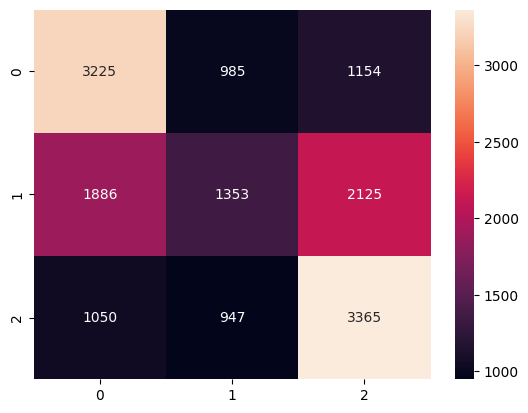

In [396]:
#Creating the dependent variable class
factor = pd.factorize(data['health'])
data.health = factor[0]
definitions = factor[1]

X = data[cols]
y = data['health']

# Creating the Training and Test set from data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.20, stratify = y, random_state = 42)

log_reg = LogisticRegression(random_state = 42)
log_reg = log_reg.fit(X_train, y_train)

y_pred_log_reg = log_reg.predict(X_test)
cm_log_reg = confusion_matrix(y_test, y_pred_log_reg)
# cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis] # для вычисления в процентном соотношении
sns.heatmap(cm_log_reg, annot = True, fmt='.4g')

accuracy_log_reg = accuracy_score(y_test, y_pred_log_reg)
print('Accuracy: {}'.format(accuracy_log_reg))

print(classification_report(y_test, y_pred_log_reg, digits=5))

### **XGBoost**

Accuracy: 0.5855189558732131
              precision    recall  f1-score   support

           0    0.56536   0.67729   0.61628      5364
           1    0.48093   0.44183   0.46055      5364
           2    0.72171   0.63745   0.67697      5362

    accuracy                        0.58552     16090
   macro avg    0.58933   0.58553   0.58460     16090
weighted avg    0.58931   0.58552   0.58459     16090



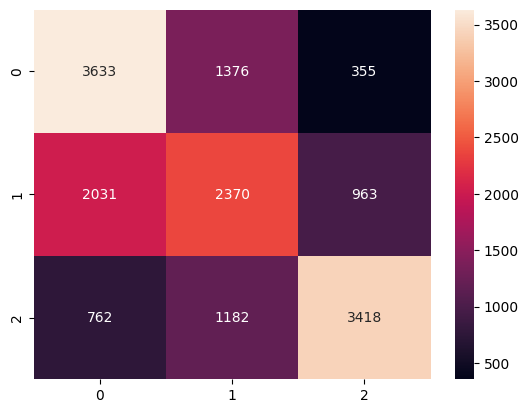

In [397]:
xgb = XGBClassifier(n_estimators = 100)
xgb_model= xgb.fit(X_train, y_train)

y_pred_xgb = xgb_model.predict(X_test)
cm_xgb = confusion_matrix(y_test, y_pred_xgb)
# cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis] # для вычисления в процентном соотношении
sns.heatmap(cm_xgb, annot = True, fmt='.4g')

accuracy_xgb = accuracy_score(y_test, y_pred_xgb)
print('Accuracy: {}'.format(accuracy_xgb))

print(classification_report(y_test, y_pred_xgb, digits=5))

### **Итого**

Итого мы имеем следующее:
- Для всей совокупности базовая точность составляет 81% при условии, что мы соотносим все образцы к классу "Good". Точность для остальных классов равна нулю;
- Для сбалансированной выборки базовая точность равна 33.3%. Точно также при условии, что мы соотносим все образцы к какому-либо классу. Точность для остальных классов равна нулю;
- Модели логистической регрессии (класс LogisticRegression библиотеки scikit-learn) и градиентого бустинга над деревьями решений (класс XGBClassifier библиотеки xgboost) дали точность в 49.37% и 58.55% соответственно на сбалансированной выборки. При тестировании других алгоритмов ML/AI стоит равняться на показатель модели "XGBoost".